# <center><b>Assignment: Predicting future outcomes</b></center>



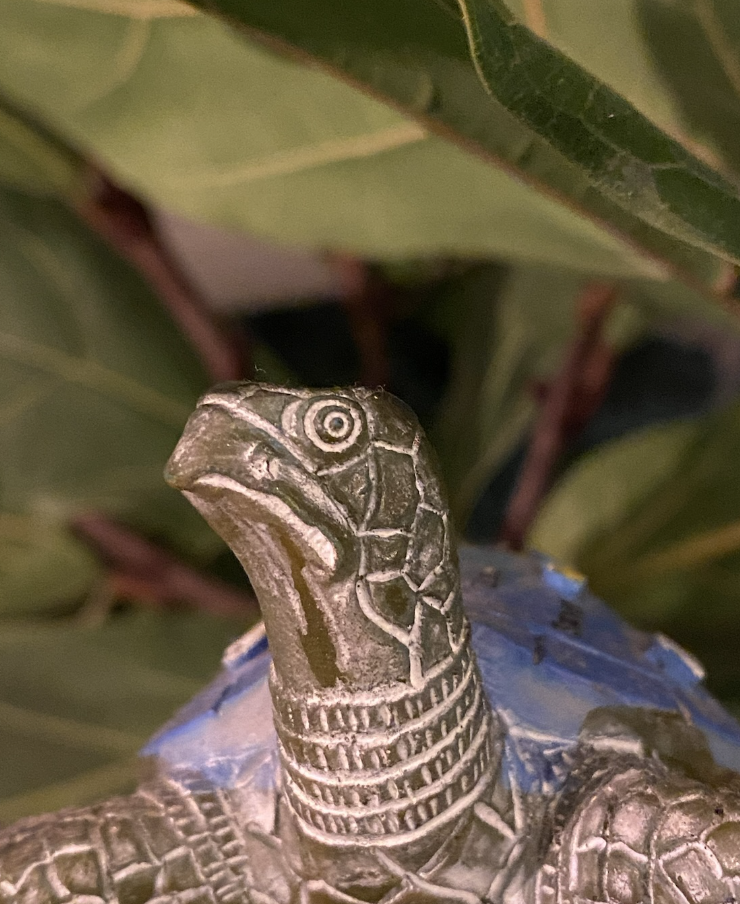



 ## <center><b>Turtle Games</b></center>

 <center><b>LSE Career Accelerator 2024</b></center>

### <center><b> Notebook Directory</b></center> 
These are hyperlinked for your ease of navigation

- [1.1 Importing Data & Sense Checking](#division_ID1)

- [1.2 Initial Exploration](#division_ID2)



- [2.0 Linear Regression](#division_ID2.0)


- [2.1 Normalizing Numbers](#division_ID2.1) 


- [3.0 Linear Regression](#division_ID3.0) 


- [3.1 Further Checks for Homoscadacity](#division_ID3.1)


- [4.0 Conclusion to create, fit, and determine the accuracy of a regression model](#division_ID4.0)


- [5.0 Multiple Linear Regression](#division_ID5.0)


- [5.1 Checking for Multicollinearity](#division_ID5.1)


- [5.2 The Breusch-Pagan Test](#division_ID5.2)

- [6.0 Making Predictions with Clustering](#division_ID6.0)

- [6.1 Building a Pairgrid to explore relationships: Age & Gender](#division_ID6.1)

- [6.2 Let's take a closer look at age brackets ](#division_ID6.2)

- [6.3 Gender](#division_ID6.3)

- [7.0  Determining the appropriate number of clusters for segmentation](#division_ID7.0)


- [7.1 K-Means Predicted = Customer Segmentation by Clustering](#division_ID7.1)

- [7.2 Which Segment is spending the most and how loyal are they?](#division_ID7.2)

- [7.3 Loyalty Score by Age](#division_ID7.3)

- [7.4 Spending Score by Age](#division_ID7.4)

- [7.5 Calculating the weighted score to ascertain the relative importance of each k_means cluster customer segment](#division_ID7.5)


- [7.6 Calculating the weighted score to ascertain the relative importance of each age bracket](#division_ID7.6)



- [8.0 Boxplots for Loyalty, Spending and Remuneration by K-Means Segment](#division_ID8.0)


- [9.0 Assessing Comment and Reviews of Turtle Games: Sentiment Analysis](#division_ID9.0)

- [9.1 Sentiment Intensity Analyser and Polarity Scores](#division_ID9.1)


- [9.2 Extract polarity and subjectivity from Turtle Games comments and reviews](#division_ID9.2)

- [9.3 Sentiment = Results](#division_ID9.3)

- [9.4 Subjectivity By Age](#division_ID9.4)


- [9.5 Semtiment by age, gender and educational attainment](#division_ID9.5)

- [10.0 Word Cloud](#division_ID10.0)

- [10.1 Extract polarity and subjectivity from Turtle Games comments and reviews](#division_ID10.1)

- [11.0 Exploring data with decision trees](#division_ID11.0)

- [11.1 Decision Tree Regressor](#division_ID11.1)

- [11.2 Alternative way to view the pruned tree with dtreeviz](#division_ID11.2)

- [11.3 RANDOM FORREST](#division_ID11.3)

( link to how to hyperlink and also to how to do internal links https://sebastianraschka.com/Articles/2014_ipython_internal_links.html)

In [2]:
import statsmodels.api as sm
from sklearn import datasets
import numpy as np
from sklearn import linear_model
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor
import sklearn
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
import warnings
import matplotlib
matplotlib.matplotlib_fname()
from matplotlib import pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
from sklearn import tree
from sklearn.tree import DecisionTreeRegressor
from sklearn import metrics
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.metrics import classification_report
import statsmodels.api as sm 
from sklearn.model_selection import train_test_split
!pip install dtreeviz


import warnings
warnings.filterwarnings('ignore')


In [3]:
import pandas as pd
from IPython.display import HTML

def horizontal(dfs):
    html = '<div style="display:flex">'
    for df in dfs:
        html += '<div style="margin-right: 32px">'
        html += df.to_html()
        html += '</div>'
    html += '</div>'
    display(HTML(html))

In [4]:
#set up current working directory 
%pwd

'/Users/levonmcgregor'

# <a id="division_ID1">1.1 Importing Data & Sense Checking</a>

In [5]:
#import dataset
reviews = pd.read_csv('turtle_reviews.csv')

In [6]:
reviews.head()

,gender,age,remuneration (k£),spending_score (1-100),loyalty_points,education,language,platform,product,review,summary
0,Male,18,12.30,39,210,graduate,EN,Web,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,Male,23,12.30,81,524,graduate,EN,Web,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,Female,22,13.12,6,40,graduate,EN,Web,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Female,25,13.12,77,562,graduate,EN,Web,263,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,Female,33,13.94,40,366,graduate,EN,Web,291,As my review of GF9's previous screens these w...,Money trap


In [7]:
#sense checking 

print(reviews.shape)
print(reviews.isna().sum())
print(reviews.columns)
print(reviews.duplicated().value_counts())

(2000, 11)
gender                    0
age                       0
remuneration (k£)         0
spending_score (1-100)    0
loyalty_points            0
education                 0
language                  0
platform                  0
product                   0
review                    0
summary                   0
dtype: int64
Index(['gender', 'age', 'remuneration (k£)', 'spending_score (1-100)',
       'loyalty_points', 'education', 'language', 'platform', 'product',
       'review', 'summary'],
      dtype='object')
False    2000
Name: count, dtype: int64


In [8]:
reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   gender                  2000 non-null   object 
 1   age                     2000 non-null   int64  
 2   remuneration (k£)       2000 non-null   float64
 3   spending_score (1-100)  2000 non-null   int64  
 4   loyalty_points          2000 non-null   int64  
 5   education               2000 non-null   object 
 6   language                2000 non-null   object 
 7   platform                2000 non-null   object 
 8   product                 2000 non-null   int64  
 9   review                  2000 non-null   object 
 10  summary                 2000 non-null   object 
dtypes: float64(1), int64(4), object(6)
memory usage: 172.0+ KB


## <a id="division_ID2"> 1.2 Initial Exploration  </a>



In [9]:
#decriptive statistics

reviews_stats =reviews[['remuneration (k£)','spending_score (1-100)','loyalty_points']]

# copy the data 
reviews_stats_max_scaled = reviews_stats.copy() 
  
# apply normalization techniques 
for column in reviews_stats_max_scaled.columns: 
    reviews_stats_max_scaled[column] = reviews_stats_max_scaled[column]  / reviews_stats_max_scaled[column].abs().max() 
      
reviews_stats_max_scaled

reviews_stats_max_scaled.describe()

,remuneration (k£),spending_score (1-100),loyalty_points
count,2000.000000,2000.000000,2000.000000
mean,0.427978,0.505051,0.230471
std,0.205839,0.263583,0.187416
min,0.109489,0.010101,0.003651
25%,0.270073,0.323232,0.112750
50%,0.419708,0.505051,0.186359
75%,0.569343,0.737374,0.255769
max,1.000000,1.000000,1.000000


Text(0.5, 1.0, 'Normalized Descriptive Stats')

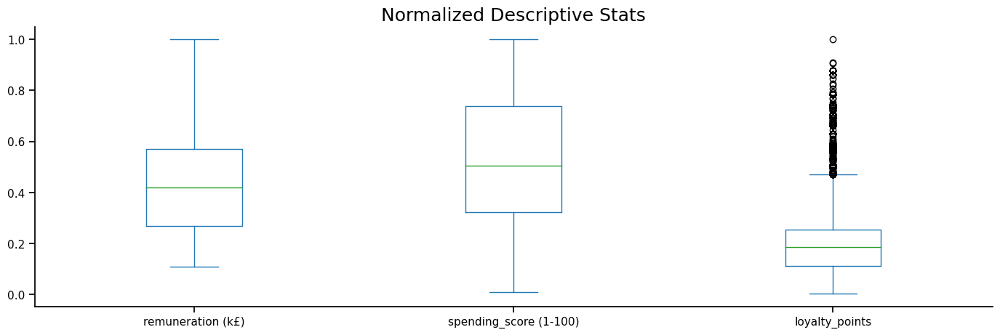

In [10]:
#checking for skewness and outliers 

sns.set_context('notebook')
reviews_stats_max_scaled.plot(kind = 'box', figsize=(17, 5))
sns.despine()
plt.title("Normalized Descriptive Stats",fontsize = 18)

We can see on loyalty the data is positively skewed to the right, whereas the spending data is more evenly or normally distributed and renumeration slightly negative. 

In [11]:
#dropping columns that are not needed at this time 

reviews.drop(['language','platform'], axis=1).head()

,gender,age,remuneration (k£),spending_score (1-100),loyalty_points,education,product,review,summary
0,Male,18,12.30,39,210,graduate,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,Male,23,12.30,81,524,graduate,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,Female,22,13.12,6,40,graduate,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Female,25,13.12,77,562,graduate,263,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,Female,33,13.94,40,366,graduate,291,As my review of GF9's previous screens these w...,Money trap


>Product Numbering Logic : is there a discernable logic?

In [12]:
#exploring what logic there may be to the product numbering system 

print(reviews['product'].max())
print(reviews['product'].min())

11086
107


It would be a question I would pose to the Turtle Games team to understand whether there is a thematic or business logic to the numbering of the games which would aid interpreting customer behaviour and preferences. As we go through the analysis I did not find one that generates patterns in the data

In [13]:
#product bin created 

reviews['product'] = pd.cut(reviews['product'], bins=10, labels=False)
reviews

reviews_prod_bins = reviews 

reviews_prod_bins.head(5)

,gender,age,remuneration (k£),spending_score (1-100),loyalty_points,education,language,platform,product,review,summary
0,Male,18,12.30,39,210,graduate,EN,Web,0,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,Male,23,12.30,81,524,graduate,EN,Web,0,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,Female,22,13.12,6,40,graduate,EN,Web,0,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Female,25,13.12,77,562,graduate,EN,Web,0,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,Female,33,13.94,40,366,graduate,EN,Web,0,As my review of GF9's previous screens these w...,Money trap


>Bining of Age of customers 

In [14]:
#age bin created by quartiles 

reviews['age_bin'] = pd.qcut(reviews['age'], q=4, labels=False)
reviews.head()

,gender,age,remuneration (k£),spending_score (1-100),loyalty_points,education,language,platform,product,review,summary,age_bin
0,Male,18,12.30,39,210,graduate,EN,Web,0,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...,0
1,Male,23,12.30,81,524,graduate,EN,Web,0,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...,0
2,Female,22,13.12,6,40,graduate,EN,Web,0,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless",0
3,Female,25,13.12,77,562,graduate,EN,Web,0,Amazing buy! Bought it as a gift for our new d...,Five Stars,0
4,Female,33,13.94,40,366,graduate,EN,Web,0,As my review of GF9's previous screens these w...,Money trap,1


In [15]:
#renamed columns to make more readable 
reviews.rename(columns = { 'remuneration (k£)':'remuneration','spending_score (1-100)':'spending_score'},inplace = True)
reviews.columns

Index(['gender', 'age', 'remuneration', 'spending_score', 'loyalty_points',
       'education', 'language', 'platform', 'product', 'review', 'summary',
       'age_bin'],
      dtype='object')

In [16]:
reviews.to_csv()


',gender,age,remuneration,spending_score,loyalty_points,education,language,platform,product,review,summary,age_bin\n0,Male,18,12.3,39,210,graduate,EN,Web,0,"When it comes to a DM\'s screen, the space on the screen itself is at an absolute premium. The fact that 50% of this space is wasted on art (and not terribly informative or needed art as well) makes it completely useless. The only reason that I gave it 2 stars and not 1 was that, technically speaking, it can at least still stand up to block your notes and dice rolls. Other than that, it drops the ball completely.",The fact that 50% of this space is wasted on art (and not terribly informative or needed art ...,0\n1,Male,23,12.3,81,524,graduate,EN,Web,0,"An Open Letter to GaleForce9*:\n\nYour unpainted miniatures are very not bad. Your spell cards are great. Your board games are ""meh"". Your DM screens, however, are freaking terrible. I\'m still waiting for a single screen that isn\'t polluted with pointless artwork where useful, re

> other potential variables to isolate and consider include education and gender

In [17]:
#counts of gender
print(reviews['gender'].value_counts())

gender
Female    1120
Male       880
Name: count, dtype: int64


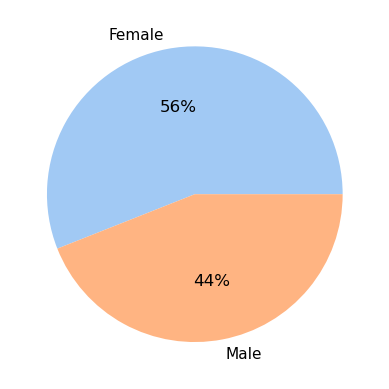

<Figure size 640x480 with 0 Axes>

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_context('notebook')
data = [1120, 880]
labels = ['Female', 'Male']

#define Seaborn color palette to use
colors = sns.color_palette('pastel')[0:5]

#create pie chart
plt.pie(data, labels = labels, colors = colors, autopct='%.0f%%')
plt.show()
plt.savefig("gender_plot.pdf")

In [19]:
print(round(reviews.groupby('gender')[['spending_score','loyalty_points']].mean()),2)

        spending_score  loyalty_points
gender                                
Female            51.0          1601.0
Male              49.0          1549.0 2


A fairly even split between the genders 

In [20]:
print(reviews['education'].value_counts())

education
graduate        900
PhD             460
postgraduate    400
diploma         190
Basic            50
Name: count, dtype: int64


In [21]:
reviews.columns

Index(['gender', 'age', 'remuneration', 'spending_score', 'loyalty_points',
       'education', 'language', 'platform', 'product', 'review', 'summary',
       'age_bin'],
      dtype='object')

# <a id="division_ID2.0"> 2.0 Linear Regression </a>

 

>Overview Pairplot to visualise relationships

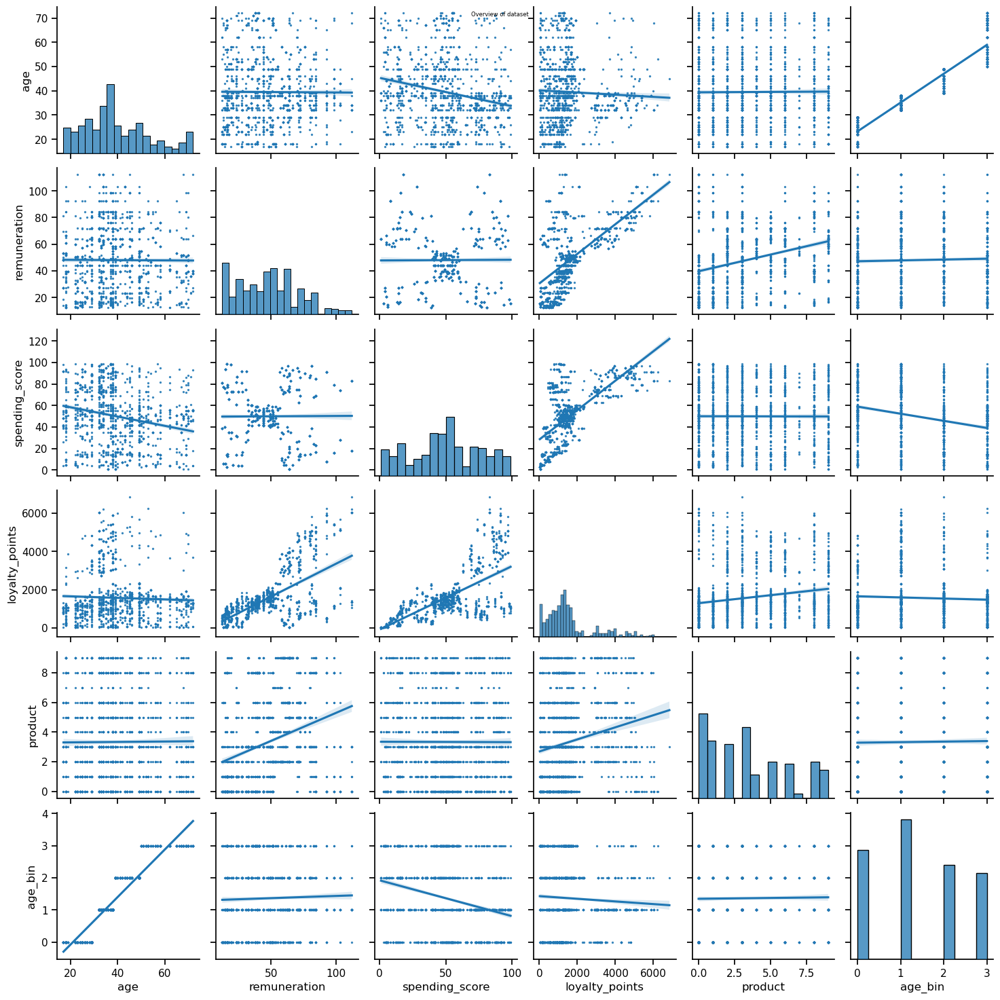

In [22]:
#plot seaborn pairplot

sns.pairplot(reviews,kind = 'reg',
             diag_kind = 'hist',
             plot_kws=dict(scatter_kws=dict(s=2))),
sns.set_context('notebook')
plt.suptitle("Overview of dataset", fontsize = 6 )

plt.savefig("facet_example.pdf")

## <a id="division_ID2.1"> 2.1 Normalizing Numbers    </a>

 

In [23]:
reviews_norm1 = reviews[['remuneration','spending_score','loyalty_points','age']]


# copy the data 
reviews_stats_max_scaled1 = reviews_norm1.copy() 
  
# apply normalization techniques 
for column in reviews_stats_max_scaled1.columns: 
    reviews_stats_max_scaled1[column] = reviews_stats_max_scaled1[column]  / reviews_stats_max_scaled1[column].abs().max() 
      
reviews_stats_max_scaled1

#rounding the number to achieve a Corrleation matrix

correl = round(reviews_stats_max_scaled1.corr(),2)
correl

,remuneration,spending_score,loyalty_points,age
remuneration,1.00,0.01,0.62,-0.01
spending_score,0.01,1.00,0.67,-0.22
loyalty_points,0.62,0.67,1.00,-0.04
age,-0.01,-0.22,-0.04,1.00


<Axes: >

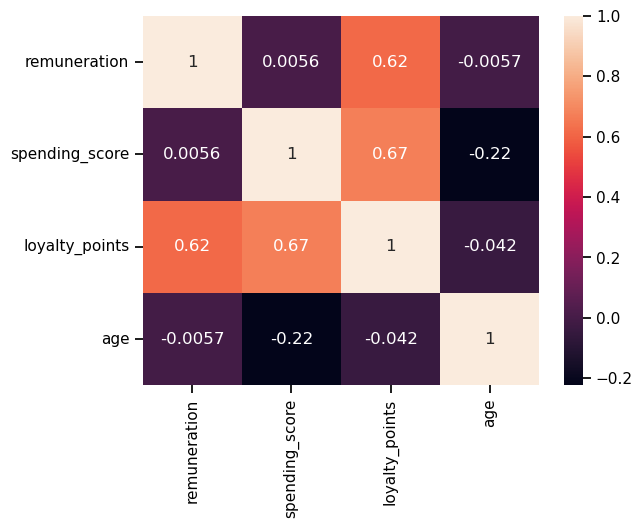

In [24]:
sns.set_context('notebook')
sns.heatmap(reviews_stats_max_scaled1.corr(),annot=True)


at A glance we can see a weak correlation between loyalty point and age but a far stronger one between loyality point and spending score

# <a id="division_ID3.0"> 3.0 Linear Regression </a>


 

>spending score

In [25]:
# Define the dependent variable.
y = reviews['loyalty_points'].values.reshape(-1, 1) 
# Define the independent variable.
x = reviews['spending_score'].values.reshape(-1, 1) 

In [26]:
# Import the necessary package.
from sklearn.linear_model import LinearRegression

# Specify the model.
lm = LinearRegression()

# Fit the model.
lm.fit(x, y) 

LinearRegression()

In [27]:
# Fit the model once again with the train data
# Import the necessary package.
from sklearn.linear_model import LinearRegression

lm.fit(x, y)

LinearRegression()

In [28]:
# Import the sklearn module.
from sklearn.model_selection import train_test_split 

# Create  the subset (70/30); 
# Control the shuffling/avoid variation in values between variables.
x_train, x_test, y_train, y_test = train_test_split(x, y,
                                                    train_size=0.7,
                                                    random_state=100)

In [29]:
# Fit the model once again with the train data

lm.fit(x_train, y_train)

LinearRegression()

In [30]:
# Predict the training set values.
y_pred = lm.predict(x_train) 

# View the output.
y_pred

array([[2960.51213026],
       [ 331.64760616],
       [2893.95859801],
       ...,
       [2794.12829963],
       [ 165.26377552],
       [2394.80710609]])

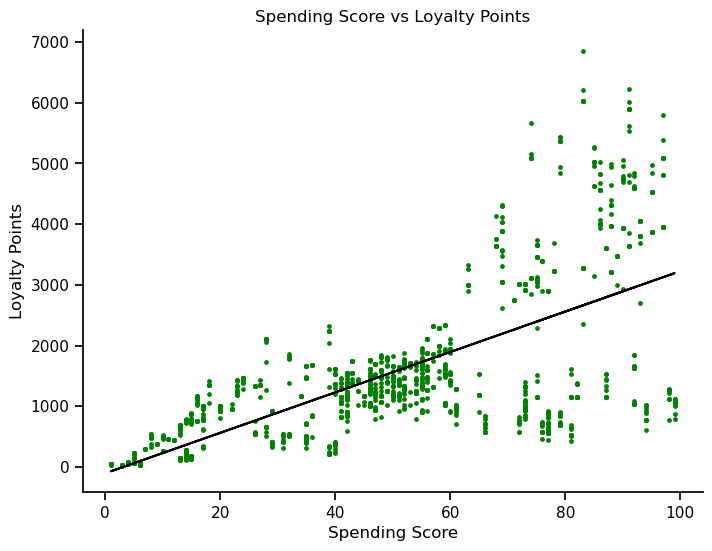

In [31]:
plt.figure(figsize=(8, 6)) 

# Create a scatterplot with a regression line.
plt.scatter(x, y, color = 'green',s=6)  
plt.plot(x_train, y_pred, color = 'black')


# Set the title and legends for the graph.
plt.title("Spending Score vs Loyalty Points")
plt.xlabel("Spending Score")
plt.ylabel("Loyalty Points") 

# Print the graph. 
for pos in ['right', 'top']: 
    plt.gca().spines[pos].set_visible(False) 

plt.show()

In [32]:
# Print R-squared value of the train data.
print("R-squared value: ", lm.score(x_train, y_train)) 

# Print the intercept value.
print("Intercept value: ", lm.intercept_) 

# Print the coefficient value.
print("Coefficient value: ", lm.coef_)

R-squared value:  0.45328036932357607
Intercept value:  [-100.9503535]
Coefficient value:  [[33.27676613]]


>age

In [33]:
# Define the dependent variable.
y = reviews['loyalty_points'].values.reshape(-1, 1) 
# Define the independent variable.
x = reviews['age'].values.reshape(-1, 1) 

In [34]:
# Import the necessary package.
from sklearn.linear_model import LinearRegression

# Specify the model.
lm = LinearRegression()

# Fit the model.
lm.fit(x, y) 

LinearRegression()

In [35]:
# Import the sklearn module.
from sklearn.model_selection import train_test_split 

# Create  the subset (70/30); 
# Control the shuffling/avoid variation in values between variables.
x_train, x_test, y_train, y_test = train_test_split(x, y,
                                                    train_size=0.7,
                                                    random_state=100)

In [36]:
# Fit the model once again with the train data

lm.fit(x_train, y_train)

LinearRegression()

In [37]:
# Predict the training set values.
y_pred = lm.predict(x_train) 

# View the output.
y_pred

array([[1575.72364685],
       [1581.77870364],
       [1575.72364685],
       ...,
       [1554.53094811],
       [1580.26493944],
       [1592.37505301]])

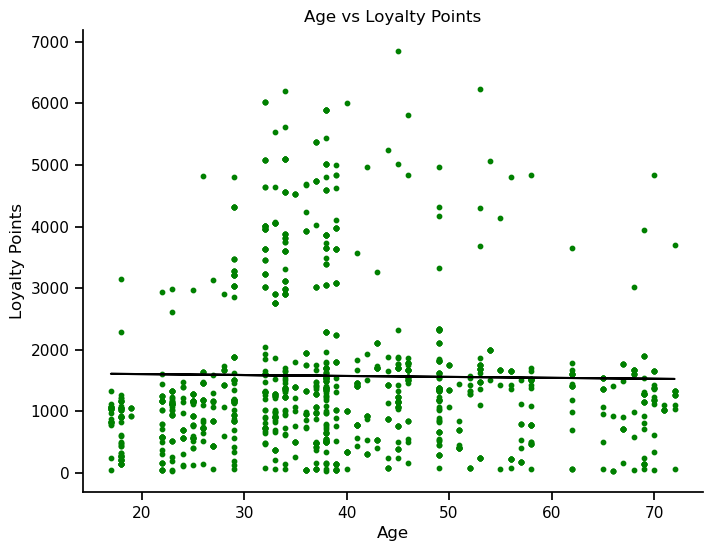

In [38]:
plt.figure(figsize=(8, 6)) 

# Create a scatterplot with a regression line.
plt.scatter(x_train, y_train, color = 'green',s=10)  
plt.plot(x_train, y_pred, color = 'black')

# Set the title and legends for the graph.  
plt.title("Age vs Loyalty Points")
plt.xlabel("Age")
plt.ylabel("Loyalty Points") 

# Print the graph. 

for pos in ['right', 'top']: 
    plt.gca().spines[pos].set_visible(False) 

plt.show() 

In [39]:
# Print R-squared value of the train data.
print("R-squared value: ", lm.score(x_train, y_train)) 

# Print the intercept value.
print("Intercept value: ", lm.intercept_) 

# Print the coefficient value.
print("Coefficient value: ", lm.coef_)

R-squared value:  0.00026381986295254123
Intercept value:  [1633.24668629]
Coefficient value:  [[-1.5137642]]


>renumeration

In [40]:
# Define the dependent variable.
y = reviews['loyalty_points'].values.reshape(-1, 1) 
# Define the independent variable.
x = reviews['remuneration'].values.reshape(-1, 1) 

In [41]:
# Import the necessary package.
from sklearn.linear_model import LinearRegression

# Specify the model.
lm = LinearRegression()

# Fit the model.
lm.fit(x, y) 

LinearRegression()

In [42]:
# Import the sklearn module.
from sklearn.model_selection import train_test_split 

# Create  the subset (70/30); 
# Control the shuffling/avoid variation in values between variables.
x_train, x_test, y_train, y_test = train_test_split(x, y,
                                                    train_size=0.7,
                                                    random_state=100)

In [43]:
# Fit the model once again with the train data

lm.fit(x_train, y_train)

LinearRegression()

In [44]:
# Predict the training set values.
y_pred = lm.predict(x_train) 

# View the output.
y_pred

array([[2382.16664089],
       [ 491.71902918],
       [2551.46045686],
       ...,
       [ 745.65975314],
       [3115.77317677],
       [2382.16664089]])

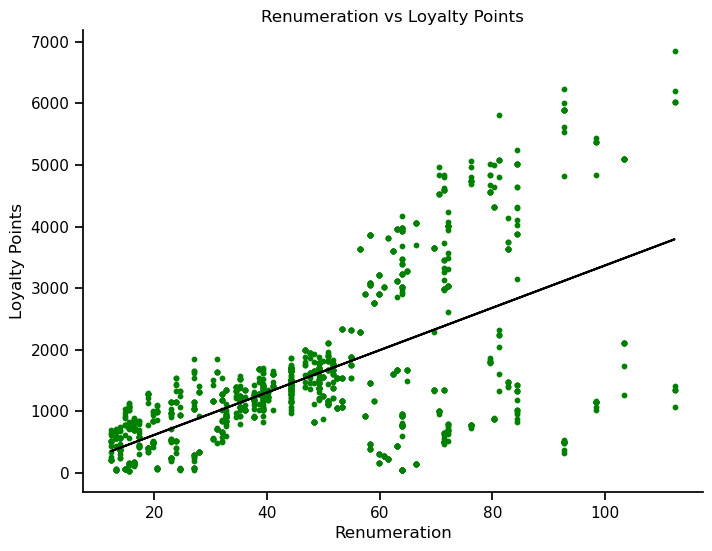

In [45]:
plt.figure(figsize=(8, 6)) 

# Create a scatterplot with a regression line.
plt.scatter(x_train, y_train, color = 'green',s=10)  
plt.plot(x_train, y_pred, color = 'black')

# Set the title and legends for the graph. 

plt.title("Renumeration vs Loyalty Points")
plt.xlabel("Renumeration")
plt.ylabel("Loyalty Points") 

# Print the graph. 

for pos in ['right', 'top']: 
    plt.gca().spines[pos].set_visible(False) 
plt.show()

In [46]:
# Print R-squared value of the train data.
print("R-squared value: ", lm.score(x_train, y_train)) 

# Print the intercept value.
print("Intercept value: ", lm.intercept_) 

# Print the coefficient value.
print("Coefficient value: ", lm.coef_)

R-squared value:  0.3714658970856368
Intercept value:  [-72.59369074]
Coefficient value:  [[34.40931219]]


>Product

In [47]:
# Define the dependent variable.
y = reviews['loyalty_points'].values.reshape(-1, 1) 
# Define the independent variable.
x = reviews['product'].values.reshape(-1, 1)

In [48]:
# Import the necessary package.
from sklearn.linear_model import LinearRegression

# Specify the model.
lm = LinearRegression()

# Fit the model.
lm.fit(x, y) 

LinearRegression()

In [49]:
# Import the sklearn module.
from sklearn.model_selection import train_test_split 

# Create  the subset (70/30); 
# Control the shuffling/avoid variation in values between variables.
x_train, x_test, y_train, y_test = train_test_split(x, y,
                                                    train_size=0.7,
                                                    random_state=100)

In [50]:
# Fit the model once again with the train data

lm.fit(x_train, y_train)

LinearRegression()

In [51]:
# Predict the training set values.
y_pred = lm.predict(x_train) 

# View the output.
y_pred

array([[1749.45463213],
       [1346.58194438],
       [1615.16373621],
       ...,
       [1346.58194438],
       [1883.74552804],
       [1480.87284029]])

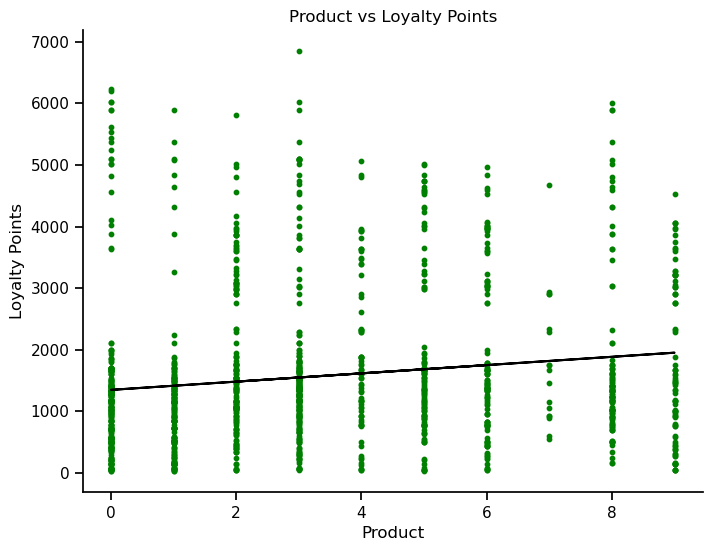

In [52]:
plt.figure(figsize=(8, 6)) 

# Create a scatterplot with a regression line.
plt.scatter(x_train, y_train, color = 'green',s=10)  
plt.plot(x_train, y_pred, color = 'black')

# Set the title and legends for the graph.  
plt.title("Product vs Loyalty Points")
plt.xlabel("Product")
plt.ylabel("Loyalty Points") 

# Print the graph. 


for pos in ['right', 'top']: 
    plt.gca().spines[pos].set_visible(False) 
plt.show()

In [53]:
# Print R-squared value of the train data.
print("R-squared value: ", lm.score(x_train, y_train)) 

# Print the intercept value.
print("Intercept value: ", lm.intercept_) 

# Print the coefficient value.
print("Coefficient value: ", lm.coef_)

R-squared value:  0.022197604408705995
Intercept value:  [1346.58194438]
Coefficient value:  [[67.14544796]]


## <a id="division_ID3.1">3.1 Further Checks for Homoscadacity     </a>

 

>quick review of females

In [54]:
#subsetting the dataset by gender female

reviews_female = reviews[reviews['gender'] == 'Female']

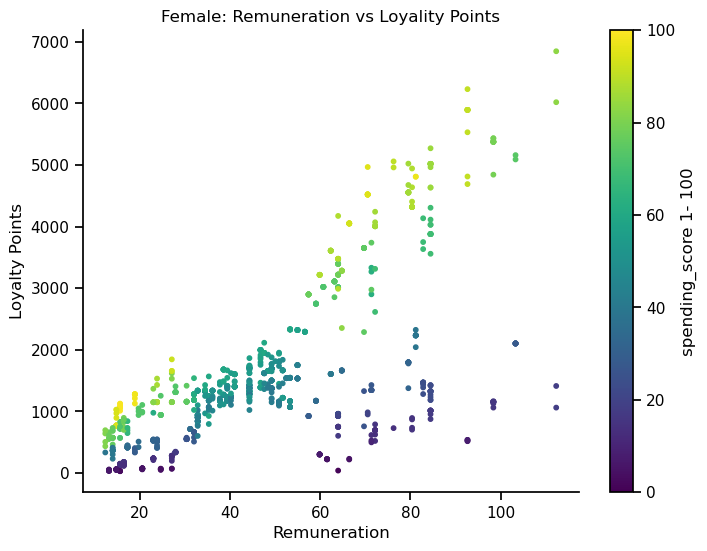

In [55]:
plt.figure(figsize=(8, 6)) 

# Define the dependent variable.
y = reviews_female['loyalty_points'] 

# Define the independent variable.
x = reviews_female['remuneration'] 


plt.xlabel('Remuneration')
plt.ylabel('Loyalty Points')
plt.title('Female: Remuneration vs Loyality Points')

# Check for homoscedasticity with Matplotlib.
plt.scatter(x, y, c = reviews_female['spending_score'], vmin=0, vmax=100,s=10)
plt.colorbar(label='spending_score 1- 100')


for pos in ['right', 'top']: 
    plt.gca().spines[pos].set_visible(False) 
plt.show()

In [56]:
# Define the dependent variable.
y = reviews_female['loyalty_points'].values.reshape(-1, 1) 
# Define the independent variable.
x = reviews_female['remuneration'].values.reshape(-1, 1) 

In [57]:
# Import the necessary package.
from sklearn.linear_model import LinearRegression

# Specify the model.
lm = LinearRegression()

# Fit the model.
lm.fit(x, y) 

LinearRegression()

In [58]:
# Import the sklearn module.
from sklearn.model_selection import train_test_split 

# Create  the subset (70/30); 
# Control the shuffling/avoid variation in values between variables.
x_train, x_test, y_train, y_test = train_test_split(x, y,
                                                    train_size=0.7,
                                                    random_state=100)

In [59]:
# Fit the model once again with the train data

lm.fit(x_train, y_train)

LinearRegression()

In [60]:
# Predict the training set values.
y_pred = lm.predict(x_train) 

# View the output.
y_pred

array([[1668.38640271],
       [1729.26228716],
       [1972.76582497],
       [ 389.99282922],
       [1303.131096  ],
       [2033.64170943],
       [1303.131096  ],
       [1485.75874936],
       [2977.21791843],
       [1364.00698045],
       [ 481.3066559 ],
       [2916.34203398],
       [2977.21791843],
       [2307.58318946],
       [2429.33495836],
       [2124.9555361 ],
       [1150.94138487],
       [ 968.31373151],
       [1759.70022939],
       [2825.0282073 ],
       [2855.46614953],
       [2977.21791843],
       [1485.75874936],
       [2429.33495836],
       [ 450.86871367],
       [1120.50344264],
       [1059.62755819],
       [2794.59026508],
       [1485.75874936],
       [2977.21791843],
       [2216.26936278],
       [1607.51051826],
       [ 329.11694477],
       [3281.59734069],
       [1729.26228716],
       [1120.50344264],
       [1485.75874936],
       [2185.83142056],
       [2490.21084282],
       [2033.64170943],
       [1637.94846049],
       [ 694.372

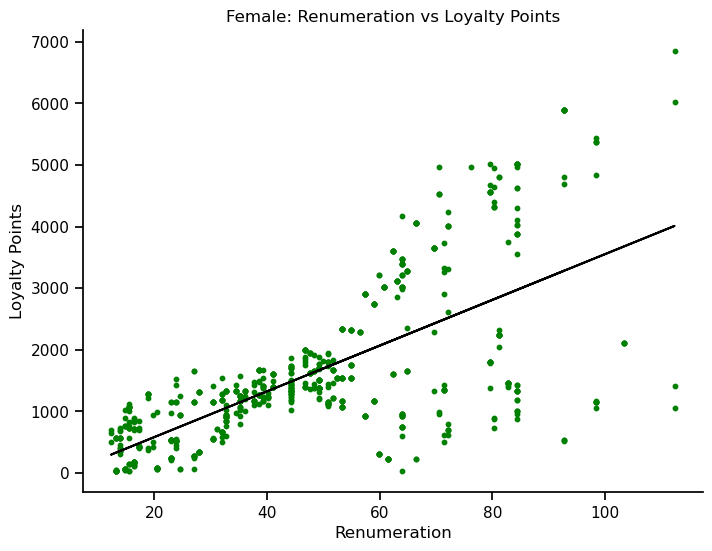

In [61]:
plt.figure(figsize=(8, 6)) 

# Create a scatterplot with a regression line.
plt.scatter(x_train, y_train, color = 'green',s=10)  
plt.plot(x_train, y_pred, color = 'black')

# Set the title and legends for the graph.  
plt.title("Female: Renumeration vs Loyalty Points")
plt.xlabel("Renumeration")
plt.ylabel("Loyalty Points") 

# Print the graph. 

for pos in ['right', 'top']: 
    plt.gca().spines[pos].set_visible(False) 
plt.show()

In [62]:
# Print R-squared value of the train data.
print("R-squared value: ", lm.score(x_train, y_train)) 

# Print the intercept value.
print("Intercept value: ", lm.intercept_) 

# Print the coefficient value.
print("Coefficient value: ", lm.coef_)

R-squared value:  0.45814127732923626
Intercept value:  [-157.89013085]
Coefficient value:  [[37.11944174]]


>quick review of males

In [63]:
#subsetting the dataset by gender male

reviews_male = reviews[reviews['gender'] == 'Male']

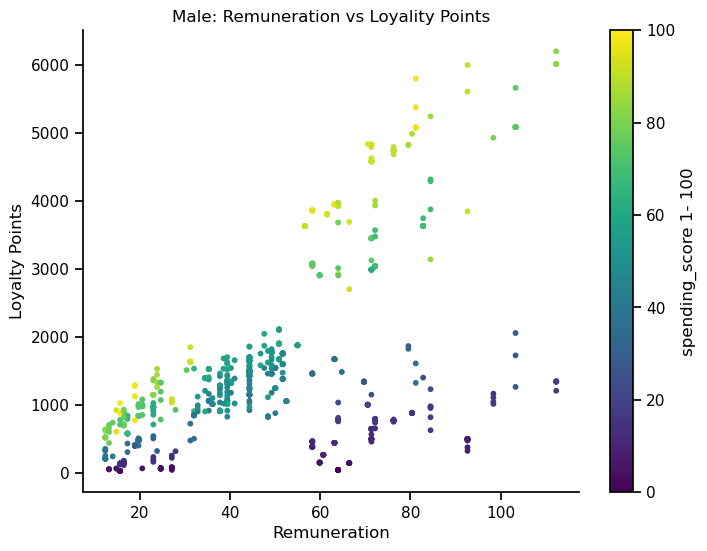

In [64]:
plt.figure(figsize=(8, 6)) 

# Define the dependent variable.
y = reviews_male['loyalty_points'] 

# Define the independent variable.
x = reviews_male['remuneration'] 

plt.xlabel('Remuneration')
plt.ylabel('Loyalty Points')
plt.title('Male: Remuneration vs Loyality Points')

# Check for homoscedasticity with Matplotlib.
plt.scatter(x, y, c = reviews_male['spending_score'], vmin=0, vmax=100, s=10)
plt.colorbar(label='spending_score 1- 100')


for pos in ['right', 'top']: 
    plt.gca().spines[pos].set_visible(False) 
plt.show()

In [65]:
# Define the dependent variable.
y = reviews_male['loyalty_points'].values.reshape(-1, 1) 
# Define the independent variable.
x = reviews_male['remuneration'].values.reshape(-1, 1) 

In [66]:
# Import the necessary package.
from sklearn.linear_model import LinearRegression

# Specify the model.
lm = LinearRegression()

# Fit the model.
lm.fit(x, y) 

LinearRegression()

In [67]:
# Import the sklearn module.
from sklearn.model_selection import train_test_split 

# Create  the subset (70/30); 
# Control the shuffling/avoid variation in values between variables.
x_train, x_test, y_train, y_test = train_test_split(x, y,
                                                    train_size=0.7,
                                                    random_state=100)

In [68]:
# Fit the model once again with the train data

lm.fit(x_train, y_train)

LinearRegression()

In [69]:
# Predict the training set values.
y_pred = lm.predict(x_train) 

# View the output.
y_pred

array([[3269.82808406],
       [ 646.87376326],
       [2266.93378493],
       [1546.90710863],
       [1058.31757829],
       [1238.32424736],
       [2524.08616932],
       [1932.63568522],
       [2421.22521556],
       [1624.05282395],
       [1624.05282395],
       [1932.63568522],
       [2292.64902337],
       [1546.90710863],
       [1006.88710141],
       [1649.76806239],
       [1418.33091643],
       [ 518.29757106],
       [1649.76806239],
       [1675.48330083],
       [2549.80140776],
       [ 518.29757106],
       [2266.93378493],
       [1418.33091643],
       [ 518.29757106],
       [1238.32424736],
       [2626.94712308],
       [ 775.44995545],
       [1264.0394858 ],
       [1906.92044678],
       [1212.60900892],
       [ 544.0128095 ],
       [2266.93378493],
       [1135.4632936 ],
       [1932.63568522],
       [1109.74805516],
       [1418.33091643],
       [1804.05949302],
       [ 646.87376326],
       [2009.78140054],
       [1572.62234707],
       [1264.039

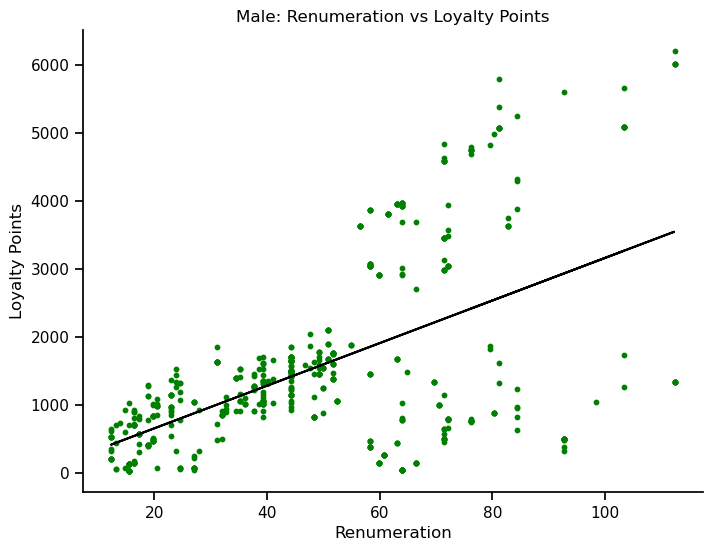

In [70]:
plt.figure(figsize=(8, 6)) 
# Create a scatterplot with a regression line.
plt.scatter(x_train, y_train, color = 'green',s=10)  
plt.plot(x_train, y_pred, color = 'black')

# Set the title and legends for the graph.  
plt.title("Male: Renumeration vs Loyalty Points")
plt.xlabel("Renumeration")
plt.ylabel("Loyalty Points") 

# Print the graph. 

for pos in ['right', 'top']: 
    plt.gca().spines[pos].set_visible(False) 
plt.show()

In [71]:
# Print R-squared value of the train data.
print("R-squared value: ", lm.score(x_train, y_train)) 

# Print the intercept value.
print("Intercept value: ", lm.intercept_) 

# Print the coefficient value.
print("Coefficient value: ", lm.coef_)

R-squared value:  0.2977926966603093
Intercept value:  [29.70804072]
Coefficient value:  [[31.36004688]]


>descriptive stats of gender subsets

In [72]:
df_male = reviews_male.describe().T

>>Male

In [73]:
df_male.columns.name = 'Male Customers: Statistics'
df_male

Male Customers: Statistics,count,mean,std,min,25%,50%,75%,max
age,880.0,40.420455,15.284724,17.0,29.00,38.0,49.50,72.00
remuneration,880.0,49.081659,23.249214,12.3,31.98,49.2,63.96,112.34
spending_score,880.0,49.120455,27.433553,1.0,28.00,51.0,73.00,99.00
loyalty_points,880.0,1548.587500,1323.008802,25.0,724.75,1248.0,1703.00,6208.00
product,880.0,3.380682,2.839561,0.0,1.00,3.0,5.00,9.00
age_bin,880.0,1.443182,1.127361,0.0,0.00,1.0,2.25,3.00


In [74]:
df_female = reviews_female.describe().T

>>Females

In [75]:
df_female.columns.name = 'Female Customers: Statistics'
df_female

Female Customers: Statistics,count,mean,std,min,25%,50%,75%,max
age,1120.0,38.767857,12.016508,17.0,31.250,37.00,46.00,70.00
remuneration,1120.0,47.291304,23.004850,12.3,29.725,46.74,63.96,112.34
spending_score,1120.0,50.691071,24.983196,1.0,34.000,50.00,73.00,99.00
loyalty_points,1120.0,1601.166964,1251.215501,30.0,842.000,1281.00,1752.00,6847.00
product,1120.0,3.306250,2.837568,0.0,1.000,3.00,5.00,9.00
age_bin,1120.0,1.303571,1.016744,0.0,0.750,1.00,2.00,3.00


With standard deviation very similar between the genders on all elements, and females earning sligtly less and spending on average more , with higher loyality points score given to females,it is notable the r sequared value is higher for females than it is males for renumeration. I would concluded that gendered views of this dataset are unlikely to yield strongly differentiated patterns



>education level

In [76]:
#subsetting the data

reviews_edu_basic = reviews[reviews['education'] == 'Basic']
reviews_edu_phd = reviews[reviews['education'] == 'PhD']
reviews_edu_diploma = reviews[reviews['education'] == 'diploma']
reviews_edu_graduate = reviews[reviews['education'] == 'graduate']
reviews_edu_postgrad = reviews[reviews['education'] == 'postgraduate']

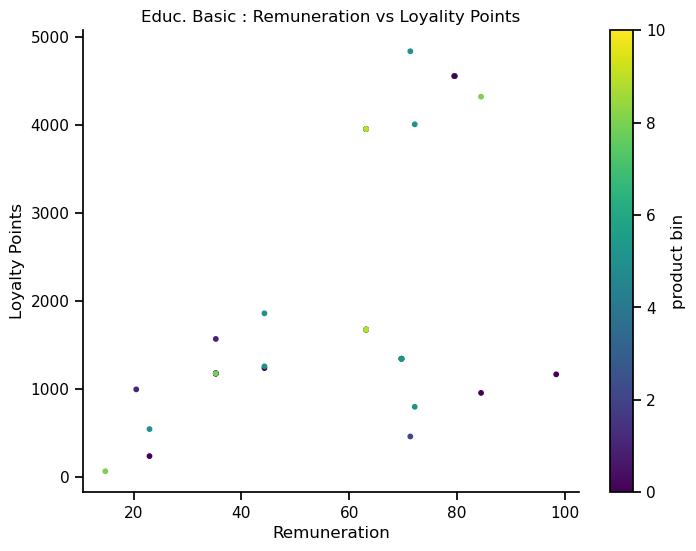

In [77]:
#subsetting by basic education level 

reviews_edu_basic = reviews[reviews['education'] == 'Basic']

plt.figure(figsize=(8, 6))  

# Define the dependent variable.
y = reviews_edu_basic['loyalty_points'] 

# Define the independent variable.
x = reviews_edu_basic['remuneration'] 

plt.xlabel('Remuneration')
plt.ylabel('Loyalty Points')
plt.title('Educ. Basic : Remuneration vs Loyality Points')


# Check for homoscedasticity with Matplotlib.
plt.scatter(x, y, c = reviews_edu_basic['product'], vmin=0, vmax=10,s=10)
plt.colorbar(label='product bin')



for pos in ['right', 'top']: 
    plt.gca().spines[pos].set_visible(False) 
plt.show()

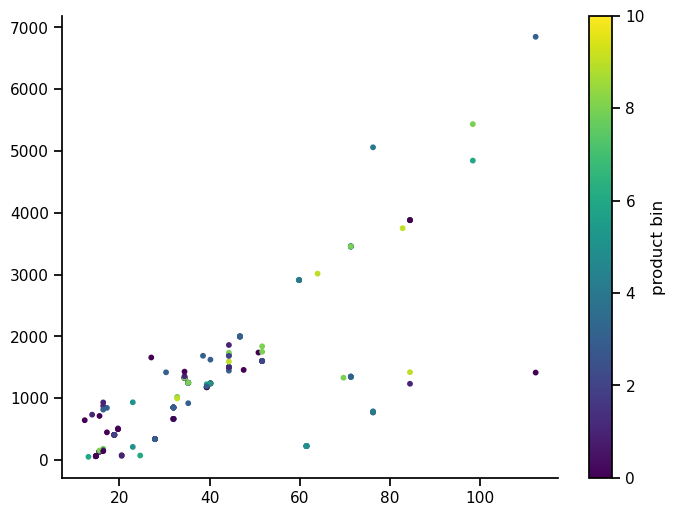

In [78]:
reviews_edu_diploma = reviews[reviews['education'] == 'diploma']

plt.figure(figsize=(8, 6)) 

# Define the dependent variable.
y = reviews_edu_diploma['loyalty_points'] 

# Define the independent variable.
x = reviews_edu_diploma['remuneration'] 

# Check for homoscedasticity with Matplotlib.
plt.scatter(x, y, c = reviews_edu_diploma['product'], vmin=0, vmax=10,s=10)
plt.colorbar(label='product bin')



for pos in ['right', 'top']: 
    plt.gca().spines[pos].set_visible(False) 
plt.show()

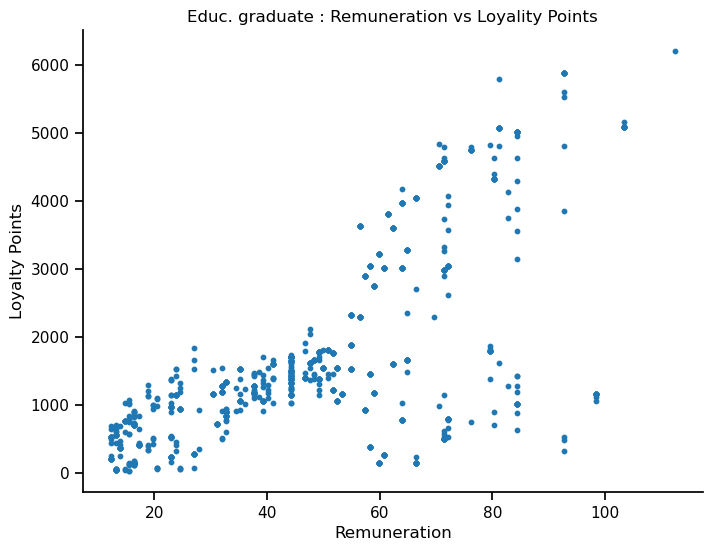

In [79]:
reviews_edu_graduate = reviews[reviews['education'] == 'graduate']

plt.figure(figsize=(8, 6)) 

# Define the dependent variable.
y = reviews_edu_graduate['loyalty_points'] 

# Define the independent variable.
x = reviews_edu_graduate['remuneration'] 



plt.xlabel('Remuneration')
plt.ylabel('Loyalty Points')
plt.title('Educ. graduate : Remuneration vs Loyality Points')

# Check for homoscedasticity with Matplotlib.
plt.scatter(x, y, s=10)


sns.despine()

plt.show()


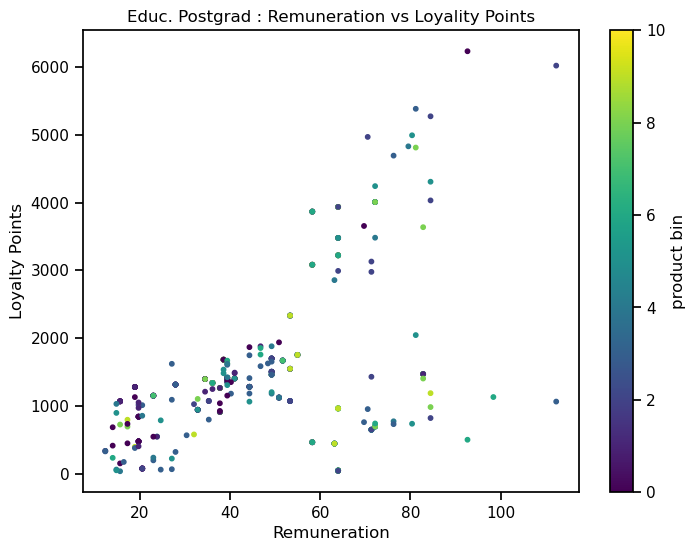

In [80]:
reviews_edu_postgrad = reviews[reviews['education'] == 'postgraduate']

plt.figure(figsize=(8, 6)) 

# Define the dependent variable.
y = reviews_edu_postgrad['loyalty_points'] 

# Define the independent variable.
x = reviews_edu_postgrad['remuneration'] 

plt.xlabel('Remuneration')
plt.ylabel('Loyalty Points')
plt.title('Educ. Postgrad : Remuneration vs Loyality Points')

# Check for homoscedasticity with Matplotlib.
plt.scatter(x, y, c = reviews_edu_postgrad['product'], vmin=0, vmax=10,s=10)
plt.colorbar(label='product bin')

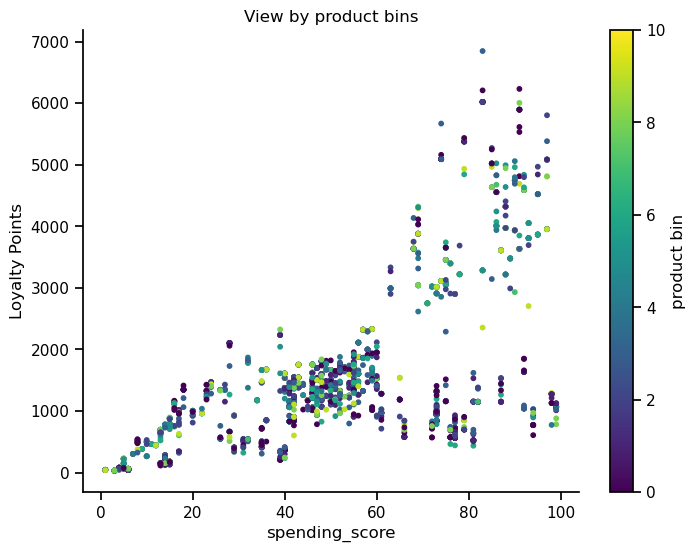

In [81]:
plt.figure(figsize=(8, 6)) 

# Define the dependent variable. 
y = reviews_prod_bins['loyalty_points'] 

# Define the independent variable.
x = reviews_prod_bins['spending_score'] 

plt.xlabel('spending_score')
plt.ylabel('Loyalty Points')
plt.title('View by product bins')


# Check for homoscedasticity with Matplotlib.
plt.scatter(x, y, c = reviews_prod_bins['product'], vmin=0, vmax=10,s=10)
plt.colorbar(label='product bin')



for pos in ['right', 'top']: 
    plt.gca().spines[pos].set_visible(False) 
plt.show()


More evidence that there are few patterns visualised on the data in respect of products. 

>Does removing outliers make a significant difference and do outliers tells us something useful about the overall dataset? Isolate outliers by IQR to find any interesting patterns

In [82]:
#dataframe
reviews

# calculate IQR for column Height
Q1 = reviews['loyalty_points'].quantile(0.25)
Q3 = reviews['loyalty_points'].quantile(0.75)
IQR = Q3 - Q1

# identify outliers
threshold = 1.5
outliers = reviews[(reviews['loyalty_points'] < Q1 - threshold * IQR) | (reviews['loyalty_points'] > Q3 + threshold * IQR)]

outliers.head(5)



,gender,age,remuneration,spending_score,loyalty_points,education,language,platform,product,review,summary,age_bin
123,Male,39,56.58,91,3634,graduate,EN,Web,4,This book is small in size and probably best f...,Small sized...,2
127,Male,38,58.22,95,3866,postgraduate,EN,Web,2,... In a little package. My 6 year old loved m...,Lots of fun...,1
141,Male,34,61.50,93,3808,graduate,EN,Web,3,My son is 5 and LOVES robots. He likes to chan...,robot lover,1
143,Female,34,62.32,87,3610,graduate,EN,Web,2,My one-year-old got this as a birthday present...,Doesn't hold up well,1
145,Male,32,63.14,97,3954,Basic,EN,Web,2,This is a poorly put together piece of junk. W...,Junk,1


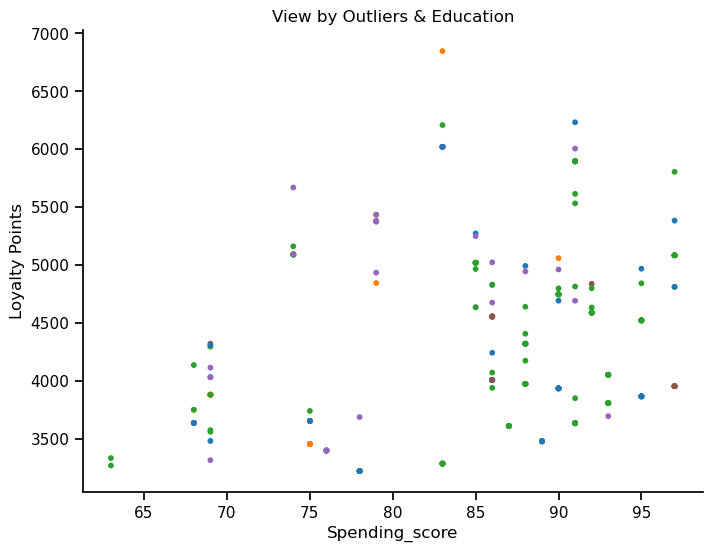

In [83]:
plt.figure(figsize=(8, 6)) 

# Define the dependent variable.
y = outliers['loyalty_points'] 

# Define the independent variable.
x = outliers['spending_score'] 

c = {'Basic':'tab:brown', 
          'diploma':'tab:orange',
          'graduate':'tab:green', 
          'postgraduate':'tab:blue', 
          'PhD':'tab:purple'}


plt.xlabel('Spending_score')
plt.ylabel('Loyalty Points')
plt.title('View by Outliers & Education')
sns.despine()

# Check for homoscedasticity with Matplotlib.
plt.scatter(x, y, c=outliers['education'].map(c),s=10)

In [84]:
# drop rows containing outliers
reviewsIQR = reviews.drop(outliers.index)

In [85]:
print(reviewsIQR.shape)
print(reviews.shape)
print(outliers.shape)

(1734, 12)
(2000, 12)
(266, 12)


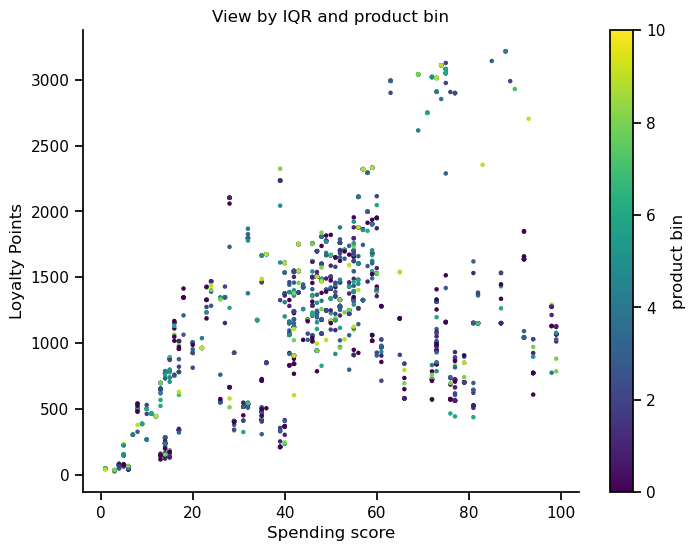

In [86]:
plt.figure(figsize=(8, 6)) 

# Define the dependent variable. 
y = reviewsIQR['loyalty_points']  

# Define the independent variable.
x = reviewsIQR['spending_score'] 


plt.xlabel('Spending score')
plt.ylabel('Loyalty Points')
plt.title('View by IQR and product bin')


# Check for homoscedasticity with Matplotlib.
plt.scatter( x, y, c = reviewsIQR['product'], vmin=0, vmax=10, s=5)

sns.despine()
plt.colorbar(label='product bin')

Conclusion: Neither Outliers nor conclusion have a discernable impact on the distrution of the data

# <a id="division_ID4.0">4.0 Conclusion to create, fit, and determine the accuracy of a regression model.</a>

 

In [87]:
#creating dataframe to summarise results of single linear regression


data = {'Summary': ['R-squared value', 'Intercept value', 'Coefficient value'],
        'Spending Score vs Loyality Points':[0.2977926967,29.70804072,31.36004688 ],
        'Age vs Loyality Points':[0.000263819863,1633.246686,-1.5137642],
        'Remuneration vs Loyality Points':[0.3714658971,-72.59369074,34.40931219],
        'Product vs Loyalty Points':[0.02308309804,1304.524483,0.06169818],
        'Male: Remuneration vs Loyality Points':[0.2977926967,29.70804072,31.36004688],
        'Female: Remuneration vs Loyality Points':[0.4581412773,-157.8901309,37.11944174 ]}

df = pd.DataFrame(data)
df  = df.T.reset_index()
df

new_header = df.iloc[0] #grab the first row for the header
df = df[1:] #take the data less the header row
df.columns = new_header #set the header row as the df header

df = df.sort_values('R-squared value',ascending=False)
df 

,Summary,R-squared value,Intercept value,Coefficient value
6,Female: Remuneration vs Loyality Points,0.458141,-157.890131,37.119442
3,Remuneration vs Loyality Points,0.371466,-72.593691,34.409312
1,Spending Score vs Loyality Points,0.297793,29.708041,31.360047
5,Male: Remuneration vs Loyality Points,0.297793,29.708041,31.360047
4,Product vs Loyalty Points,0.023083,1304.524483,0.061698
2,Age vs Loyality Points,0.000264,1633.246686,-1.513764


The dataframe above shows the summary with the highest coefficient and r squared date going to 'Female: Remuneration vs Loyality Points', followed by 'Remuneration vs Loyality Points'. These shows where the independent variable has had the greatest impact on the dependent variable. Age and Product loyality are the least. This is confirmed in the initial pairplot visualisation shown earlier in 2.0

# <a id="division_ID5.0">5.0 Multiple Linear Regression</a>

 

>spending score & renumeration = X & loyality point = y 

In [88]:
# Define the dependent variable.
y = reviews['loyalty_points'] 
# Define the independent variable.
X = reviews[['spending_score', 'remuneration']]

These variables chosen for X are because of their high r squared and coefficient values 

In [89]:
# Fit the regression model.
mlr = linear_model.LinearRegression()
mlr.fit(X, y) 

LinearRegression()

In [90]:
# Call the predictions for X (array).
mlr.predict(X)

array([ 4.57831319e-01,  1.38195101e+03, -1.05713790e+03, ...,
        4.44147048e+03,  2.16956070e+03,  1.71137682e+03])

In [91]:
## 4. Check the value of R-squared, the intercept, and the coefficients

In [92]:
# Print the R-squared value.
print("R-squared: ", mlr.score(X,y))  

# Print the intercept.
print("Intercept: ", mlr.intercept_) 

# Print the coefficients.
print("Coefficients:")  

# Map a similar index of multiple containers (to be used as a single entity).
list(zip(X, mlr.coef_))

R-squared:  0.8269134701989259
Intercept:  -1700.3050970144384
Coefficients:


[('spending_score', 32.892694687821), ('remuneration', 33.97949882180285)]

In [93]:
# Create a variable 'Spending score' and define it as 99
New_spending_score = 99

# Create 'New_renumeration' and define it as 130
New_renumeration = 130.0

# Print the predicted value. 
print ("Predicted Value: \n", mlr.predict([[New_spending_score ,New_renumeration]])) 

Predicted Value: 
 [5973.40652391]


In [94]:
# Split the data in 'train' (80%) and 'test' (20%) sets.
X_train, X_test, Y_train, Y_test = sklearn.model_selection.train_test_split(X, y,
                                                                            test_size = 0.20,
                                                                            random_state = 42)

In [95]:
# Training the model using the 'statsmodel' OLS library.
# Fit the model with the added constant.
model = sm.OLS(Y_train, sm.add_constant(X_train)).fit()

# Set the predicted response vector.
Y_pred = model.predict(sm.add_constant(X_test)) 

# Call a summary of the model.
print_model = model.summary()

# Print the summary.
print(print_model)

                            OLS Regression Results                            
Dep. Variable:         loyalty_points   R-squared:                       0.830
Model:                            OLS   Adj. R-squared:                  0.830
Method:                 Least Squares   F-statistic:                     3895.
Date:                Sun, 12 May 2024   Prob (F-statistic):               0.00
Time:                        20:26:38   Log-Likelihood:                -12307.
No. Observations:                1600   AIC:                         2.462e+04
Df Residuals:                    1597   BIC:                         2.464e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const          -1700.3237     39.588    -42.

Intially starting with x = spending_score and renumeration: p values are small and suggest that the x veriables are statistically significant. This is supported by the R sqared and the ajd r squared number also at 83%. 

The F-statistic signals whether there is a least 1 significant explanatory independent variable and this test is sucessfully met with the reading for Prob (F-statistic) of  0.00. This is further supported by the coeffients of x.

When age is added as well to x, alongside spending_score and renumeration, there was no change on the F-statistic, and p values remain at 0 and so all 3 are statistically significant. the r squared and the adjusted r squared do increase by 1% to 84.2% and so I believe this improves the model without it being compromised with the risk of overfitting. 

So for every 1 units of increase in the loyality score (y) we find a corrponding increase of 33 units in spending score, 34 units in renumeration. The increases with the addition of age slightly and the change in adjusted r squared is small and justifies the additional variable. 





In [96]:
# Specify the model.
mlr = LinearRegression()  

# Fit the model. We can only fit the model with the training data set.
mlr.fit(X_train, Y_train)

LinearRegression()

In [97]:
# Call the predictions for X in the test set.
y_pred_mlr = mlr.predict(X_test)  

# Print the predictions.
print("Prediction for train set: {}".format(y_pred_mlr)) 

Prediction for train set: [ -725.11711735  2976.65149188  2644.50590347  1416.28990278
  1434.2479047   1535.45165243   709.53845826  1358.38381754
  1577.07452533  3212.92022784  1170.66219209  1588.48826342
  1589.70563198  2360.07003078  1201.63127443  1582.78139438
  1642.74224297   657.71921584  -106.10091912  -833.24510268
  1354.27429082  -188.12929636  1754.52233399  1256.34267501
  1422.83416662  1616.64263488  3855.98127081  1541.53849524
  1742.27120111  1956.16988192   128.11305348   859.2893165
  1075.54528717  1575.01976198  1484.84977857  1179.64119305
   979.28846095  1756.19712359  1517.4936505    979.28846095
  1217.15453924  1577.07452533  1440.79216854  4253.41460309
  4257.06670877  -454.98714089  1575.01976198  1434.2479047
  1474.65340904  1468.94654     1548.46273285   960.11309046
   796.89373078  -647.57824059  1640.30750585  1527.31004626
   311.72515222  3974.30562567  1548.46273285  3233.31296689
  1306.94454888  1517.4936505   1283.27967791  1434.2479047
 

In [98]:
# Print the R-squared value.
print(mlr.score(X_test, Y_test)*100) 

81.44236432529975


## <a id="division_ID5.1">5.1 Checking for Multicollinearity</a>

 

In [99]:
# Add a constant.
x_temp = sm.add_constant(X_train) 

# Create an empty DataFrame. 
vif = pd.DataFrame() 


# Calculate the 'vif' for each value.
vif["VIF Factor"] = [variance_inflation_factor(x_temp.values, 
                                               i) for i in range(x_temp.values.shape[1])] 


# Create the feature columns.
vif['features'] = x_temp.columns  

# Print the values to two decimal points.
print(vif.round(2))

   VIF Factor        features
0        8.91           const
1        1.00  spending_score
2        1.00    remuneration


In [100]:
from statsmodels.formula.api import ols


# Run the OLS model on the data.
f = 'y ~ X'

test = ols(f, data = reviews).fit()

In [101]:
test

## <a id="division_ID5.2">5.2 The Breusch-Pagan Test</a>



In [102]:
# Import the necessary library.
import statsmodels.stats.api as sms

# Run the Breusch-Pagan test function on the model residuals and x-variables.
test = sms.het_breuschpagan(test.resid, test.model.exog)

# Print the results of the Breusch-Pagan test.
terms = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
print(dict(zip(terms, test)))

{'LM stat': 53.72656673047227, 'LM Test p-value': 2.1548858465031367e-12, 'F-stat': 27.563432744523077, 'F-test p-value': 1.55452636297145e-12}


Here we can see the **p value does exceed 5%,  we therefore cannot reject the null hypothesis, and we can be sure that homoscadacity is present**

In [103]:
# Call the ‘metrics.mean_absolute_error’ function.  
print('Mean Absolute Error (Final):', metrics.mean_absolute_error(Y_test, Y_pred))  

# Call the ‘metrics.mean_squared_error’ function.
print('Mean Square Error (Final):', metrics.mean_squared_error(Y_test, Y_pred))  

Mean Absolute Error (Final): 429.6636201690913
Mean Square Error (Final): 300944.0917834269


Text(0.5, 0, 'remuneration')

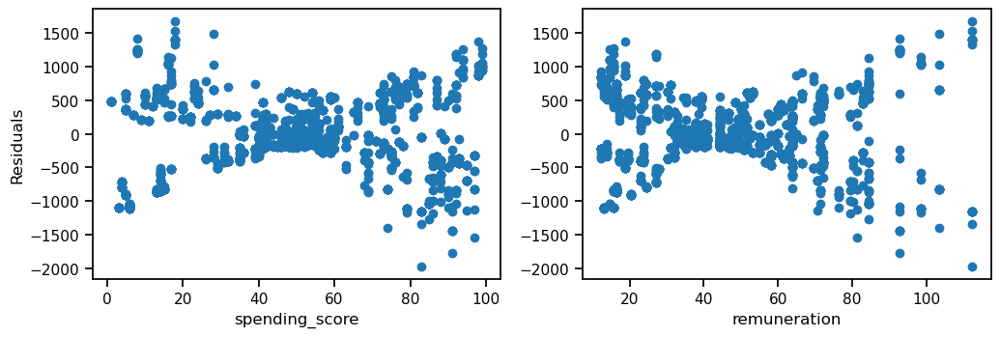

In [104]:
residuals = model.predict()-Y_train


# Plot the residuals=(y-predict - y-observe) versus the x-variables.
# Ideally, there should be no pattern in this plot

fig = plt.figure(figsize=(12, 8))

plt.subplot(2,2,1)
plt.scatter(X_train["spending_score"], residuals)
plt.xlabel("spending_score")
plt.ylabel("Residuals")
plt.subplot(2,2,2)
plt.scatter(X_train["remuneration"], residuals)
plt.xlabel("remuneration")



The residuals here do appear to be randomly scattered, indicating the stregnth of the modelling output as the average veriable

In [105]:
from statsmodels.graphics.gofplots import qqplot
from scipy.stats import shapiro

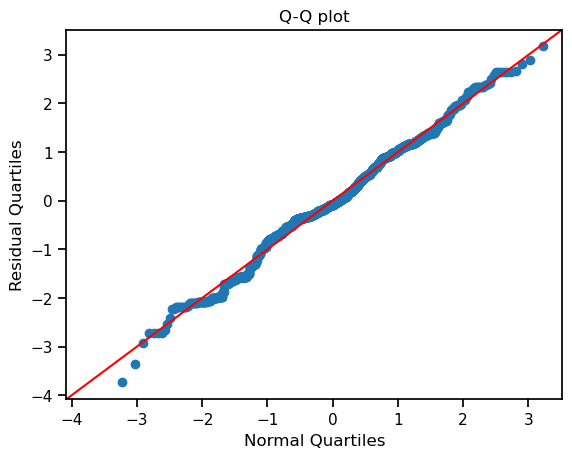

In [106]:
sm.qqplot(residuals, fit=True, line='45')
plt.ylabel("Residual Quartiles")
plt.xlabel("Normal Quartiles")
plt.title("Q-Q plot")
plt.show()

The Q-Q plot hear does satifisy broadly the need for the data to be normally distributed


In [107]:
#review dataframe, subsett relevant columns in preparation for VIF calculations 
print(reviews.head())
print(reviews.dtypes)
reviews_sub = reviews.drop(['gender','education','language','platform','review','summary','age_bin'], axis = 1)
reviews_sub.head()

   gender  age  remuneration  spending_score  loyalty_points education  \
0    Male   18         12.30              39             210  graduate   
1    Male   23         12.30              81             524  graduate   
2  Female   22         13.12               6              40  graduate   
3  Female   25         13.12              77             562  graduate   
4  Female   33         13.94              40             366  graduate   

  language platform  product  \
0       EN      Web        0   
1       EN      Web        0   
2       EN      Web        0   
3       EN      Web        0   
4       EN      Web        0   

                                              review  \
0  When it comes to a DM's screen, the space on t...   
1  An Open Letter to GaleForce9*:\n\nYour unpaint...   
2  Nice art, nice printing.  Why two panels are f...   
3  Amazing buy! Bought it as a gift for our new d...   
4  As my review of GF9's previous screens these w...   

                         

,age,remuneration,spending_score,loyalty_points,product
0,18,12.30,39,210,0
1,23,12.30,81,524,0
2,22,13.12,6,40,0
3,25,13.12,77,562,0
4,33,13.94,40,366,0


In [108]:
#calculationg VIF


X = reviews_sub.drop('loyalty_points', axis = 1)
y = reviews_sub['loyalty_points']

# Import the VIF package.
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Create a VIF dataframe.
vif_data = pd.DataFrame()
vif_data['feature'] = X.columns
  
# Calculate VIF for each feature.
vif_data['VIF'] = [variance_inflation_factor(X.values, i)
                          for i in range(len(X.columns))]

# View the DataFrame.
vif_data.sort_values('VIF',ascending=True)

,feature,VIF
3,product,2.596320
2,spending_score,3.306839
0,age,4.395119
1,remuneration,4.959372


The values here are less than 5 showing we do not have an issue with multicolinarity

general check for correlation amongst variables

<Axes: >

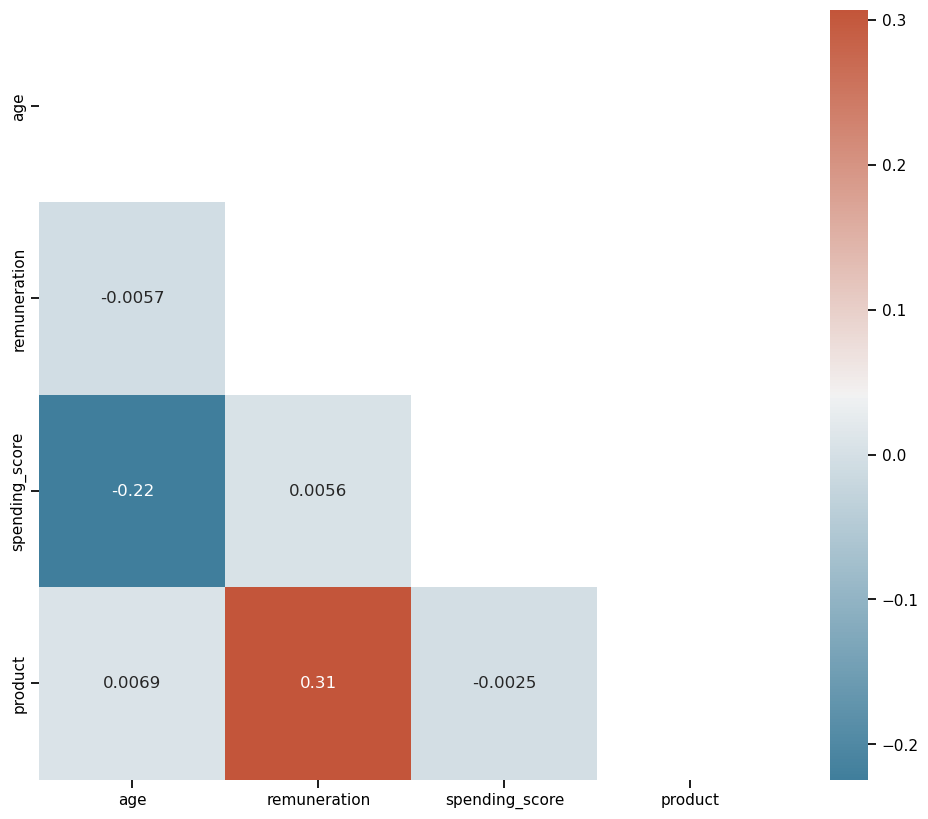

In [109]:
# checking for correlation among variables
import seaborn as sns
corr = reviews_sub.drop('loyalty_points', axis = 1).corr()
f, ax = plt.subplots(figsize=(12, 10))
mask = np.triu(np.ones_like(corr, dtype=bool))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr, annot=True, mask = mask, cmap=cmap)

overall little correlation amongst variables

# <a id="division_ID6.0">6.0 Making Predictions with Clustering    </a>

   

### Objective: Use k-means clustering to identify the optimal number of clusters, and then apply and plot the data using the created segments.

In [110]:
print(reviews.shape)
print(reviews.columns)

(2000, 12)
Index(['gender', 'age', 'remuneration', 'spending_score', 'loyalty_points',
       'education', 'language', 'platform', 'product', 'review', 'summary',
       'age_bin'],
      dtype='object')


In [111]:
reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   gender          2000 non-null   object 
 1   age             2000 non-null   int64  
 2   remuneration    2000 non-null   float64
 3   spending_score  2000 non-null   int64  
 4   loyalty_points  2000 non-null   int64  
 5   education       2000 non-null   object 
 6   language        2000 non-null   object 
 7   platform        2000 non-null   object 
 8   product         2000 non-null   int64  
 9   review          2000 non-null   object 
 10  summary         2000 non-null   object 
 11  age_bin         2000 non-null   int64  
dtypes: float64(1), int64(5), object(6)
memory usage: 187.6+ KB


In [112]:
reviews.duplicated().sum()

0

>Creating Age Brackets by binning

In [113]:
reviews_age_bin = pd.cut(reviews['age'], bins=6).value_counts()

reviews['age_bracket'] = pd.cut(x=reviews['age'], 
                                bins=[17, 25, 34, 43, 52, 72 ], 
                                labels = ['under 25', '25-34','35-43','44-53','over 53'])

In [114]:
#checking dataframe 
reviews.value_counts('age_bracket')

age_bracket
35-43       530
25-34       500
over 53     340
44-53       320
under 25    280
Name: count, dtype: int64

In [115]:
#changing Datatype to flot for easier calculations on spending_score column 

#df['NumericData_Float'] = df['NumericData'].astype(float)

reviews['spending_score']=reviews['spending_score'].astype(float)
reviews_subset = reviews[['remuneration','spending_score','loyalty_points']]

Text(0.5, 1.0, 'scatter Plot: Renumeration & Spending Score')

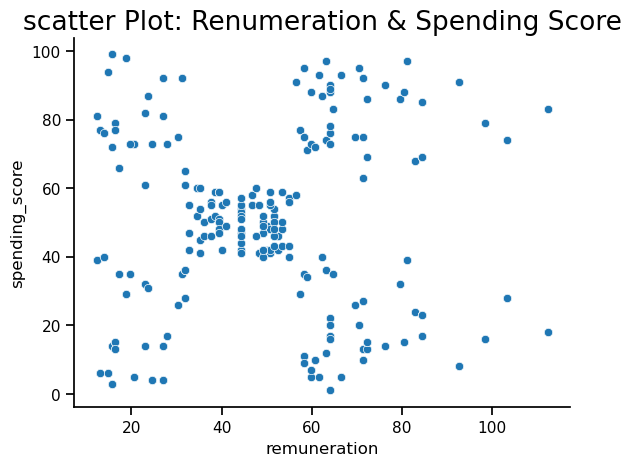

In [116]:
# Create a scatterplot with Seaborn.

sns.scatterplot(x='remuneration',
                y='spending_score',
                data=reviews_subset)

sns.despine()

plt.title("scatter Plot: Renumeration & Spending Score",fontsize=19)


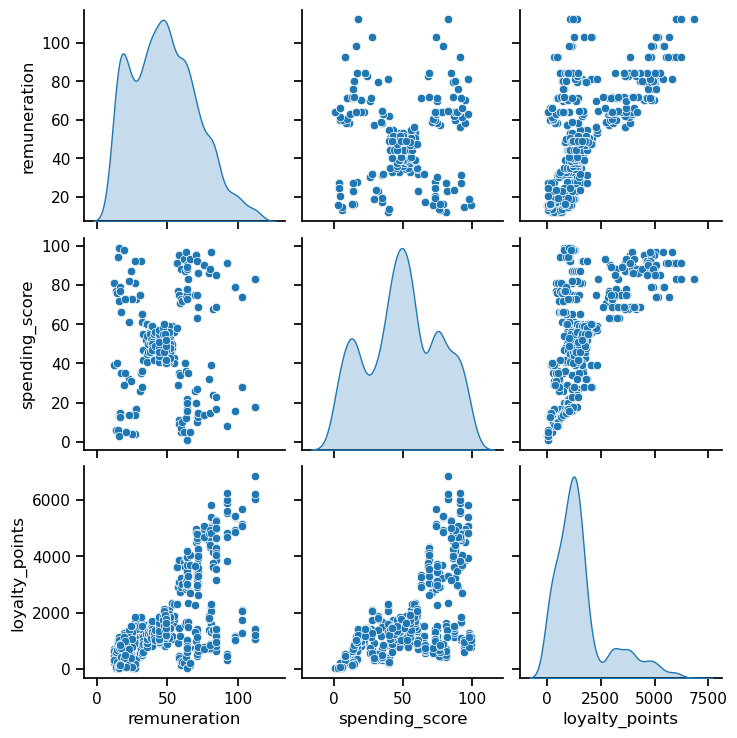

In [117]:
# Create a pairplot with Seaborn.

vars_x = reviews_subset

sns.pairplot(reviews_subset,
             vars=vars_x,
             diag_kind= 'kde')

#plt.title("Pairplot Plot: Loyalty, Remuner. Spending",fontsize=10)

# <a id="division_ID6.1"> 6.1  Building a Pairgrid to explore relationships: Age & Gender </a>



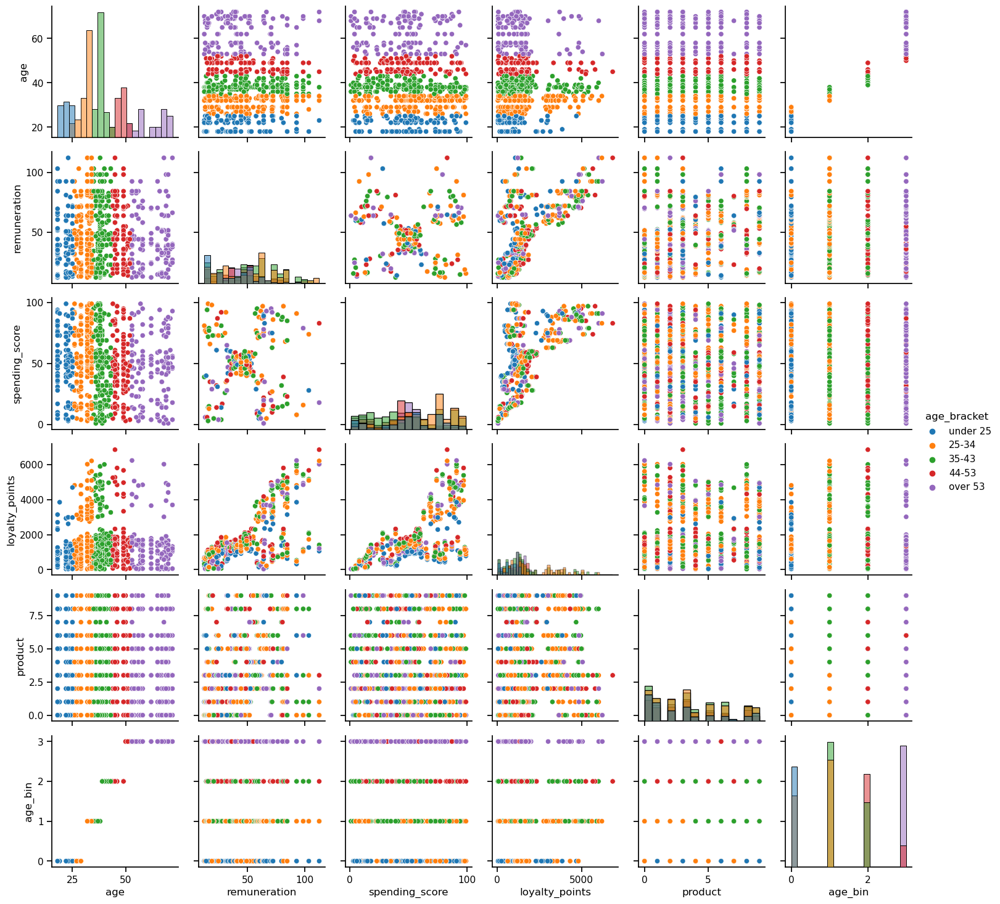

In [118]:
#We continue with the reviews data for the purposes of exploration,/ 
#leveraging age bin created earlier to spot patterns

g = sns.PairGrid(reviews, hue="age_bracket")
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()
sns.set_context('talk')
plt.savefig("PairGrid_plot.pdf")

### <a id="division_ID6.2">6.2 Let's take a closer look at age brakets </a>



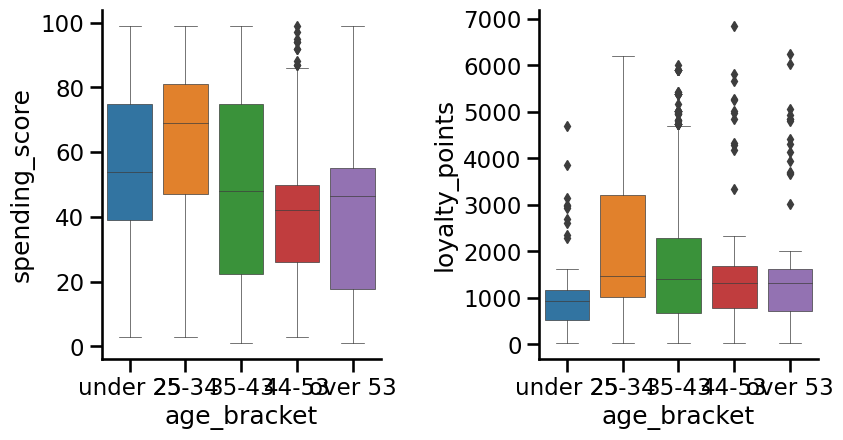

In [119]:
#checking for skewness and outliers

spend_age_bins = reviews[['spending_score','age_bracket']]
loyalty_age_bins = reviews[['loyalty_points','age_bracket']]

#reviews['age_bracket'].plot(kind = 'box', figsize=(17, 5))

plt.rcParams["figure.figsize"] = [9.00, 5.00]
plt.rcParams["figure.autolayout"] = True

f, axes = plt.subplots(1, 2)

sns.set_context("paper",rc={"lines.linewidth": 0.5},font_scale=1)

sns.boxplot( data=spend_age_bins, x='age_bracket', y='spending_score',  orient='v', ax=axes[0])

sns.boxplot(data=loyalty_age_bins, x='age_bracket', y='loyalty_points', orient='v', ax=axes[1])

sns.despine()
plt.tight_layout(pad=3.0)
plt.show()


The 25-34 age group have the highest loyalty score.  75% of this group have a higher spending score than all other age groups. The under 25s appear to be the least loyal. 

The 25-34 age group have the highest loyalty score.  75% of this group have a higher spending score than all other age groups. The under 25s appear to be the least loyal. 

On loyality score it would be good to know how this is compiled and to understand more about the relationship between Turtle games and the customer: is this a subscription on an impulse purchase event and would it be interesting to calculate Customer Lifetime Value to assess the true value of a cohort?

In [120]:
spend_age_bins

,spending_score,age_bracket
0,39.0,under 25
1,81.0,under 25
2,6.0,under 25
3,77.0,under 25
4,40.0,25-34
...,...,...
1995,69.0,35-43
1996,8.0,35-43
1997,91.0,25-34
1998,16.0,25-34


# <a id="division_ID6.3">6.3 Gender</a>

 

In [121]:
reviews_cluster_g = reviews[['age_bracket','gender']]

reviews_cluster_g


gender = pd.crosstab(reviews_cluster_g['age_bracket'], reviews_cluster_g['gender'], normalize=True)

gender

gender = gender.reset_index()

gender

#pd.crosstab(reviews_cluster_g.age_bracket,reviews_clusters_g.gender)


#gender = pd.crosstab(reviews_cluster_g.age_bracket,reviews_clusters_g.gender)
#gender.reset_index()



gender,age_bracket,Female,Male
0,under 25,0.081218,0.060914
1,25-34,0.152284,0.101523
2,35-43,0.157360,0.111675
3,44-53,0.096447,0.065990
4,over 53,0.076142,0.096447


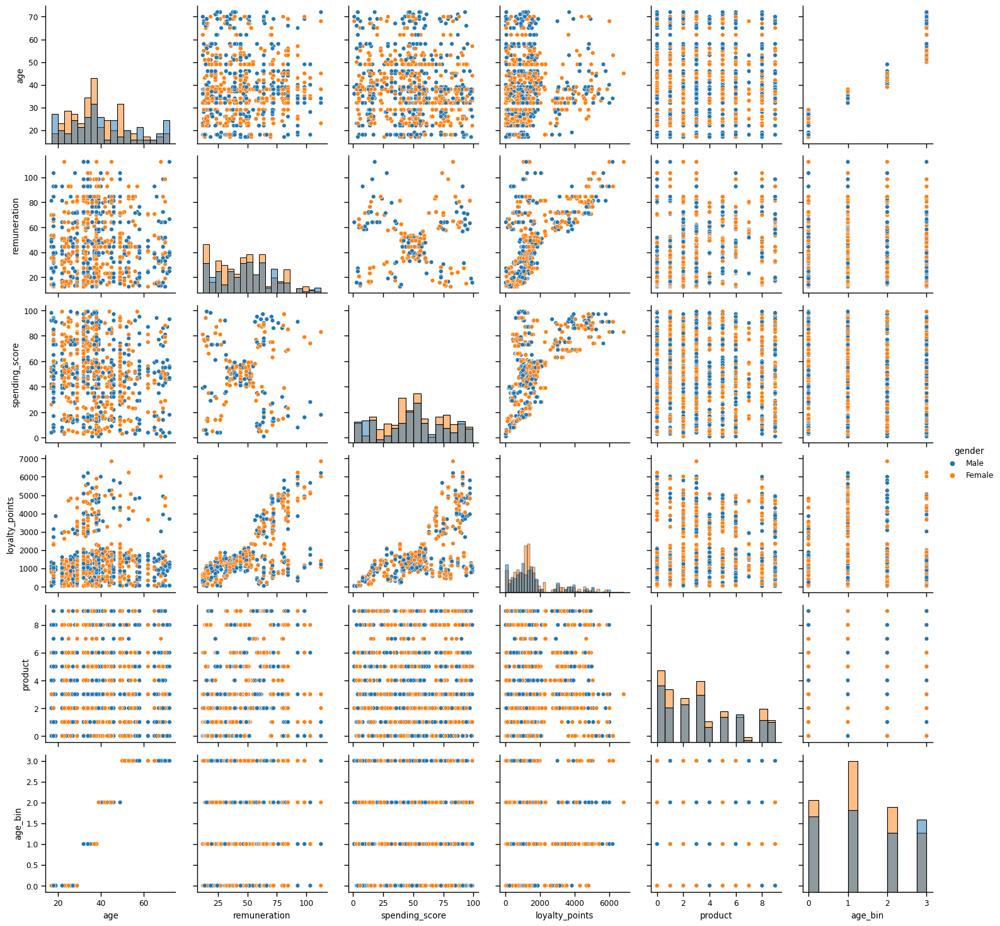

In [122]:
#colour of marker denotes gender

g = sns.PairGrid(reviews, hue="gender")
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()
plt.savefig("PairGrid_plot.pdf")


In [123]:


Gender_summary = reviews.groupby('gender')[['spending_score','loyalty_points']].mean()
Gender_summary

,spending_score,loyalty_points
gender,,
Female,50.691071,1601.166964
Male,49.120455,1548.587500


I conclude there is no compelling gender related correlations revealed in the data

There does seems to be some clustering around product numbers but we lack sufficient information to understand whether the products were serially numbered at random or with a business/marketing logic. I would like futher information on this point

>Age

<Axes: xlabel='remuneration', ylabel='loyalty_points'>

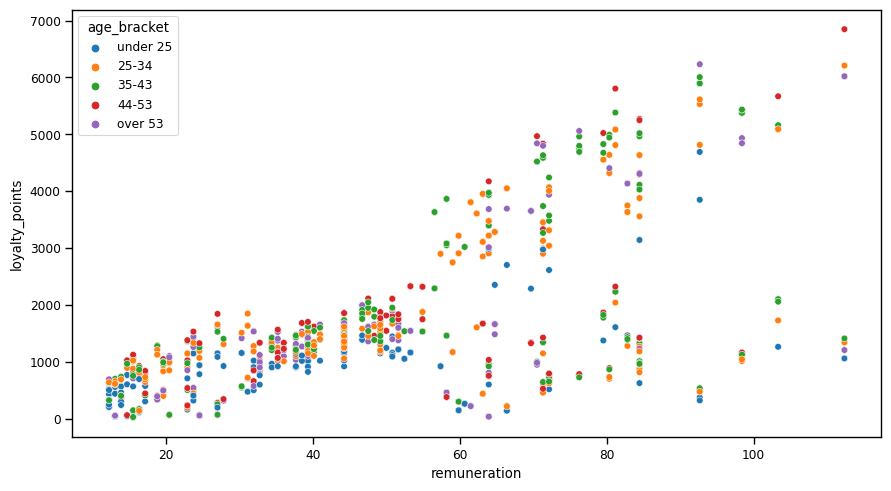

In [124]:
# Create a scatterplot with Seaborn.
sns.scatterplot(x='remuneration',
                y='loyalty_points',
                hue='age_bracket',
                data=reviews)

No obvious patterns in age related scatter

# <a id="division_ID7.0">7.0  Determining the appropriate number of clusters for segmentation</a>

 

Silohette and Elbow Method

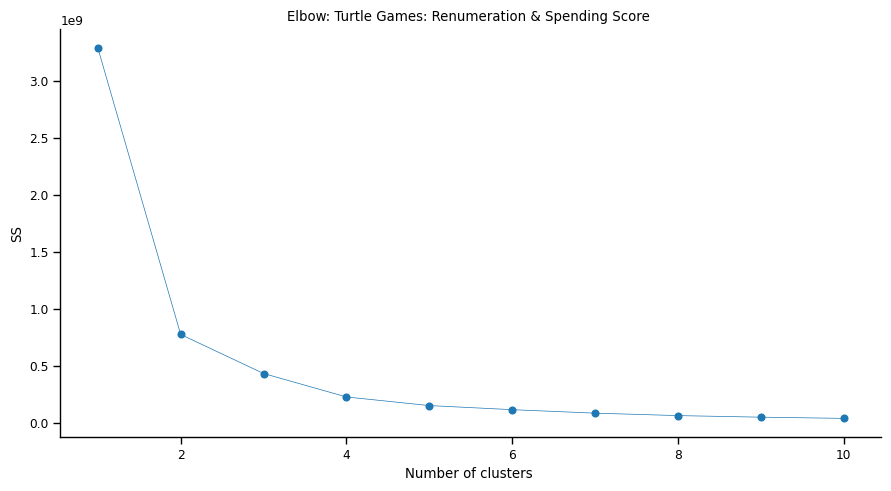

In [125]:

x = reviews[['remuneration','loyalty_points','spending_score']]
ss = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters = i,
                    init = 'k-means++', 
                    max_iter = 500,
                    n_init = 10,
                    random_state = 42)
    kmeans.fit(x)
    ss.append(kmeans.inertia_)
plt.plot(range(1, 11),
         ss,
         marker='o')

plt.title("Elbow: Turtle Games: Renumeration & Spending Score ")
plt.xlabel("Number of clusters ")
plt.ylabel("SS")


for pos in ['right', 'top']: 
    plt.gca().spines[pos].set_visible(False)
    
plt.show()

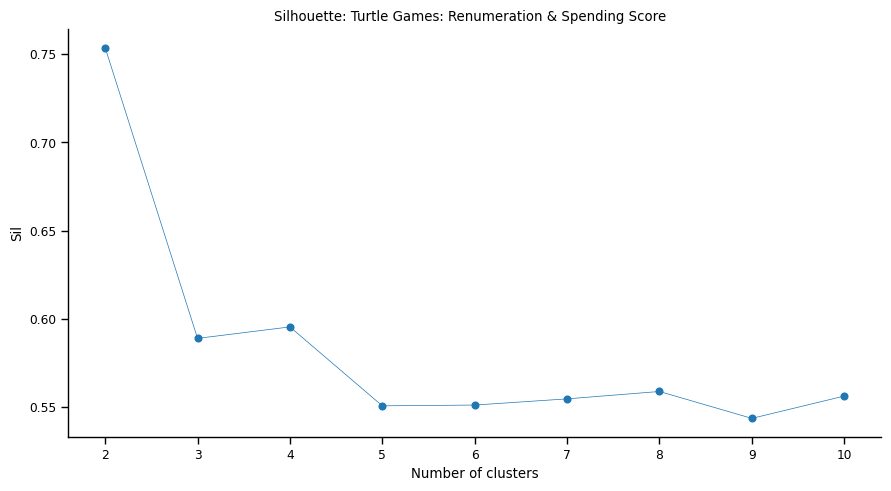

In [126]:
from sklearn.metrics import silhouette_score

sil=[]

kmax = 10

for k in range(2, kmax+1):
    kmeans_s = KMeans(n_clusters = k).fit(x)
    labels = kmeans_s.labels_
    sil.append(silhouette_score(x,
                                labels,
                                metric = 'euclidean'))

# Plot the silhouette method.
plt.plot(range(2, kmax+1),
         sil,
         marker='o')

plt.title("Silhouette: Turtle Games: Renumeration & Spending Score  ")
plt.xlabel("Number of clusters")
plt.ylabel("Sil")


for pos in ['right', 'top']: 
    plt.gca().spines[pos].set_visible(False)

plt.show()

>visualising options suggestion by the Elbow and Silouette methods

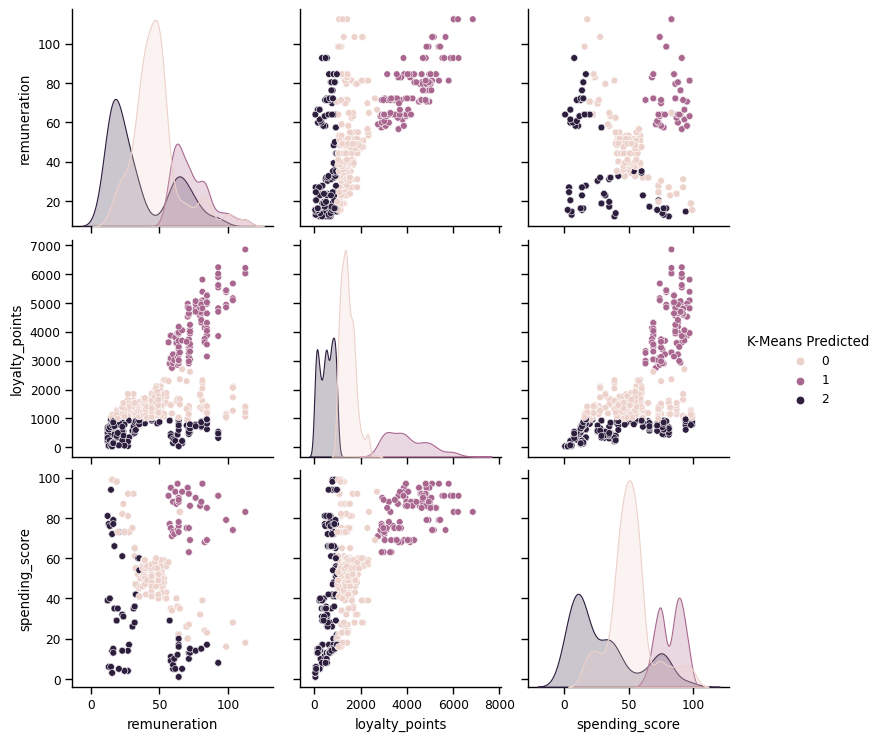

In [127]:
# Use 3 clusters:
kmeans = KMeans(n_clusters = 3,
                max_iter = 15000,
                init='k-means++',
                random_state=42).fit(x)

clusters = kmeans.labels_
x['K-Means Predicted'] = clusters

# Plot the predicted.
sns.pairplot(x,
             hue='K-Means Predicted',
             diag_kind= 'kde')

n_clusters = 3 does not seem to fit any discernable pattern in relation to spending score and remuneration. Let's try 5 next

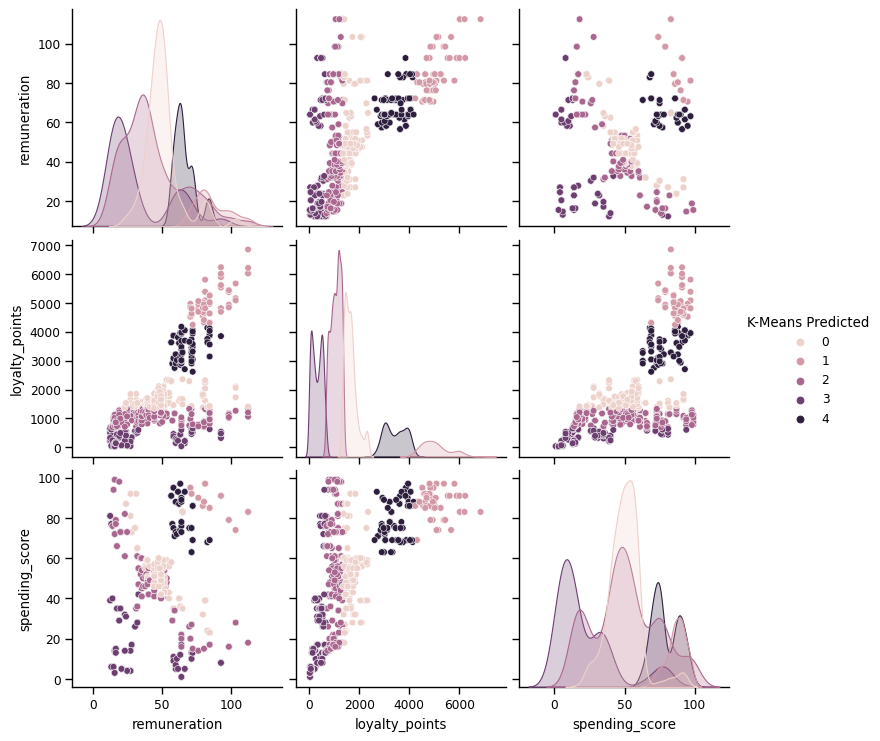

In [128]:
# Use 5 clusters:
kmeans = KMeans(n_clusters = 5,
                max_iter = 15000,
                init='k-means++',
                random_state=42).fit(x)

clusters = kmeans.labels_
x['K-Means Predicted'] = clusters

# Plot the predicted.
sns.pairplot(x,
             hue='K-Means Predicted',
             diag_kind= 'kde')

plt.savefig("k_means_plot.pdf")

With 5 we have better separation of observable patterns - lets now see the number of each predicted class

>Grouping the data according to Kmean cluster number for insights

In [129]:
# Check the number of observations per predicted class.
kmeans_clusters = pd.DataFrame(x['K-Means Predicted'].value_counts()).reset_index()
kmeans_clusters

,K-Means Predicted,count
0,2,692
1,0,530
2,3,424
3,4,230
4,1,124


In [130]:
x.columns

Index(['remuneration', 'loyalty_points', 'spending_score',
       'K-Means Predicted'],
      dtype='object')

In [131]:
x

,remuneration,loyalty_points,spending_score,K-Means Predicted
0,12.30,210,39.0,3
1,12.30,524,81.0,3
2,13.12,40,6.0,3
3,13.12,562,77.0,3
4,13.94,366,40.0,3
...,...,...,...,...
1995,84.46,4031,69.0,4
1996,92.66,539,8.0,3
1997,92.66,5614,91.0,1
1998,98.40,1048,16.0,2


In [132]:
#df2 = df1.copy(deep=True)  # This is a deep copy

x_copy = x.copy(deep=True)

In [133]:
x

,remuneration,loyalty_points,spending_score,K-Means Predicted
0,12.30,210,39.0,3
1,12.30,524,81.0,3
2,13.12,40,6.0,3
3,13.12,562,77.0,3
4,13.94,366,40.0,3
...,...,...,...,...
1995,84.46,4031,69.0,4
1996,92.66,539,8.0,3
1997,92.66,5614,91.0,1
1998,98.40,1048,16.0,2


# <a id="division_ID7.1">7.1 K-Means Predicted = Customer Segmentation by Clustering</a>

  

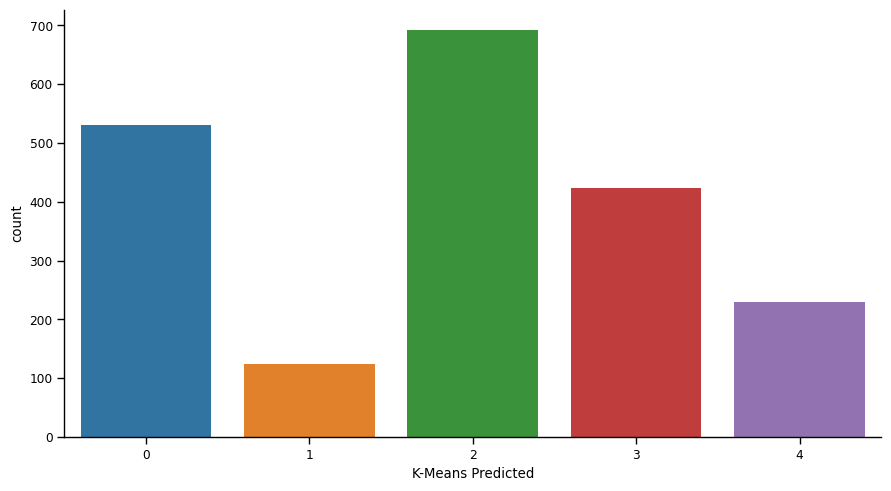

In [134]:
sns.barplot(x = 'K-Means Predicted',
            y= 'count',
            data = kmeans_clusters)
sns.despine()
# Show the plot
plt.show()

In [135]:
#subsetting of data with k-means predicted (customer segment) column added for further investigation 

x.head()

,remuneration,loyalty_points,spending_score,K-Means Predicted
0,12.30,210,39.0,3
1,12.30,524,81.0,3
2,13.12,40,6.0,3
3,13.12,562,77.0,3
4,13.94,366,40.0,3


# <a id="division_ID7.2"> 7.2 Which Segment is spending the most and how loyal are they?</a>



In [136]:
x.columns

Index(['remuneration', 'loyalty_points', 'spending_score',
       'K-Means Predicted'],
      dtype='object')

In [137]:
#subsetting dataframe to only have values relating to scores and ages as well as kmeans

reviews_subset = reviews[['age','age_bracket']]

In [138]:
#concatinating dataframes to bring together score, kmeans and age bins

#x_age_bins = pd.concat([x,reviews_subset],axis=1).reindex(x_age_bins.index)


x_age_bins = pd.concat([x,reviews_subset],axis=1)
x_age_bins.head(2)

#x_age_bins.columns
x_age_bins = x_age_bins.rename(columns={'K-Means Predicted':'k_means_predicted'})
#x_age_bins

In [139]:
#pivoting data to summarise

pivot = x_age_bins.pivot_table(index=['k_means_predicted', 'age_bracket'],
                       values=['spending_score','loyalty_points'], aggfunc='mean')


#colour added to highlight the highest spenders and the most loyal

cm = sns.light_palette("green", as_cmap=True)
pivot.style.background_gradient(cmap=cm)



In [140]:
pivot_1 = pivot.reset_index()
pivot_1

,k_means_predicted,age_bracket,loyalty_points,spending_score
0,0,under 25,1560.615385,56.000000
1,0,25-34,1577.776471,55.776471
2,0,35-43,1673.064935,47.532468
3,0,44-53,1741.903226,48.951613
4,0,over 53,1599.759740,49.948052
5,1,under 25,4691.000000,91.000000
6,1,25-34,5028.444444,86.177778
7,1,35-43,5017.508475,88.067797
8,1,44-53,5228.500000,83.500000
9,1,over 53,5049.222222,85.111111


In [141]:
pivot_1.melt()
pivot_1.describe()


,k_means_predicted,loyalty_points,spending_score
count,25.000000,25.000000,25.000000
mean,2.000000,2298.881622,57.824783
std,1.443376,1750.466070,24.397794
min,0.000000,218.612500,13.350000
25%,1.000000,1048.681319,42.802198
50%,2.000000,1599.759740,56.000000
75%,3.000000,3687.666667,80.600000
max,4.000000,5228.500000,91.000000


In [142]:
df10 = pd.crosstab(pivot_1.age_bracket, pivot_1.k_means_predicted, pivot_1.loyalty_points, aggfunc='sum', normalize=True)
#df10 = df10.reset_index()
df10.columns.name = 'K_means Segment: loyalty_points'
df10.style.background_gradient(cmap="BuGn")
df10 = df10.style.background_gradient(cmap="BuGn")
df10

K_means Segment: loyalty_points,0,1,2,3,4
age_bracket,,,,,
under 25,0.027154,0.081622,0.018441,0.005782,0.052731
25-34,0.027453,0.087494,0.018368,0.006506,0.059044
35-43,0.029111,0.087303,0.018160,0.006028,0.061534
44-53,0.030309,0.090975,0.019052,0.005718,0.065310
over 53,0.027835,0.087855,0.018247,0.003804,0.064165


In [143]:
df11 = pd.crosstab(pivot_1.age_bracket, pivot_1.k_means_predicted, pivot_1.spending_score, aggfunc='sum', normalize=True)
#df10 = df10.reset_index()
df11.columns.name = 'K_means Segment: spending_score'
df11 = df11.style.background_gradient(cmap="BuGn")
df11

K_means Segment: spending_score,0,1,2,3,4
age_bracket,,,,,
under 25,0.038738,0.062949,0.040710,0.025884,0.058502
25-34,0.038583,0.059613,0.039314,0.018677,0.054447
35-43,0.032880,0.060920,0.032251,0.011604,0.055755
44-53,0.033862,0.057761,0.026251,0.012270,0.052227
over 53,0.034551,0.058875,0.029608,0.009235,0.054533


In [144]:
pivot.corr()

,loyalty_points,spending_score
loyalty_points,1.000000,0.919335
spending_score,0.919335,1.000000


High positive correlation between spend and loyalty across population 

>Top Spending Segments 

In [145]:
Top_Spending_Segments = pivot.reset_index().nlargest(6, "spending_score")
Top_Spending_Segments

,k_means_predicted,age_bracket,loyalty_points,spending_score
5,1,under 25,4691.000000,91.000000
7,1,35-43,5017.508475,88.067797
6,1,25-34,5028.444444,86.177778
9,1,over 53,5049.222222,85.111111
20,4,under 25,3030.571429,84.571429
8,1,44-53,5228.500000,83.500000


>Segments with the highest loyalty Score

In [146]:
Highest_Loyalty = pivot.reset_index().nlargest(6, "loyalty_points")
Highest_Loyalty

,k_means_predicted,age_bracket,loyalty_points,spending_score
8,1,44-53,5228.500000,83.500000
9,1,over 53,5049.222222,85.111111
6,1,25-34,5028.444444,86.177778
7,1,35-43,5017.508475,88.067797
5,1,under 25,4691.000000,91.000000
23,4,44-53,3753.500000,75.500000


Note index items 6,7,8 and 9 belonging to kmeans group 1 appear in both groups

>Segemnts with the lowest loyalty

In [147]:
Lowest_Loyalty = pivot.reset_index().nsmallest(6, "loyalty_points")
Lowest_Loyalty 

,k_means_predicted,age_bracket,loyalty_points,spending_score
19,3,over 53,218.612500,13.350000
18,3,44-53,328.615385,17.738462
15,3,under 25,332.295918,37.418367
17,3,35-43,346.421053,16.774436
16,3,25-34,373.934783,27.000000
12,2,35-43,1043.701754,46.622807


## <a id="division_ID7.3">7.3 Loyalty Points by Age</a>

 

In [148]:
pivot_age = x_age_bins.pivot_table(index=['k_means_predicted', 'age_bracket'],
                       values=['loyalty_points'], aggfunc='mean')


pivot_age.reset_index().sort_values('loyalty_points', ascending =False)

,k_means_predicted,age_bracket,loyalty_points
8,1,44-53,5228.500000
9,1,over 53,5049.222222
6,1,25-34,5028.444444
7,1,35-43,5017.508475
5,1,under 25,4691.000000
23,4,44-53,3753.500000
24,4,over 53,3687.666667
22,4,35-43,3536.457143
21,4,25-34,3393.365517
20,4,under 25,3030.571429


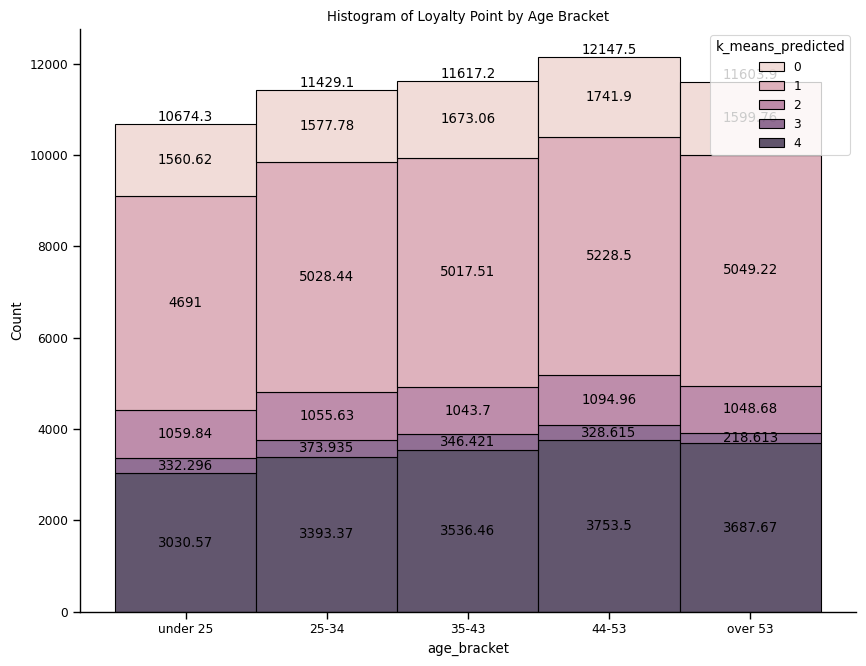

In [149]:
# plot the data in long form
fig, ax = plt.subplots(figsize=(9, 7))
sns.histplot(data=pivot_age.reset_index(), x='age_bracket', weights='loyalty_points', hue='k_means_predicted', multiple='stack', discrete=True, ax=ax).set_title("Histogram of Loyalty Point by Age Bracket")

# iterate through the axes containers to add bar labels
for c in ax.containers:
    # add the section label to the middle of each bar
    ax.bar_label(c, label_type='center')
# add the label for the total bar length by adding only the last container to the top of the bar
_ = ax.bar_label(ax.containers[-1])

sns.set_context('talk')
sns.despine()
plt.savefig("facetgrid_plot.pdf")

In [150]:
pivot_age1 = x_age_bins.pivot_table(index=['age_bracket'],
                       values=['loyalty_points'], aggfunc='mean')

pivot_age1 = pivot_age1.reset_index('age_bracket')

pivot_age1.sort_values('loyalty_points',ascending =False)



,age_bracket,loyalty_points
1,25-34,2117.174000
2,35-43,1823.194340
3,44-53,1335.775000
4,over 53,1255.444118
0,under 25,890.685714


The 25-34 age bracket is most loyal - they are rougly evently represented in all k_mean segments but it behove Turtle Game to give this age group special attention due to the cost of customer acquisition 

## <a id="division_ID7.4">7.4 Spending score by Age</a>

 

In [151]:
pivot_age = x_age_bins.pivot_table(index=['k_means_predicted', 'age_bracket'],
                       values=['spending_score'], aggfunc='mean')


pivot_age.reset_index().sort_values('spending_score', ascending =False)

,k_means_predicted,age_bracket,spending_score
5,1,under 25,91.000000
7,1,35-43,88.067797
6,1,25-34,86.177778
9,1,over 53,85.111111
20,4,under 25,84.571429
8,1,44-53,83.500000
22,4,35-43,80.600000
24,4,over 53,78.833333
21,4,25-34,78.710345
23,4,44-53,75.500000


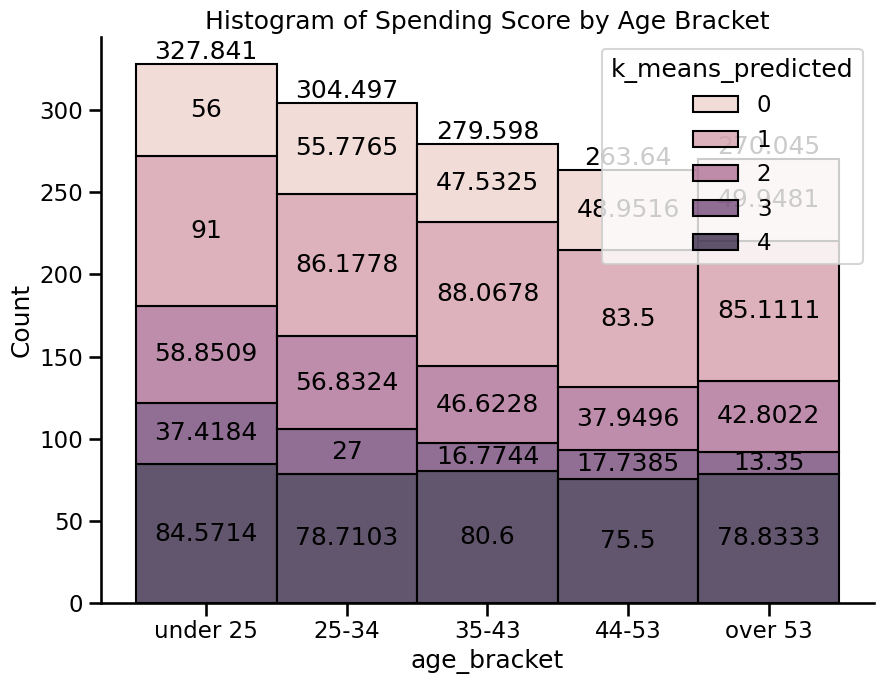

In [152]:
# plot the data in long form
fig, ax = plt.subplots(figsize=(9, 7))
sns.histplot(data=pivot_age.reset_index(), x='age_bracket', weights='spending_score', hue='k_means_predicted', multiple='stack', discrete=True, ax=ax).set_title("Histogram of Spending Score by Age Bracket")

# iterate through the axes containers to add bar labels
for c in ax.containers:
    # add the section label to the middle of each bar
    ax.bar_label(c, label_type='center')
# add the label for the total bar length by adding only the last container to the top of the bar
_ = ax.bar_label(ax.containers[-1])
sns.set_context('notebook')
sns.despine()
plt.savefig("facetgrid_plot.pdf")

In [153]:
pivot_age1 = x_age_bins.pivot_table(index=['age_bracket'],
                       values=['spending_score'], aggfunc='mean')

pivot_age1 = pivot_age1.reset_index('age_bracket')

pivot_age1.sort_values('spending_score',ascending =False)

,age_bracket,spending_score
1,25-34,62.894000
0,under 25,51.975000
2,35-43,48.498113
4,over 53,40.864706
3,44-53,39.765625


The 25-34 age bracket is most loyal and has the highest spending score at 62.7 - this represents a crucial target group for Turtle Games and likely represets the a segemnt with the highest return on marketing spend when lifetime value is calculated and cost of customer acquisitioin is taken into account 

>more brakouts by age group

In [154]:
top_spending_ages = pivot_age.reset_index().nlargest(20, "spending_score")
top_spending_ages.sort_values('spending_score', ascending=False)

,k_means_predicted,age_bracket,spending_score
5,1,under 25,91.000000
7,1,35-43,88.067797
6,1,25-34,86.177778
9,1,over 53,85.111111
20,4,under 25,84.571429
8,1,44-53,83.500000
22,4,35-43,80.600000
24,4,over 53,78.833333
21,4,25-34,78.710345
23,4,44-53,75.500000


## <a id="division_ID7.5">7.5 Calculating the weighted score to ascertain the relative importance of each k_means cluster customer segment</a>

 

In [155]:
#rename key column
x.rename(columns = {'K-Means Predicted':'k_means_predicted'},inplace=True)
x.head(3)



,remuneration,loyalty_points,spending_score,k_means_predicted
0,12.30,210,39.0,3
1,12.30,524,81.0,3
2,13.12,40,6.0,3


In [156]:
#grouping the data by cluster name/number

grouped_by_kmeans = x.groupby('k_means_predicted')[['remuneration',
                                                    'spending_score',
                                                    'loyalty_points']].mean().round(1)

grouped_by_kmeans

#sort and colour code these grouped segments 


grouped_by_kmeans = grouped_by_kmeans.sort_values(by='k_means_predicted', ascending=True)

grouped_by_kmeans

cm = sns.light_palette("green", as_cmap=True)
grouped_by_kmeans.style.background_gradient(cmap=cm)


,remuneration,spending_score,loyalty_points
k_means_predicted,,,
0,50.200000,50.100000,1649.800000
1,86.300000,86.800000,5038.200000
2,43.000000,50.600000,1057.100000
3,32.600000,22.200000,318.300000
4,66.200000,79.400000,3436.700000


In [157]:
kmeans_clusters

,K-Means Predicted,count
0,2,692
1,0,530
2,3,424
3,4,230
4,1,124


In [158]:
grouped_by_kmeans_norm = (grouped_by_kmeans-grouped_by_kmeans.min())/(grouped_by_kmeans.max()-grouped_by_kmeans.min())
grouped_by_kmeans_norm = grouped_by_kmeans_norm.reset_index()

grouped_by_kmeans_norm

#grouped_by_kmeans_norm.rename(columns={'K-Means Predicted':'k_means_predicted'})

#grouped_by_kmeans_norm = grouped_by_kmeans_norm.rename(columns={'K-Means Predicted':'k_means_predicted'})


,k_means_predicted,remuneration,spending_score,loyalty_points
0,0,0.327747,0.431889,0.282103
1,1,1.000000,1.000000,1.000000
2,2,0.193669,0.439628,0.156529
3,3,0.000000,0.000000,0.000000
4,4,0.625698,0.885449,0.660692


In [159]:
grouped_by_kmeans_norm.columns

Index(['k_means_predicted', 'remuneration', 'spending_score',
       'loyalty_points'],
      dtype='object')

In [160]:
kmeans_clusters

,K-Means Predicted,count
0,2,692
1,0,530
2,3,424
3,4,230
4,1,124


In [161]:

kmeans_clusters.rename(columns = {'K-Means Predicted':'k_means_predicted' },inplace = True)


In [162]:
# Merge Dataframe
kmeans_norm_merged = pd.merge(grouped_by_kmeans_norm, kmeans_clusters, on='k_means_predicted')

import pandas as pd
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler

kmeans_norm_merged

u = kmeans_norm_merged[['k_means_predicted','count']]

#save dataframe in new variable 

x = u

min_max_scaler = preprocessing.MinMaxScaler() # Create variable for min max scaler function
x_scaled = min_max_scaler.fit_transform(x) # transfrom the data to fit the function
df = pd.DataFrame(x_scaled) # save the data into a dataframe
df

kmeans_norm_merged = pd.concat([kmeans_norm_merged, df],axis='columns')


In [163]:
def rename_col_by_index(kmeans_norm_merged, index_mapping):
    kmeans_norm_merged.columns = [index_mapping.get(i, col) for i, col in enumerate(kmeans_norm_merged.columns)]
    return kmeans_norm_merged
 
# Renaming columns using the function
#new_column_mapping = {5: 'ss', 6: 'count_norm', 7: 'xx',8:'xxx',9:'xxxx',10:'cc',11:'bb'}
new_column_mapping = {5: 'ss', 6: 'count_norm'}
kmeans_norm_merged = rename_col_by_index(kmeans_norm_merged, new_column_mapping)
kmeans_norm_merged

,k_means_predicted,remuneration,spending_score,loyalty_points,count,ss,count_norm
0,0,0.327747,0.431889,0.282103,530,0.00,0.714789
1,1,1.000000,1.000000,1.000000,124,0.25,0.000000
2,2,0.193669,0.439628,0.156529,692,0.50,1.000000
3,3,0.000000,0.000000,0.000000,424,0.75,0.528169
4,4,0.625698,0.885449,0.660692,230,1.00,0.186620


In [164]:
attributes = ["remuneration", "spending_score", "loyalty_points", "count_norm"]
weights = [0.1, 0.2, 0.3, 0.4]
kmeans_norm_merged['weighted_Score'] = kmeans_norm_merged[attributes].mul(weights).sum(1)

#rounding the score numbers for easier reading 
kmeans_norm_merged.weighted_Score = kmeans_norm_merged.weighted_Score.round(2)
kmeans_norm_merged


,k_means_predicted,remuneration,spending_score,loyalty_points,count,ss,count_norm,weighted_Score
0,0,0.327747,0.431889,0.282103,530,0.00,0.714789,0.49
1,1,1.000000,1.000000,1.000000,124,0.25,0.000000,0.60
2,2,0.193669,0.439628,0.156529,692,0.50,1.000000,0.55
3,3,0.000000,0.000000,0.000000,424,0.75,0.528169,0.21
4,4,0.625698,0.885449,0.660692,230,1.00,0.186620,0.51


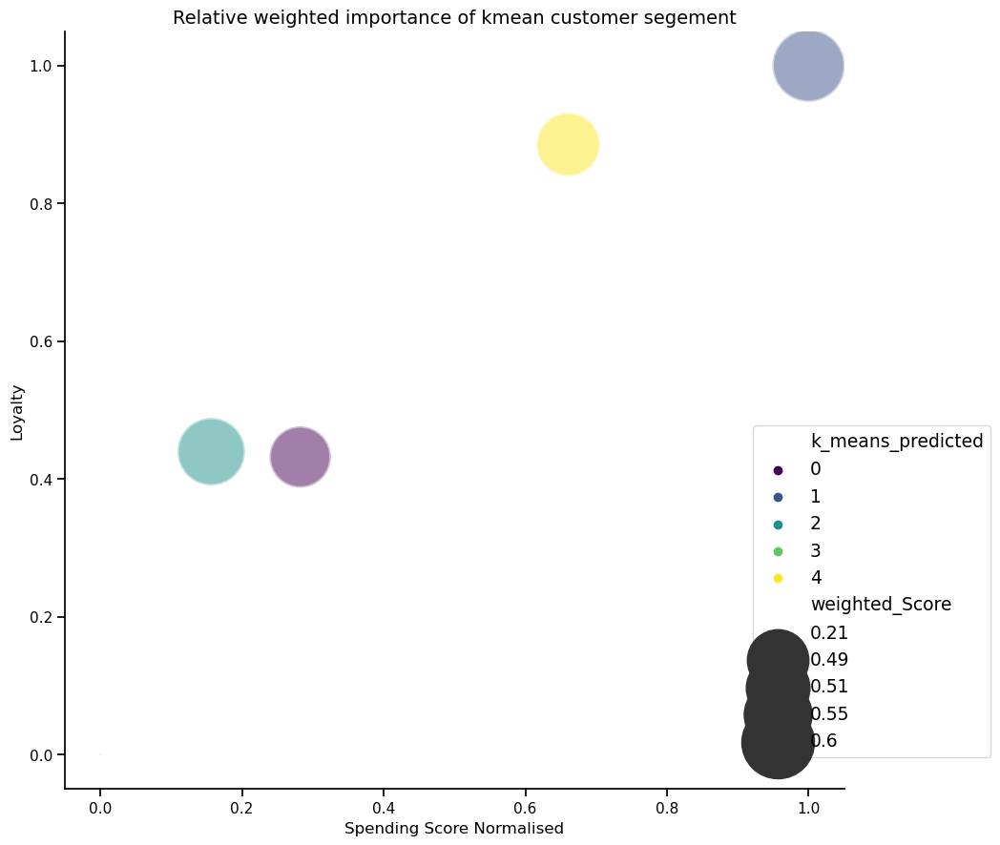

In [165]:
plt.rcParams['figure.figsize'] = [13, 11]
sns.scatterplot(data=kmeans_norm_merged, x="loyalty_points", 
                y="spending_score", 
                size="weighted_Score",
                hue="k_means_predicted",
                palette="viridis",
                edgecolors="grey",
                legend=True, 
                alpha=0.5, sizes=(1, 3000))

# Add titles (main and on axis)
plt.title("Relative weighted importance of kmean customer segement",fontsize=14)
plt.xlabel("Spending Score Normalised")
plt.ylabel("Loyalty")
plt.legend(bbox_to_anchor=(1.2,0.03), loc='lower right', fontsize=13.5)


# show the graph
sns.despine()
plt.tight_layout(pad=7.0)
sns.set_context('paper')
plt.savefig("facetgrid_plot.pdf")
plt.show()

# <a id="division_ID7.6">7.6 Calculating the weighted score to ascertain the relative importance of each age bracket</a>

 

In [166]:
df = x_age_bins.groupby('age_bracket')[['remuneration','spending_score','loyalty_points']].sum()



In [167]:
x = pd.DataFrame(x_age_bins['age_bracket'].value_counts())
x

,count
age_bracket,
35-43,530
25-34,500
over 53,340
44-53,320
under 25,280


In [168]:
# Merge Dataframe
df_merged = pd.merge(df,x, on='age_bracket')
df_merged

#normalizing dataframe: 


df_merged
# copy the data 
df_merged_max_scaled1 = df_merged.copy() 
  
# apply normalization techniques 
for column in df_merged_max_scaled1.columns: 
    df_merged_max_scaled1[column] = df_merged_max_scaled1[column]  / df_merged_max_scaled1[column].abs().max() 
      
df_merged_max_scaled1

#calculating weighted score

attributes = ["remuneration", "spending_score", "loyalty_points", "count"]
weights = [0.1, 0.2, 0.3, 0.4]
df_merged_max_scaled1['weighted_Score'] = df_merged_max_scaled1[attributes].mul(weights).sum(1)

#rounding the score numbers for easier reading 
df_merged_max_scaled1.weighted_Score = df_merged_max_scaled1.weighted_Score.round(2)
df_merged_max_scaled1.reset_index()

,age_bracket,remuneration,spending_score,loyalty_points,count,weighted_Score
0,under 25,0.372063,0.462779,0.235590,0.528302,0.41
1,25-34,0.918639,1.000000,1.000000,0.943396,0.97
2,35-43,1.000000,0.817375,0.912814,1.000000,0.94
3,44-53,0.520362,0.404649,0.403791,0.603774,0.50
4,over 53,0.532761,0.441823,0.403227,0.641509,0.52


Normalized data shows what proportions each age segement is responsible for data on renum., spending and loyalty

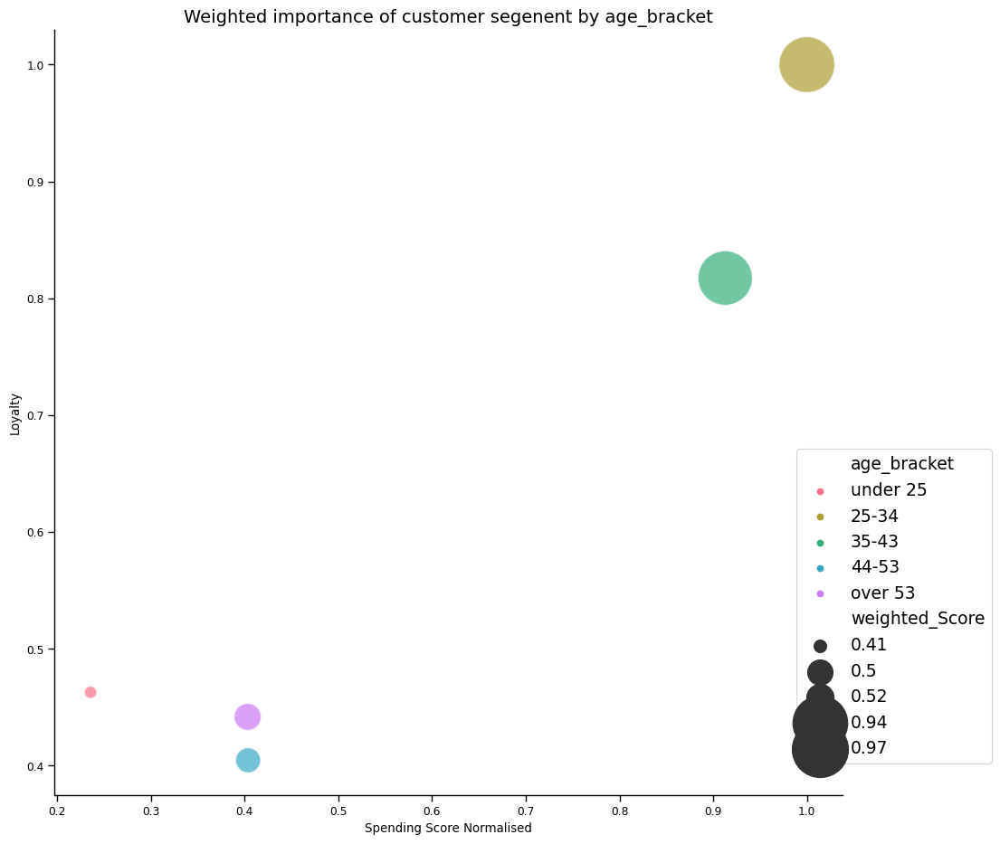

In [169]:
plt.rcParams['figure.figsize'] = [13, 11]
sns.scatterplot(data=df_merged_max_scaled1.reset_index(), x="loyalty_points", 
                y="spending_score", 
                size="weighted_Score",
                hue="age_bracket",
                palette="husl",
                edgecolors="grey",
                legend=True, 
                alpha=0.7, sizes=(100, 2000))

#Add titles (main and on axis)
plt.title("Weighted importance of customer segenent by age_bracket",fontsize=14)
plt.xlabel("Spending Score Normalised")
plt.ylabel("Loyalty")
plt.legend(bbox_to_anchor=(1.2,0.03), loc='lower right', fontsize=13.5)


#show the graph
sns.despine()
plt.tight_layout(pad=7.0)
sns.set_context('paper')
plt.savefig("facetgrid_plot.pdf")
plt.show()

>initial normalisation of customer segment data

In [170]:
descr_stats_km = grouped_by_kmeans_norm
descr_stats_km

,k_means_predicted,remuneration,spending_score,loyalty_points
0,0,0.327747,0.431889,0.282103
1,1,1.000000,1.000000,1.000000
2,2,0.193669,0.439628,0.156529
3,3,0.000000,0.000000,0.000000
4,4,0.625698,0.885449,0.660692


In [171]:
descr_stats_km.describe()

,k_means_predicted,remuneration,spending_score,loyalty_points
count,5.000000,5.000000,5.000000,5.000000
mean,2.000000,0.429423,0.551393,0.419865
std,1.581139,0.391920,0.401139,0.405945
min,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.193669,0.431889,0.156529
50%,2.000000,0.327747,0.439628,0.282103
75%,3.000000,0.625698,0.885449,0.660692
max,4.000000,1.000000,1.000000,1.000000


A standard deviation of 40 percent shows there is a lot of variation which supports the idea these grouping makes sense in revealing signal about customer behaviour 

# <a id="division_ID8.0">8.0 Boxplots for Loyalty, Spending and Renumeration by K-Means Segment</a>

 

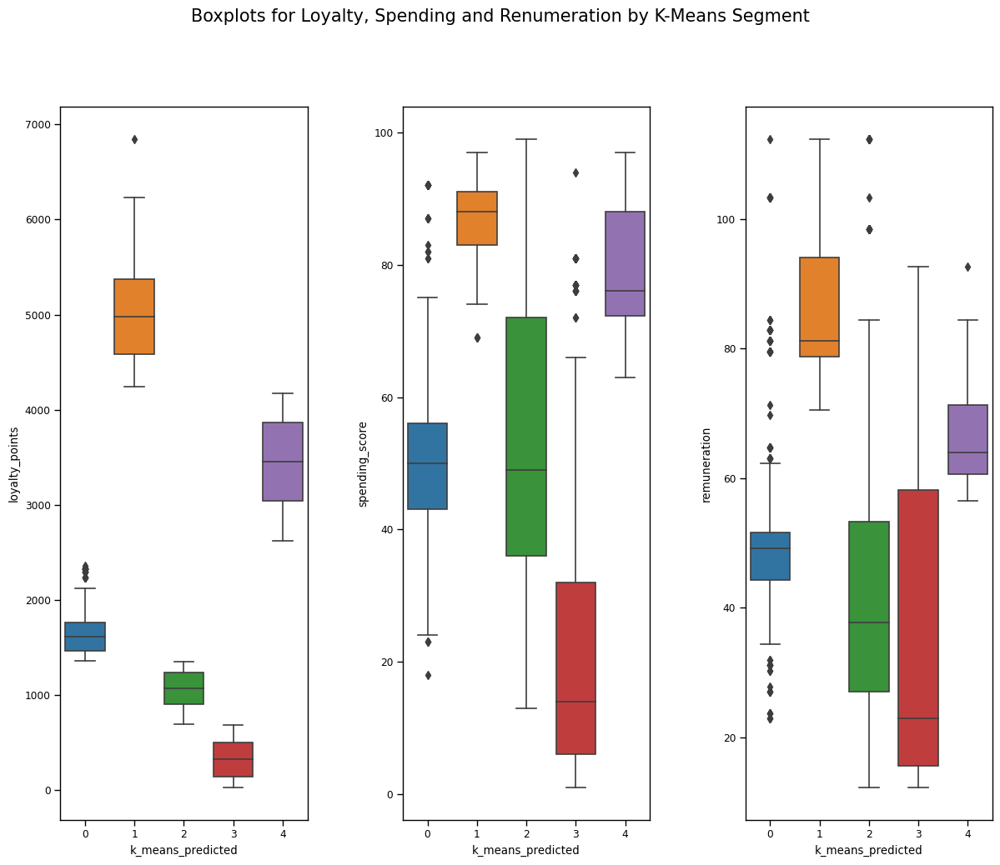

In [172]:
fig, axes = plt.subplots(1, 3)
sns.boxplot( data=x_age_bins, x='k_means_predicted', y='loyalty_points',  orient='v', ax=axes[0])
sns.boxplot(data=x_age_bins, x='k_means_predicted', y='spending_score', orient='v', ax=axes[1])
sns.boxplot(data=x_age_bins, x='k_means_predicted', y='remuneration', orient='v', ax=axes[2])

plt.suptitle('Boxplots for Loyalty, Spending and Renumeration by K-Means Segment',fontsize=15)
plt.tight_layout(pad=4.5)
plt.show()

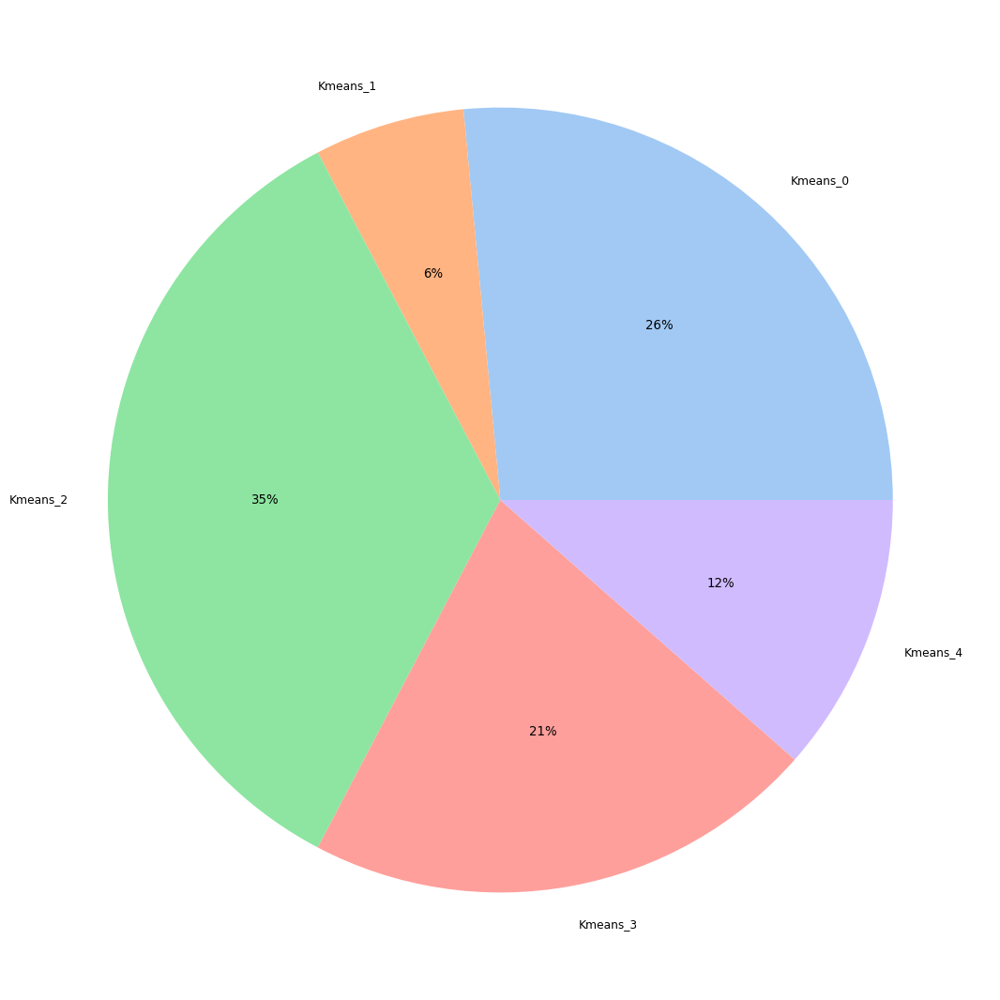

In [173]:
kmeans_clusters.sort_values('k_means_predicted',ascending=True)

#define data
data = [530, 124, 692, 424, 230]
labels = ['Kmeans_0', 'Kmeans_1', 'Kmeans_2','Kmeans_3','Kmeans_4']

#define Seaborn color palette to use
colors = sns.color_palette('pastel')[0:5]

#create pie chart
plt.pie(data, labels = labels, colors = colors, autopct='%.0f%%')
sns.set_context('talk')
plt.savefig("k_pie.pdf")
plt.show()


In terms of loyality we see some clear differentiation: group 3 are the least loyal of the customer segments, with its IQR spending score well below all other segements. The business must take a view on how to address this group differently based on lifetime value and whether the cost of acquisition makes it commerically viable to deploy resources on retaining this segment that generates the least on a per customer basis and likely churns the fastest.

That said it is the 3 largest group and likely represent a significant amount of revenue, so further information is needed. 



Group 2 are a more hetrogenious segment in terms of spend with the spending score IQR exceeding 70, and the IQR of renumeration being higher than group 3. However in loyalty they resemble group 3 and should be approached with similar caution although some do spend more in this group. At 35% of the customer base, it is the largest cohort of customers. 

Group 0 are also disntictive in their loyalty score with a tight distribution and higher spenders relative to groups 3 and 2.

Group 1 and 4 are the highest spenders and have a similarly high loyalty profile - these represent very likely the sweetspot for Turtle games and likely generate the most income on a per customer basis. However these segment represent a combined 18 percent of the total customerbase. 

In [174]:
#counting the number per group
kmeans_clusters = kmeans_clusters.sort_values(by='k_means_predicted', ascending=True)
kmeans_clusters.reset_index()

,index,k_means_predicted,count
0,1,0,530
1,4,1,124
2,0,2,692
3,2,3,424
4,3,4,230


With Kmeans predicted group 3 with the lowest loyality points - we need to investigate the cost of acquisition of customers who are low income and low spending. The question for the business would be does the lifetime value of this segment justify the cost of aquisition since this may well be the least profitable group. Conversely it may also mean the company should invest more on this segment to improve the loyality score. 

In [175]:
kmeans_clusters.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5 entries, 1 to 3
Data columns (total 2 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   k_means_predicted  5 non-null      int32
 1   count              5 non-null      int64
dtypes: int32(1), int64(1)
memory usage: 100.0 bytes


In [176]:
kmeans_clusters1 = kmeans_clusters.apply(pd.to_numeric, errors='ignore')
kmeans_clusters1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5 entries, 1 to 3
Data columns (total 2 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   k_means_predicted  5 non-null      int32
 1   count              5 non-null      int64
dtypes: int32(1), int64(1)
memory usage: 100.0 bytes


In [177]:
#weighting by age bracket multiple proportions of customer population 

#df = pd.DataFrame(x_age_bins['K-Means Predicted'].value_counts()).reset_index().sort_values('K-Means Predicted')
#df

In [178]:
x_age_bins.columns

Index(['remuneration', 'loyalty_points', 'spending_score', 'k_means_predicted',
       'age', 'age_bracket'],
      dtype='object')

In [179]:
reviews_norm1 = reviews[['remuneration','spending_score','loyalty_points','age']]

# copy the data 
reviews_stats_max_scaled1 = reviews_norm1.copy() 
  
# apply normalization techniques 
for column in reviews_stats_max_scaled1.columns: 
    reviews_stats_max_scaled1[column] = reviews_stats_max_scaled1[column]  / reviews_stats_max_scaled1[column].abs().max() 
      
reviews_stats_max_scaled1

reviews_stats_max_scaled1.corr()

,remuneration,spending_score,loyalty_points,age
remuneration,1.000000,0.005612,0.616065,-0.005708
spending_score,0.005612,1.000000,0.672310,-0.224334
loyalty_points,0.616065,0.672310,1.000000,-0.042445
age,-0.005708,-0.224334,-0.042445,1.000000


***Plot the clusters and interpret the model. Make sure to document your  observations and interpretations of the output that will serve as input to your business and technical feedback at the end of the course. Make sure to:
describe the groups identified
comment on the relative sizes of the groups
suggest specific actions per group or suggest groups that should be targeted***

# <a id="division_ID9.0">9.0 Assessing Comment and Reviews of Turtle Games: Sentiment Analysis</a>

 

### Analysing customer sentiments within Reviews and Comment

>Naive Bayes classifier

In [180]:
reviews.shape

(2000, 13)

In [181]:
x_copy.shape

(2000, 4)

In [182]:
x_copy.columns

Index(['remuneration', 'loyalty_points', 'spending_score',
       'K-Means Predicted'],
      dtype='object')

In [183]:
#merging to create a new base dataframe with clustering information 

reviews_clusters1 = pd.concat([reviews, x_copy], axis=1)

reviews_clusters1["Id"] = reviews_clusters1.index

reviews_clusters1.head(1)

,gender,age,remuneration,spending_score,loyalty_points,education,language,platform,product,review,summary,age_bin,age_bracket,remuneration,loyalty_points,spending_score,K-Means Predicted,Id
0,Male,18,12.3,39.0,210,graduate,EN,Web,0,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...,0,under 25,12.3,210,39.0,3,0


In [184]:
# shift column 'Name' to first position 
first_column = reviews_clusters1.pop('Id') 
  
# insert column using insert(position,column_name, 
# first_column) function 
reviews_clusters1.insert(0, 'Id', first_column)
reviews_clusters1.head(1)

,Id,gender,age,remuneration,spending_score,loyalty_points,education,language,platform,product,review,summary,age_bin,age_bracket,remuneration,loyalty_points,spending_score,K-Means Predicted
0,0,Male,18,12.3,39.0,210,graduate,EN,Web,0,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...,0,under 25,12.3,210,39.0,3


In [185]:
reviews_clusters1.columns

Index(['Id', 'gender', 'age', 'remuneration', 'spending_score',
       'loyalty_points', 'education', 'language', 'platform', 'product',
       'review', 'summary', 'age_bin', 'age_bracket', 'remuneration',
       'loyalty_points', 'spending_score', 'K-Means Predicted'],
      dtype='object')

In [186]:
reviews_clusters1.shape

(2000, 18)

In [187]:

# Install NLTK.
!pip install nltk

# Import the necessary library.
import nltk
# Install the required tokenisation model.
nltk.download('punkt')

# Install the required tokenisation function.
from nltk.tokenize import sent_tokenize
import random

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/levonmcgregor/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [188]:
reviews_clusters1['review_&_comment merged'] = reviews_clusters1['review'] + reviews_clusters1['summary']
all_text = reviews_clusters1['review_&_comment merged']
print(reviews_clusters1['review_&_comment merged'].isna().sum())
print(reviews_clusters1['review_&_comment merged'].shape)


0
(2000,)


### Change all words in the commemts to lowercase

In [189]:
# Transform data to lowercase.
reviews_clusters1['review_&_comment merged'] = reviews_clusters1['review_&_comment merged'].apply(lambda x: " ".join(x.lower() for x in x.split()))



In [190]:
reviews_clusters1.columns

Index(['Id', 'gender', 'age', 'remuneration', 'spending_score',
       'loyalty_points', 'education', 'language', 'platform', 'product',
       'review', 'summary', 'age_bin', 'age_bracket', 'remuneration',
       'loyalty_points', 'spending_score', 'K-Means Predicted',
       'review_&_comment merged'],
      dtype='object')

### Remove punctuation 

In [191]:
# remove punctuation
reviews_clusters1['review_&_comment merged'] = reviews_clusters1['review_&_comment merged'].str.replace('[^\w\s]','')

# Preview the result.
reviews_clusters1['review_&_comment merged'].head(3)

0    when it comes to a dm's screen, the space on t...
1    an open letter to galeforce9*: your unpainted ...
2    nice art, nice printing. why two panels are fi...
Name: review_&_comment merged, dtype: object

In [192]:
example = reviews_clusters1['review_&_comment merged'][0]
print(example)

when it comes to a dm's screen, the space on the screen itself is at an absolute premium. the fact that 50% of this space is wasted on art (and not terribly informative or needed art as well) makes it completely useless. the only reason that i gave it 2 stars and not 1 was that, technically speaking, it can at least still stand up to block your notes and dice rolls. other than that, it drops the ball completely.the fact that 50% of this space is wasted on art (and not terribly informative or needed art ...


In [193]:
tokens = nltk.word_tokenize(example)


In [194]:
# Download the stopwords.
nltk.download('stopwords')

# Import the package.
from nltk.corpus import stopwords

# Create a set of English stopwords.
stop_words = set(stopwords.words('english'))

# Display the set.
print(stop_words)

{'as', "shouldn't", "weren't", 'most', 'more', 'too', 'hers', 'itself', 'wouldn', "you'll", 'against', 'he', "you're", 'such', 'had', 'then', 'aren', 'ourselves', 'i', 'no', 'theirs', 'shan', 'above', 'why', 'through', 'being', "that'll", 'between', 'nor', 'hadn', 'myself', "couldn't", 'been', 'down', 'mightn', 'themselves', 'those', 'by', 'won', "aren't", 'few', 'was', 'were', 'they', 'and', "isn't", 'she', 'what', "you've", 'having', 'do', "mustn't", "didn't", 'o', "haven't", 'into', 're', 'same', 'hasn', 'haven', 'whom', 'how', 'other', 'them', 'has', 'am', 'can', 'yourselves', 'should', 'yours', 'with', 'ma', 'you', 'below', 'just', 'didn', 'weren', "needn't", 'to', 'my', 'have', 'our', 'out', 'did', 'their', 'there', 'd', "don't", "wouldn't", 'the', "it's", 'doesn', 'from', 'me', 'at', 'is', 'needn', 'your', 'both', 'each', "wasn't", 'will', 'when', 'or', 'that', 'up', 'some', "won't", 'after', 've', "shan't", 'now', "hadn't", "you'd", 'his', 'which', 'than', 'ain', 'who', 'over',

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/levonmcgregor/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [195]:
tagged = nltk.pos_tag(tokens)
tagged[:10]

[('when', 'WRB'),
 ('it', 'PRP'),
 ('comes', 'VBZ'),
 ('to', 'TO'),
 ('a', 'DT'),
 ('dm', 'NN'),
 ("'s", 'POS'),
 ('screen', 'NN'),
 (',', ','),
 ('the', 'DT')]

In [196]:
# Import the necessary class.
from nltk.stem.wordnet import WordNetLemmatizer

# Download the lemma corpus.
nltk.download('omw-1.4')

# Create an instance of the class.
lemmatiser = WordNetLemmatizer()

# Create an empty output list.
lemmatised_words_list = []


# Apply lemmatisation to each tokenised word.
for each_word in tokens:
    lem_word = lemmatiser.lemmatize(each_word)
    lemmatised_words_list.append(lem_word)

# Display the output list.
print("Lemmatised Words list {}".format(lemmatised_words_list))

[nltk_data] Downloading package omw-1.4 to
[nltk_data]     /Users/levonmcgregor/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


Lemmatised Words list ['when', 'it', 'come', 'to', 'a', 'dm', "'s", 'screen', ',', 'the', 'space', 'on', 'the', 'screen', 'itself', 'is', 'at', 'an', 'absolute', 'premium', '.', 'the', 'fact', 'that', '50', '%', 'of', 'this', 'space', 'is', 'wasted', 'on', 'art', '(', 'and', 'not', 'terribly', 'informative', 'or', 'needed', 'art', 'a', 'well', ')', 'make', 'it', 'completely', 'useless', '.', 'the', 'only', 'reason', 'that', 'i', 'gave', 'it', '2', 'star', 'and', 'not', '1', 'wa', 'that', ',', 'technically', 'speaking', ',', 'it', 'can', 'at', 'least', 'still', 'stand', 'up', 'to', 'block', 'your', 'note', 'and', 'dice', 'roll', '.', 'other', 'than', 'that', ',', 'it', 'drop', 'the', 'ball', 'completely.the', 'fact', 'that', '50', '%', 'of', 'this', 'space', 'is', 'wasted', 'on', 'art', '(', 'and', 'not', 'terribly', 'informative', 'or', 'needed', 'art', '...']


In [197]:
tagged = nltk.pos_tag(tokens)
tagged[:10]

[('when', 'WRB'),
 ('it', 'PRP'),
 ('comes', 'VBZ'),
 ('to', 'TO'),
 ('a', 'DT'),
 ('dm', 'NN'),
 ("'s", 'POS'),
 ('screen', 'NN'),
 (',', ','),
 ('the', 'DT')]

In [198]:
entities = nltk.chunk.ne_chunk(tagged)
entities.pprint()

(S
  when/WRB
  it/PRP
  comes/VBZ
  to/TO
  a/DT
  dm/NN
  's/POS
  screen/NN
  ,/,
  the/DT
  space/NN
  on/IN
  the/DT
  screen/NN
  itself/PRP
  is/VBZ
  at/IN
  an/DT
  absolute/JJ
  premium/NN
  ./.
  the/DT
  fact/NN
  that/IN
  50/CD
  %/NN
  of/IN
  this/DT
  space/NN
  is/VBZ
  wasted/VBN
  on/IN
  art/NN
  (/(
  and/CC
  not/RB
  terribly/RB
  informative/JJ
  or/CC
  needed/VBN
  art/NN
  as/IN
  well/RB
  )/)
  makes/VBZ
  it/PRP
  completely/RB
  useless/JJ
  ./.
  the/DT
  only/JJ
  reason/NN
  that/IN
  i/NN
  gave/VBD
  it/PRP
  2/CD
  stars/NNS
  and/CC
  not/RB
  1/CD
  was/VBD
  that/IN
  ,/,
  technically/RB
  speaking/VBG
  ,/,
  it/PRP
  can/MD
  at/IN
  least/JJS
  still/RB
  stand/VB
  up/RP
  to/TO
  block/VB
  your/PRP$
  notes/NNS
  and/CC
  dice/NN
  rolls/NNS
  ./.
  other/JJ
  than/IN
  that/DT
  ,/,
  it/PRP
  drops/VBZ
  the/DT
  ball/NN
  completely.the/NN
  fact/NN
  that/IN
  50/CD
  %/NN
  of/IN
  this/DT
  space/NN
  is/VBZ
  wasted/VBN
  on/IN
  a

### <a id="division_ID9.1">9.1 Sentiment Intensity Analyser and Polarity Scores    </a>

 

In [199]:
from nltk.sentiment import SentimentIntensityAnalyzer
from tqdm.notebook import tqdm

sia = SentimentIntensityAnalyzer()

In [200]:
# Run the polarity score on the entire dataset  reviews_clusters['review_&_comment merged']
res = {}
for i, row in tqdm(reviews_clusters1.iterrows(), total=len(reviews_clusters1)):
    text = row['review_&_comment merged']
    myid = row['Id']
    res[myid] = sia.polarity_scores(text)

  0%|          | 0/2000 [00:00<?, ?it/s]

In [201]:
p_score = pd.DataFrame(res).T

In [202]:
p_score = p_score.reset_index().rename(columns={'index': 'Id','neg': 'polarity_neg','neu': 'polarity_neu','pos': 'polarity_pos'})
p_score.head()

,Id,polarity_neg,polarity_neu,polarity_pos,compound
0,0,0.117,0.828,0.055,-0.7611
1,1,0.106,0.699,0.195,0.9203
2,2,0.130,0.706,0.164,0.7455
3,3,0.000,0.622,0.378,0.8065
4,4,0.264,0.736,0.000,-0.7845


In [203]:
#positive example comment 

reviews_clusters1['review_&_comment merged'][7]

'came in perfect condition.five stars'

In [204]:
#neutral example comment 

reviews_clusters1['review_&_comment merged'][10]

'works very wellfive stars'

In [205]:
#negative example comment 

reviews_clusters1['review_&_comment merged'][4]

"as my review of gf9's previous screens these were completely unnecessary and nearly useless. skip them, this is the definition of a waste of money.money trap"

>merging of review clusters and p_score dataframe carrying sentiment score to be normalised

In [206]:
reviews_clusters1.columns

Index(['Id', 'gender', 'age', 'remuneration', 'spending_score',
       'loyalty_points', 'education', 'language', 'platform', 'product',
       'review', 'summary', 'age_bin', 'age_bracket', 'remuneration',
       'loyalty_points', 'spending_score', 'K-Means Predicted',
       'review_&_comment merged'],
      dtype='object')

In [207]:
#reviews_clusters = reviews_clusters.rename(columns={'index': 'Id'})
#reviews_clusters.columns

In [208]:
reviews_clusters1.shape

(2000, 19)

In [209]:
#concatenated = pandas.concat([df1, df2], axis="columns")

p_score = pd.concat([p_score, reviews_clusters1],axis="columns")

In [210]:
p_score.columns

Index(['Id', 'polarity_neg', 'polarity_neu', 'polarity_pos', 'compound', 'Id',
       'gender', 'age', 'remuneration', 'spending_score', 'loyalty_points',
       'education', 'language', 'platform', 'product', 'review', 'summary',
       'age_bin', 'age_bracket', 'remuneration', 'loyalty_points',
       'spending_score', 'K-Means Predicted', 'review_&_comment merged'],
      dtype='object')

In [211]:
#now we have sentiment score, cluster data and metadata in the same dataframe 
p_score.head(5)

,Id,polarity_neg,polarity_neu,polarity_pos,compound,Id,gender,age,remuneration,spending_score,...,product,review,summary,age_bin,age_bracket,remuneration,loyalty_points,spending_score,K-Means Predicted,review_&_comment merged
0,0,0.117,0.828,0.055,-0.7611,0,Male,18,12.30,39.0,...,0,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...,0,under 25,12.30,210,39.0,3,"when it comes to a dm's screen, the space on t..."
1,1,0.106,0.699,0.195,0.9203,1,Male,23,12.30,81.0,...,0,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...,0,under 25,12.30,524,81.0,3,an open letter to galeforce9*: your unpainted ...
2,2,0.130,0.706,0.164,0.7455,2,Female,22,13.12,6.0,...,0,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless",0,under 25,13.12,40,6.0,3,"nice art, nice printing. why two panels are fi..."
3,3,0.000,0.622,0.378,0.8065,3,Female,25,13.12,77.0,...,0,Amazing buy! Bought it as a gift for our new d...,Five Stars,0,under 25,13.12,562,77.0,3,amazing buy! bought it as a gift for our new d...
4,4,0.264,0.736,0.000,-0.7845,4,Female,33,13.94,40.0,...,0,As my review of GF9's previous screens these w...,Money trap,1,25-34,13.94,366,40.0,3,as my review of gf9's previous screens these w...


In [212]:

p_score.drop(['review','summary','language','platform'],axis=1,inplace=True)

 

In [213]:
p_score.head(1)
p_score.columns

Index(['Id', 'polarity_neg', 'polarity_neu', 'polarity_pos', 'compound', 'Id',
       'gender', 'age', 'remuneration', 'spending_score', 'loyalty_points',
       'education', 'product', 'age_bin', 'age_bracket', 'remuneration',
       'loyalty_points', 'spending_score', 'K-Means Predicted',
       'review_&_comment merged'],
      dtype='object')

In [214]:
p_score.shape

(2000, 20)

### Dropping duplicate comments

In [215]:
# Drop duplicates.
reviews_clusters1 = reviews_clusters1.drop_duplicates(subset=['review_&_comment merged'])



In [216]:
# Preview data.
#reviews_clusters1.reset_index(inplace=True)
reviews_clusters1.shape

(1975, 19)

### Mapping Descriptors

In [217]:
#mapping kmean disriptors to the group numbers for visualisations

mappings = {1:"1: High Remun. - High Spend", 2:"2: Variable Remun. - Variable Spend",
       3:"3: Low Remun. - Low Spend",4:"4: 2nd Highest Remun. - High Spend",0:"0: Mid Remun. - Mid Spend"}
    
p_score['K-Means_segments'] = p_score['K-Means Predicted'].map(mappings)



In [218]:
#creating an overarching summary of the p_score dataset

p_score_summary = p_score.groupby('K-Means_segments')[['remuneration', 'spending_score', 'loyalty_points','age','compound']].mean()
p_score_summary
p_score_summary.T
p_score_summary.T.drop_duplicates()
p_score_summary.T.drop_duplicates().T
p_score_summary = p_score_summary.T.drop_duplicates().T
p_score_summary

,remuneration,spending_score,loyalty_points,age,compound
K-Means_segments,,,,,
0: Mid Remun. - Mid Spend,50.239698,50.096226,1649.830189,45.505660,0.660110
1: High Remun. - High Spend,86.338065,86.822581,5038.161290,37.806452,0.607160
2: Variable Remun. - Variable Spend,43.036965,50.588150,1057.106936,36.920520,0.652228
3: Low Remun. - Low Spend,32.571792,22.181604,318.318396,39.358491,0.627549
4: 2nd Highest Remun. - High Spend,66.231043,79.439130,3436.682609,34.552174,0.630718


In [219]:
#colum renamed for business presentation 

p_score_summary = p_score_summary.rename(columns={'compound': 'Sentiment Score[compound]'})
p_score_summary

,remuneration,spending_score,loyalty_points,age,Sentiment Score[compound]
K-Means_segments,,,,,
0: Mid Remun. - Mid Spend,50.239698,50.096226,1649.830189,45.505660,0.660110
1: High Remun. - High Spend,86.338065,86.822581,5038.161290,37.806452,0.607160
2: Variable Remun. - Variable Spend,43.036965,50.588150,1057.106936,36.920520,0.652228
3: Low Remun. - Low Spend,32.571792,22.181604,318.318396,39.358491,0.627549
4: 2nd Highest Remun. - High Spend,66.231043,79.439130,3436.682609,34.552174,0.630718


In [220]:
p_score.columns

Index(['Id', 'polarity_neg', 'polarity_neu', 'polarity_pos', 'compound', 'Id',
       'gender', 'age', 'remuneration', 'spending_score', 'loyalty_points',
       'education', 'product', 'age_bin', 'age_bracket', 'remuneration',
       'loyalty_points', 'spending_score', 'K-Means Predicted',
       'review_&_comment merged', 'K-Means_segments'],
      dtype='object')

# <a id="division_ID9.2">9.2 Extract polarity and subjectivity from Turtle Games comments and reviews</a>



In [221]:
!pip install TextBlob

In [222]:
from textblob import TextBlob

In [223]:
# Define a function to extract a polarity score for the comment.
def generate_polarity(comment):
    return TextBlob(comment).sentiment[0]

In [224]:
#Populate a new column with polarity scores for each comment.
#p_score['polarity'] = p_score['review_&_comment merged'].apply(generate_polarity)

p_score['review_&_comment merged'].info()


<class 'pandas.core.series.Series'>
RangeIndex: 2000 entries, 0 to 1999
Series name: review_&_comment merged
Non-Null Count  Dtype 
--------------  ----- 
2000 non-null   object
dtypes: object(1)
memory usage: 15.8+ KB


In [225]:
p_score['review_&_comment merged']= p_score['review_&_comment merged'].astype("string")
print("Type of column review_&_comment merged after converting: ", p_score['review_&_comment merged'].dtype)

Type of column review_&_comment merged after converting:  string


In [226]:
p_score['review_&_comment merged'].head(1)

0    when it comes to a dm's screen, the space on t...
Name: review_&_comment merged, dtype: string

In [227]:
p_score['polarity'] = p_score['review_&_comment merged'].apply(generate_polarity)

In [228]:
# Preview the result.
p_score['polarity'].head()

0   -0.012500
1   -0.003855
2    0.105901
3    0.443182
4   -0.316667
Name: polarity, dtype: float64

In [229]:
# Define a function to extract a subjectivity score for the comment.
def generate_subjectivity(comment):
    return TextBlob(comment).sentiment[1]

# Populate a new column with subjectivity scores for each comment.
p_score['subjectivity'] = p_score['review_&_comment merged'].apply(generate_subjectivity)

# Preview the result.
p_score['subjectivity'].head()

0    0.497500
1    0.464739
2    0.437971
3    0.677273
4    0.316667
Name: subjectivity, dtype: float64

In [230]:
p_score.columns

Index(['Id', 'polarity_neg', 'polarity_neu', 'polarity_pos', 'compound', 'Id',
       'gender', 'age', 'remuneration', 'spending_score', 'loyalty_points',
       'education', 'product', 'age_bin', 'age_bracket', 'remuneration',
       'loyalty_points', 'spending_score', 'K-Means Predicted',
       'review_&_comment merged', 'K-Means_segments', 'polarity',
       'subjectivity'],
      dtype='object')

We want to see whether the comments are biased to a particularly strong sentiment. A histogram chart will help us to assess this bias visually. This approach gives us a general sense of the sentiment in the comments and reviews merged column.

# <a id="division_ID9.3">9.3 Sentiment = Results</a>

 

In [231]:
#descriptive stats around vadar sentiment 

p_score_stats_sentiment = p_score[['polarity_neg','polarity_neu','polarity_pos','compound']].describe()
p_score_stats_sentiment

,polarity_neg,polarity_neu,polarity_pos,compound
count,2000.000000,2000.000000,2000.000000,2000.000000
mean,0.030823,0.702568,0.266632,0.643817
std,0.056360,0.163524,0.173472,0.415582
min,0.000000,0.067000,0.000000,-0.990400
25%,0.000000,0.608750,0.150000,0.518700
50%,0.000000,0.722000,0.241000,0.818850
75%,0.045000,0.805000,0.369000,0.932100
max,0.488000,1.000000,0.933000,0.999700


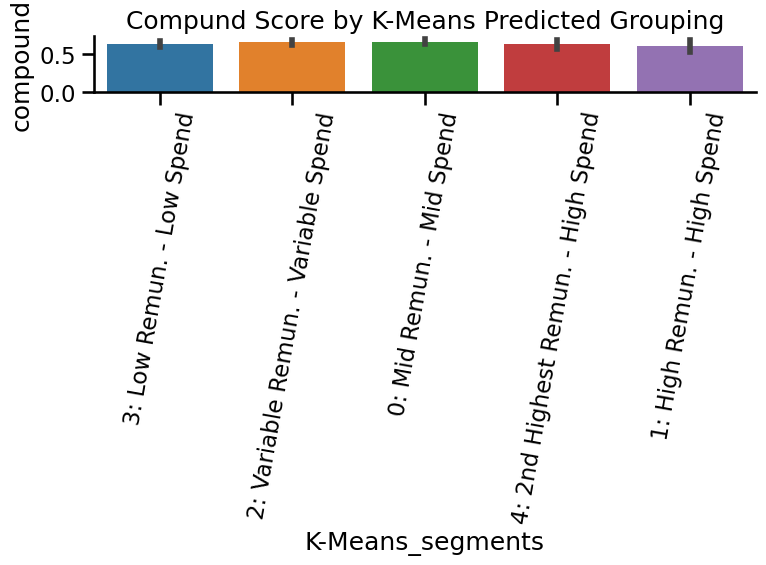

In [232]:
plt.figure(figsize=(8, 6))

ax = sns.barplot(data=p_score, x='K-Means_segments', y='compound')
ax.set_title('Compund Score by K-Means Predicted Grouping')


plt.xticks(rotation=80)
#plt.rcParams.update({'font.size':3 })
sns.despine()
plt.tight_layout()
plt.show()

In [233]:
p_score.columns

Index(['Id', 'polarity_neg', 'polarity_neu', 'polarity_pos', 'compound', 'Id',
       'gender', 'age', 'remuneration', 'spending_score', 'loyalty_points',
       'education', 'product', 'age_bin', 'age_bracket', 'remuneration',
       'loyalty_points', 'spending_score', 'K-Means Predicted',
       'review_&_comment merged', 'K-Means_segments', 'polarity',
       'subjectivity'],
      dtype='object')

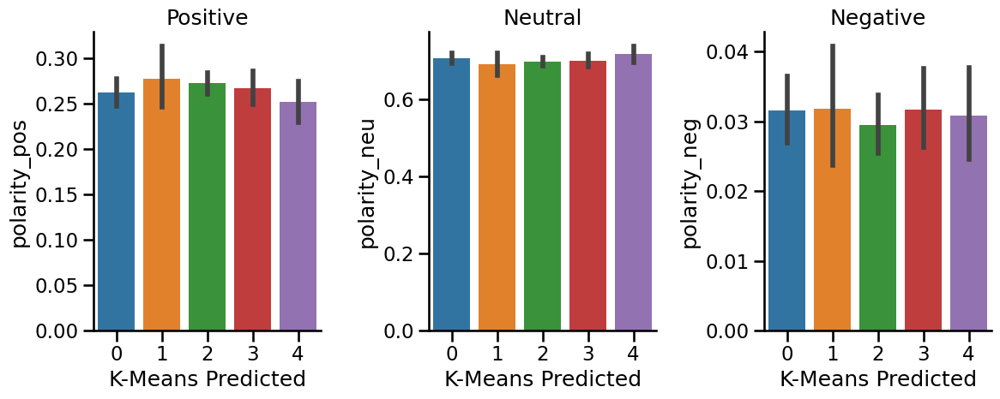

In [234]:
fig, axs = plt.subplots(1, 3, figsize=(12, 5))


sns.barplot(data=p_score, x='K-Means Predicted', y='polarity_pos', ax=axs[0])
sns.barplot(data=p_score, x='K-Means Predicted', y='polarity_neu', ax=axs[1])
sns.barplot(data=p_score, x='K-Means Predicted', y='polarity_neg', ax=axs[2])
axs[0].set_title('Positive')
axs[1].set_title('Neutral')
axs[2].set_title('Negative')
plt.tight_layout()

sns.despine()
plt.show()

No clear pattern in the sentiment across groups

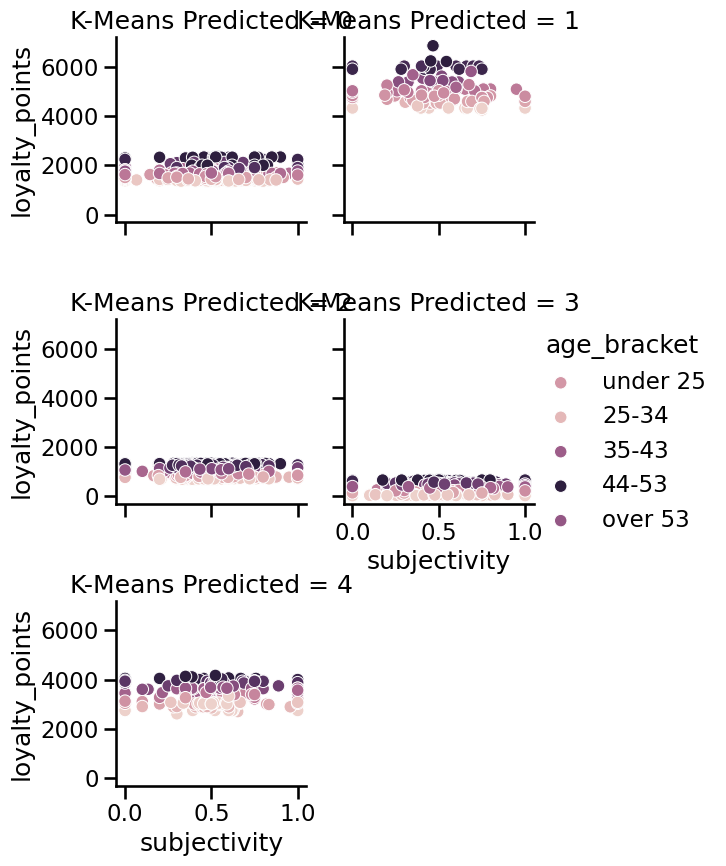

In [235]:

graph = sns.FacetGrid(p_score, col ="K-Means Predicted", col_wrap=2,  
                      hue ="age_bracket") 
# map the above form facetgrid with some attributes 

graph.map(sns.scatterplot, "subjectivity",
          "loyalty_points",
          edgecolor ="w").add_legend()

# show the object 
#plt.rcParams.update({'font.size': 3})
sns.set_context('notebook')
plt.savefig("facetgrid_plot.pdf")
plt.show() 

# <a id="division_ID9.4">9.4 Subjectivity By Age</a>

 

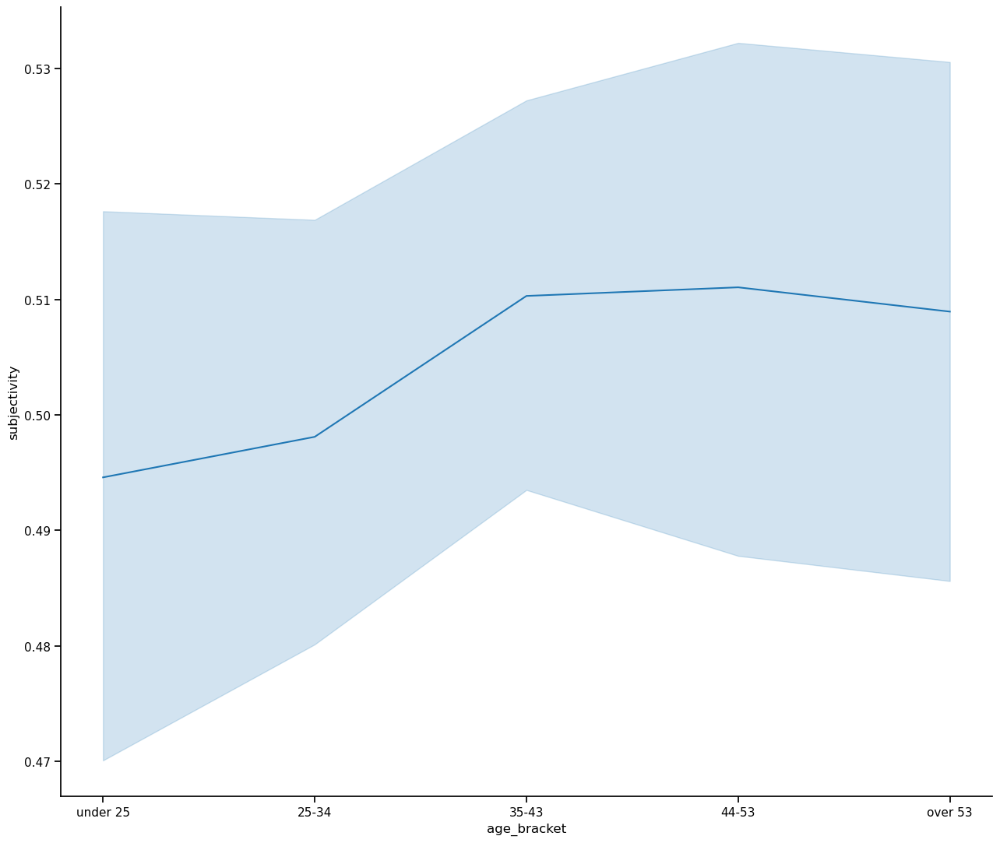

In [236]:
sns.lineplot(x='age_bracket', 
             y='subjectivity', 
             data=p_score)

sns.despine()
plt.show() 

In [237]:
#bringing together normalised loyality point data in the single column to aid comparison sepending_score_norm	loyalty_points_norm



p_score_norm_loyalty = p_score[['polarity_neg','polarity_neu','polarity_pos','compound','loyalty_points','spending_score','remuneration','subjectivity']]

#df2 = df.drop(df.columns[[0, 1, 2]],axis = 1)


p_score_norm_loyalty = p_score_norm_loyalty.drop(p_score_norm_loyalty.columns[[4,6,8]],axis=1)
p_score_norm_loyalty 
#correlation
p_score_norm_loyalty.corr().T

,polarity_neg,polarity_neu,polarity_pos,compound,subjectivity
polarity_neg,1.000000,0.009759,-0.333989,-0.514681,-0.001231
polarity_neu,0.009759,1.000000,-0.945790,-0.324086,-0.410033
polarity_pos,-0.333989,-0.945790,1.000000,0.472671,0.386903
compound,-0.514681,-0.324086,0.472671,1.000000,0.251152
subjectivity,-0.001231,-0.410033,0.386903,0.251152,1.000000


In [238]:
#correlation
p_score_norm_loyalty.corr().T

,polarity_neg,polarity_neu,polarity_pos,compound,subjectivity
polarity_neg,1.000000,0.009759,-0.333989,-0.514681,-0.001231
polarity_neu,0.009759,1.000000,-0.945790,-0.324086,-0.410033
polarity_pos,-0.333989,-0.945790,1.000000,0.472671,0.386903
compound,-0.514681,-0.324086,0.472671,1.000000,0.251152
subjectivity,-0.001231,-0.410033,0.386903,0.251152,1.000000


We can say sentiment does not appear to correlate with loyalty or a high spending score. All signals here are weak

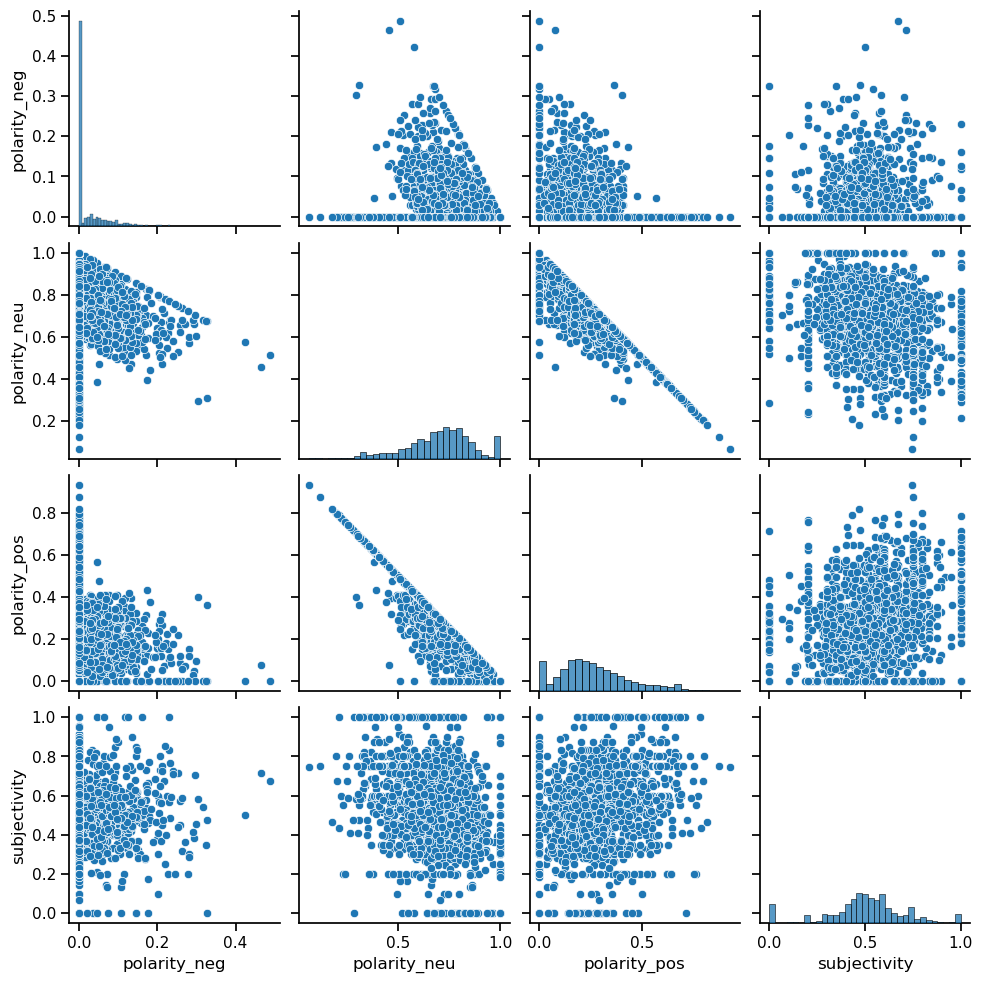

In [239]:
sns.pairplot(data=p_score_norm_loyalty,
             vars=['polarity_neg', 'polarity_neu', 'polarity_pos','subjectivity'])
             
plt.show()

Possibly more investigation needed as extreme views on the subjectity scale in the bottom right could highlight the rpesence of trolls. Also so the polarity negative extreme recording in the top left

## <a id="division_ID9.5">9.5 Semtiment by age, gender and educational attainment </a>

 

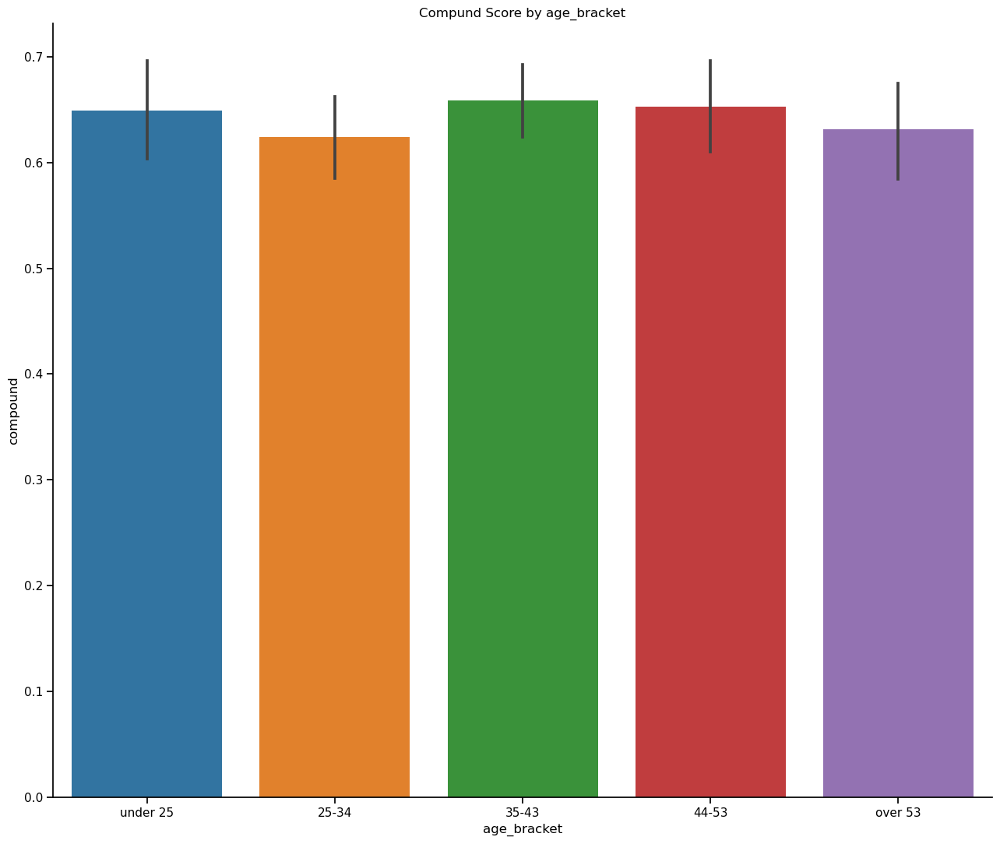

In [240]:
ax = sns.barplot(data=p_score, x='age_bracket', y='compound')
ax.set_title('Compund Score by age_bracket')
sns.despine()
plt.show()

No clear signal here on relationship between sentiment and age brackets

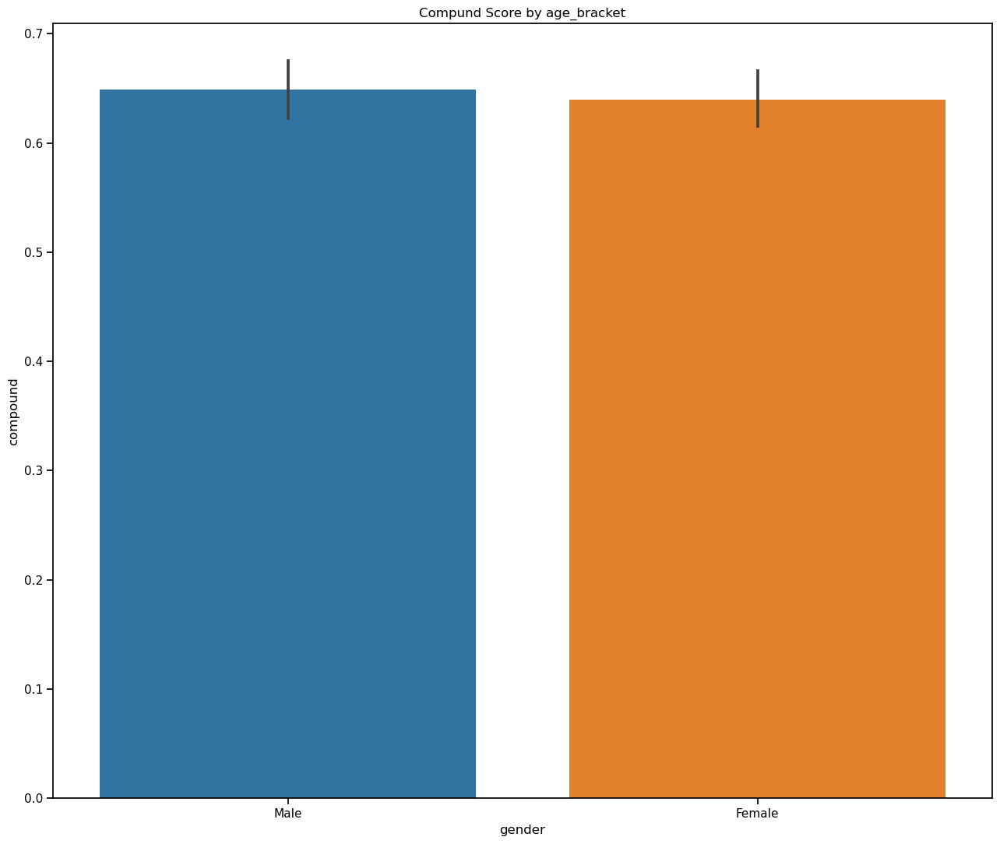

In [241]:
ax = sns.barplot(data=p_score, x='gender', y='compound')
ax.set_title('Compund Score by age_bracket')
ax.patch.set_alpha(1.0)
plt.show()

No real difference between the sexes in respect of sentiment 

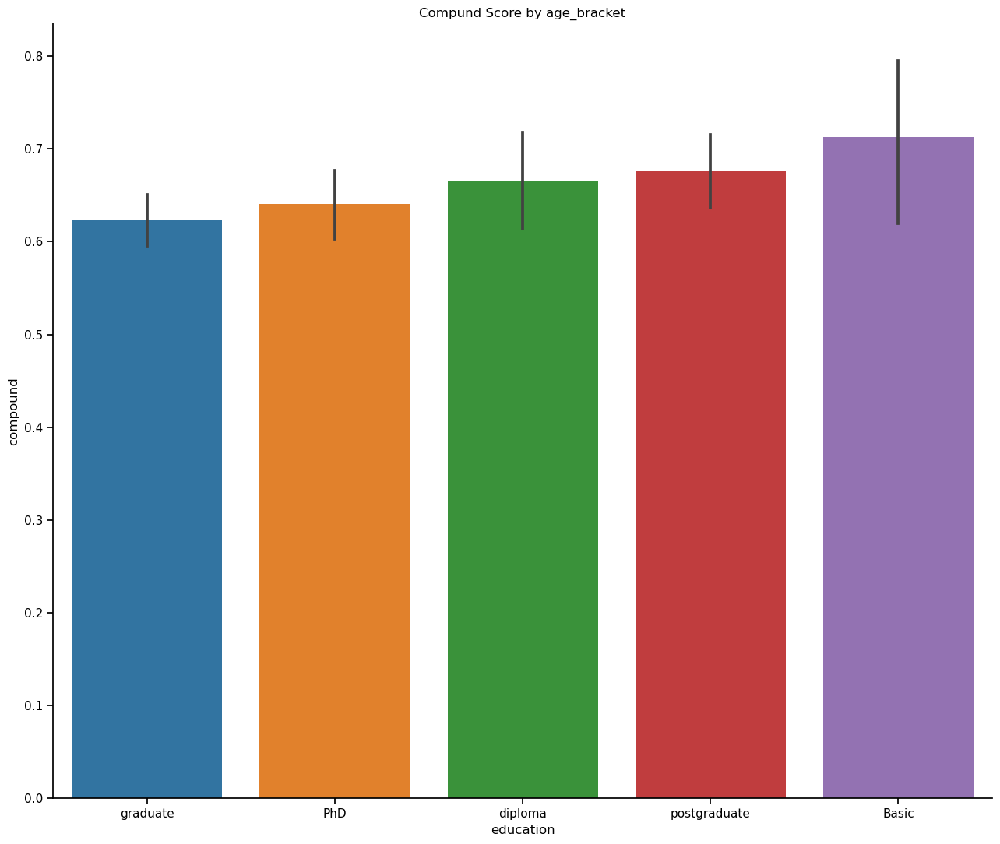

In [242]:
ax1 = sns.barplot(data=p_score, x='education', y='compound')
ax1.set_title('Compund Score by age_bracket')
sns.despine()
plt.show()

The higher the customer's educational attainment, the more likly they are to express positive. feelings about Turtle Games 

# <a id="division_ID10.0">10.0 Wordcloud</a>

 

### pre processing - tasks for wordcloud

> Visualise the most frequently used words

In [243]:
# String all the comments together in a single variable.
# Create an empty string variable.
all_comments = ''
for i in range(p_score.shape[0]):
    # Add each comment.
    all_comments = all_comments + p_score['review_&_comment merged'][i]

In [244]:
# You might need to install WordCloud.
!pip install WordCloud

In [245]:
# Import along with matplotlib and seaborn for visualisation.
from wordcloud import WordCloud 
import matplotlib.pyplot as plt 
import seaborn as sns

>3. Find the most frequently used words with tokenisation

In [246]:
from nltk.tokenize import word_tokenize

In [247]:
# Tokenise the words.
p_score['review_&_comment merged'] = p_score['review_&_comment merged'].apply(word_tokenize)

# Preview data.
p_score['review_&_comment merged'].head(1)

0    [when, it, comes, to, a, dm, 's, screen, ,, th...
Name: review_&_comment merged, dtype: object

In [248]:
# Define an empty list of tokens.
all_tokens = []

for i in range(p_score.shape[0]):
    # Add each token to the list.
    all_tokens = all_tokens + p_score['review_&_comment merged'][i]

In [249]:
# Import the FreqDist class.
from nltk.probability import FreqDist

# Calculate the frequency distribution.
fdist = FreqDist(all_tokens)

# Preview data.
fdist

FreqDist({'the': 5688, '.': 5444, ',': 3947, 'and': 3412, 'a': 3359, 'to': 3355, 'of': 2629, 'it': 2565, 'i': 2410, 'is': 1936, ...})

In [250]:
# Filter out tokens that are neither alphabets nor numbers (to eliminate punctuation marks, etc.).
tokens = [word for word in all_tokens if word.isalnum()]

### eliminating stopwords [including some I have manually selected]

In [251]:


#creating a custom list of stopwords
stop_list = ["n't","'s",".","—","d","n","t","s","really","just","like","one","get"]

# Download the stopword list.
nltk.download ('stopwords')
from nltk.corpus import stopwords

# entend()function is used to add custom stopwords

stpwrd = nltk.corpus.stopwords.words('english')
 
stpwrd.extend(stop_list)
print(stpwrd)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/levonmcgregor/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [252]:
# Create a set of English stopwords.
english_stopwords = stpwrd

In [253]:
# Create a filtered list of tokens without stopwords.
tokens2 = [x for x in tokens if x.lower() not in english_stopwords]

# Define an empty string variable.
tokens2_string = ''

for value in tokens:
    # Add each filtered token word to the string.
    tokens2_string = tokens2_string + value + ' '

>Visualise the tokens of relevance in a word cloud

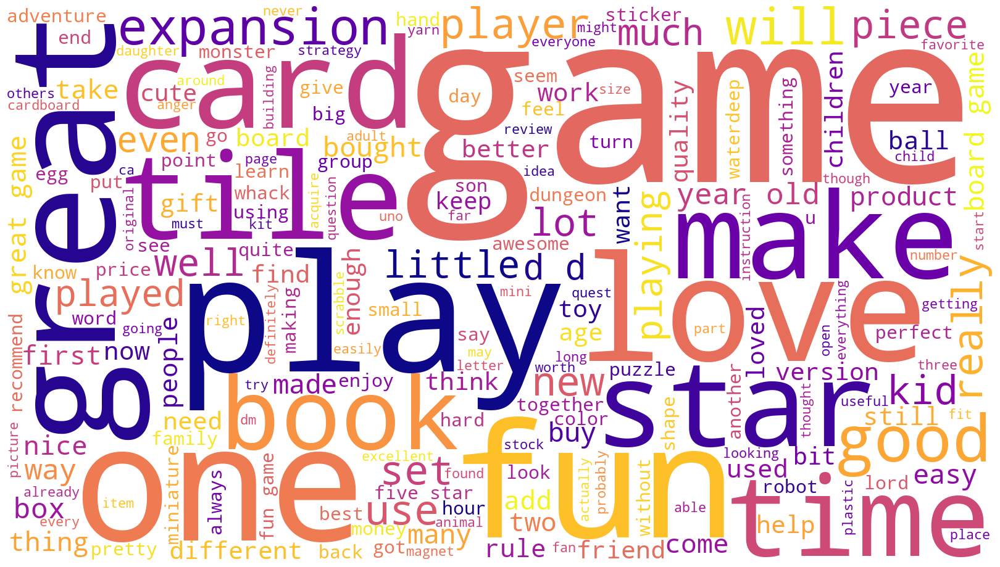

In [254]:
# Create a WordCloud.
wordcloud = WordCloud(width = 1600, height = 900, 
                background_color ='white', 
                colormap='plasma', 
                min_font_size = 10).generate(tokens2_string) 

# Plot the WordCloud image.                        
plt.figure(figsize = (16, 9), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis('off') 
plt.tight_layout(pad = 0) 
plt.show()

# Note that your word cloud might differ slightly to the one provided.

Count the top 15 words that appear most often

In [255]:
# View the frequency distribution.
fdist1 = FreqDist(tokens2)

# Preview the data.
fdist1

FreqDist({'game': 1923, 'great': 715, 'fun': 681, 'play': 514, 'stars': 502, 'love': 397, 'good': 328, 'tiles': 315, 'would': 314, 'book': 311, ...})

In [256]:
# Import the Counter class.
from collections import Counter

# Generate a DataFrame from Counter.
counts = pd.DataFrame(Counter(tokens2).most_common(15),
                      columns=['Word', 'Frequency']).set_index('Word')

# Preview data.
counts

,Frequency
Word,
game,1923
great,715
fun,681
play,514
stars,502
love,397
good,328
tiles,315
would,314


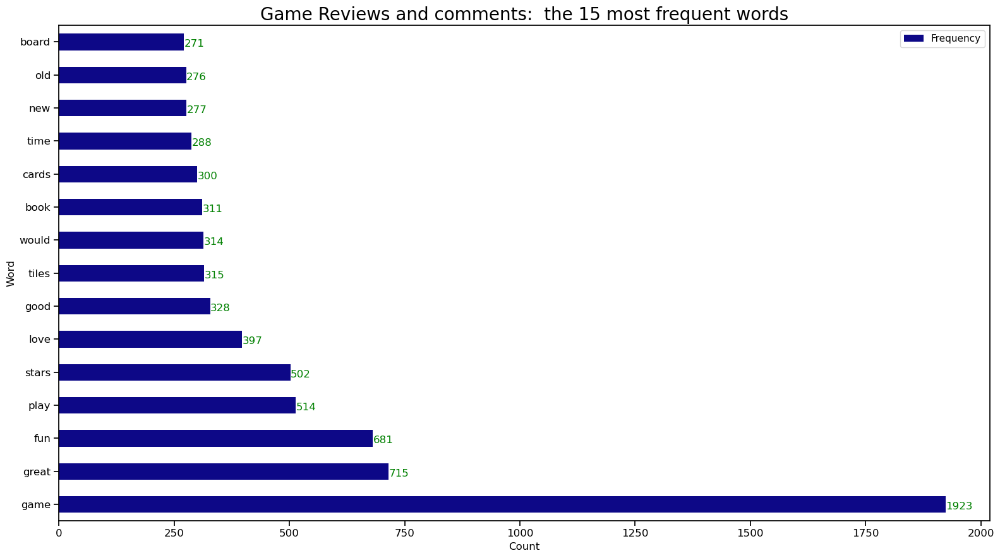

In [257]:
# Set the plot type.
ax = counts.plot(kind='barh', figsize=(16, 9), fontsize=12,
                 colormap ='plasma')

# Set the labels.
ax.set_xlabel('Count', fontsize=12)
ax.set_ylabel('Word', fontsize=12)
ax.set_title("Game Reviews and comments:  the 15 most frequent words",
             fontsize=20)

# Draw the bar labels.
for i in ax.patches:
    ax.text(i.get_width()+.41, i.get_y()+.1, str(round((i.get_width()), 2)),
            fontsize=12, color='green')

### <a id="division_ID10.1">10.1 Extract polarity and subjectivity from Turtle Games comments and reviews</a>

 

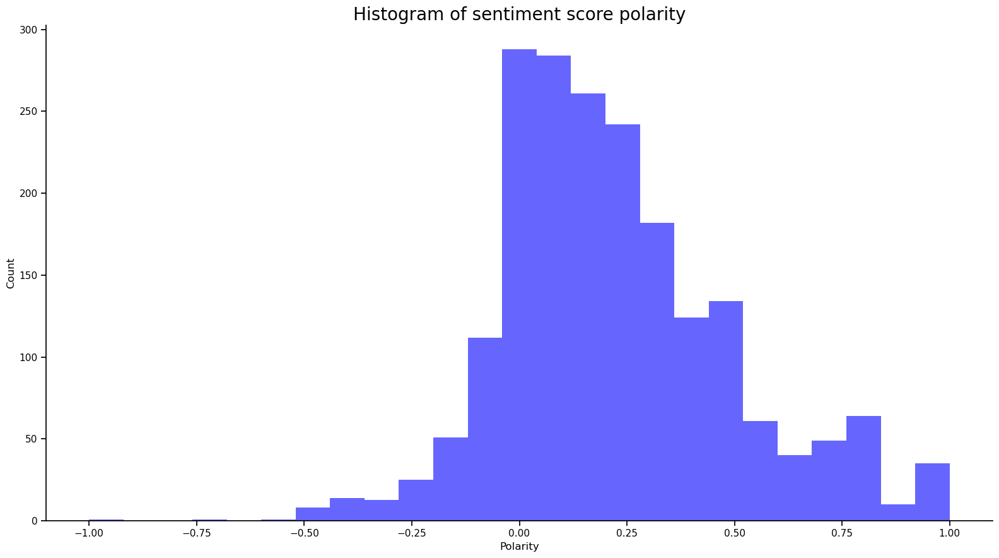

In [258]:
# Set the number of bins.
num_bins = 25

# Set the plot area.
plt.figure(figsize=(16,9))

# Define the bars.
n, bins, patches = plt.hist(p_score['polarity'], num_bins, facecolor='blue', alpha=0.6)

# Set the labels.
plt.xlabel('Polarity', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Histogram of sentiment score polarity', fontsize=20)
sns.despine()
plt.show()

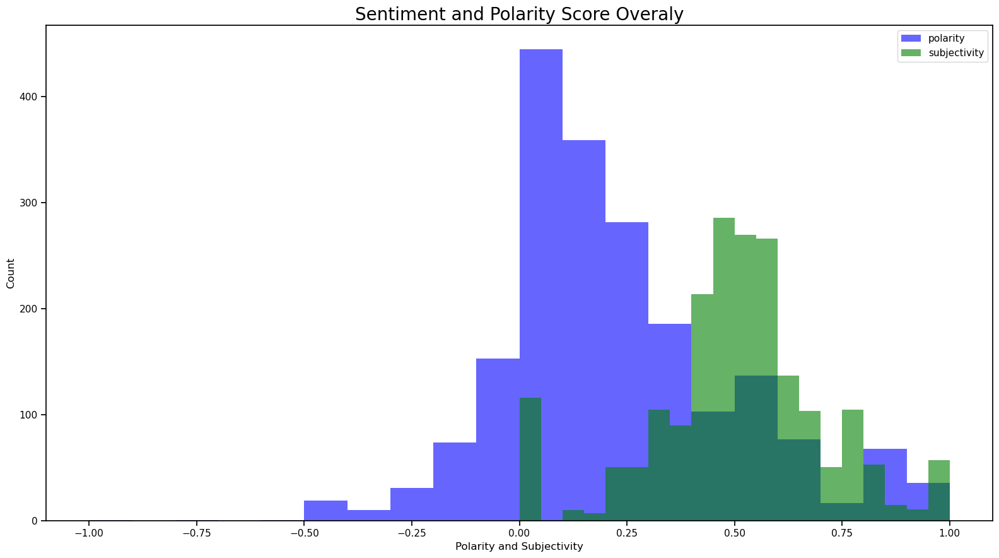

In [259]:
# Set the number of bins.
num_bins = 20

# Set the plot area.
plt.figure(figsize=(16,9))

# Define the bars.
n, bins, patches = plt.hist(p_score['polarity'], num_bins, facecolor='blue', alpha=0.6, label="polarity")
n, bins, patches = plt.hist(p_score['subjectivity'], num_bins, facecolor='green', alpha=0.6, label="subjectivity")


# Set the labels.
plt.xlabel('Polarity and Subjectivity', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Sentiment and Polarity Score Overaly', fontsize=20)
plt.legend(loc='upper right')

plt.show()

This plot shows that most comments skew to the right, expressing positive sentiments overall .
There are a few negative comments and some of these are extremely negative on the subjectivity scale and there should be checks for trolling activity. 

>examples of positive comments

In [260]:
# Create a DataFrame.
positive_sentiment = p_score.nlargest(10, 'polarity')

# Eliminate unnecessary columns.
positive_sentiment = positive_sentiment.loc[:, ['spending_score','compound','polarity','subjectivity','review_&_comment merged','K-Means Predicted']]

positive_sentiment

,spending_score,spending_score,compound,polarity,subjectivity,review_&_comment merged,K-Means Predicted
7,94.0,94.0,0.5719,1.0,1.000,"[came, in, perfect, condition.five, stars]",2
165,75.0,75.0,0.6249,1.0,1.000,"[awesome, bookfive, stars]",4
194,16.0,16.0,0.6249,1.0,1.000,"[awesome, giftfive, stars]",2
216,35.0,35.0,0.6588,1.0,0.750,"[great, product, !, arrived, on, time.five, st...",3
318,43.0,43.0,0.8741,1.0,0.750,"[great, buy, !, !, my, granddaughter, loves, i...",0
418,29.0,29.0,0.8902,1.0,0.750,"[great, resource, for, bhis, care, coordinator...",3
474,47.0,47.0,0.8741,1.0,0.875,"[great, seller, !, !, !, happy, with, my, purc...",0
496,47.0,47.0,0.6114,1.0,1.000,"[excellent, activity, for, teaching, self-mana...",0
524,29.0,29.0,0.6467,1.0,1.000,"[perfect, ,, just, what, i, ordered, !, !, fiv...",2
591,69.0,69.0,0.5719,1.0,1.000,"[wonderful, productfive, stars]",4


In [261]:
y = p_score.groupby('K-Means Predicted')[['polarity_neg','polarity_neu','polarity_pos','compound','polarity','subjectivity','spending_score','remuneration','loyalty_points']].mean()



#p_score_norm_loyalty = p_score_norm_loyalty.drop(p_score_norm_loyalty.columns[[4,6,8]],axis=1)

y = y.drop(y.columns[[6,8,10]],axis=1)
y.corr()


,polarity_neg,polarity_neu,polarity_pos,compound,polarity,subjectivity
polarity_neg,1.000000,-0.097912,0.003918,-0.461843,0.096347,-0.209873
polarity_neu,-0.097912,1.000000,-0.995570,0.347335,-0.668611,0.375837
polarity_pos,0.003918,-0.995570,1.000000,-0.305220,0.662665,-0.357178
compound,-0.461843,0.347335,-0.305220,1.000000,-0.863575,0.924510
polarity,0.096347,-0.668611,0.662665,-0.863575,1.000000,-0.883370
subjectivity,-0.209873,0.375837,-0.357178,0.924510,-0.883370,1.000000


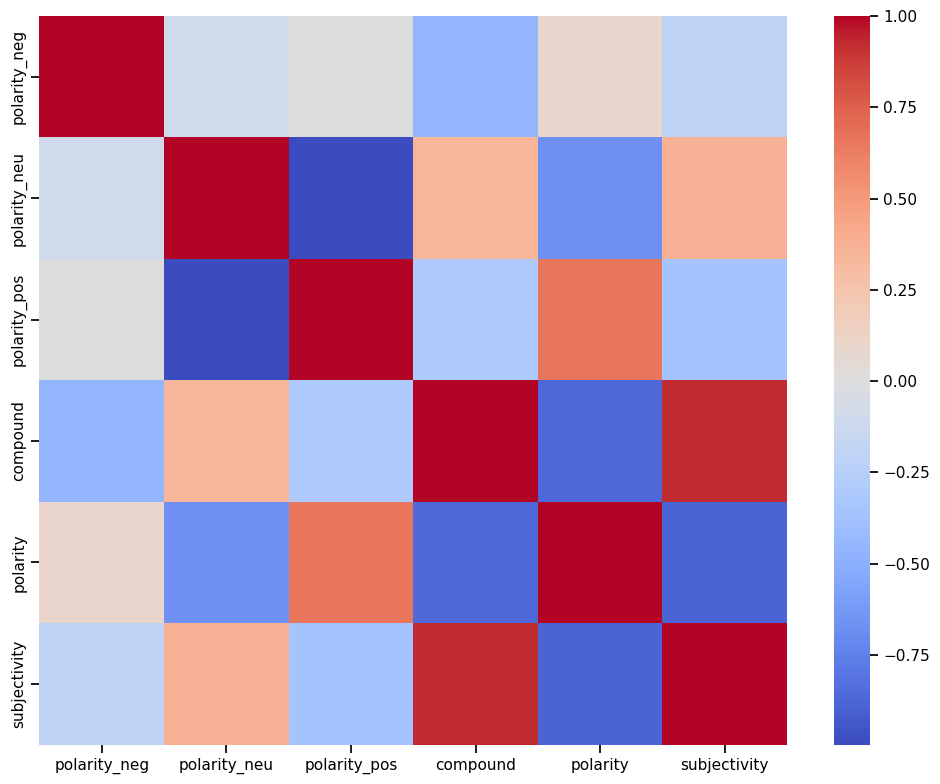

In [262]:
# Calculate the correlation matrix
correlation_matrix = y.corr()

# Create the heatmap
plt.figure(figsize = (10,8))
sns.heatmap(correlation_matrix, cmap = 'coolwarm')
plt.show()

In [263]:
y.describe()

,polarity_neg,polarity_neu,polarity_pos,compound,polarity,subjectivity
count,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000
mean,0.031085,0.702619,0.266321,0.635553,0.226147,0.503600
std,0.000940,0.009953,0.009898,0.021063,0.014170,0.005950
min,0.029532,0.690589,0.251852,0.607160,0.207230,0.497632
25%,0.030857,0.698053,0.262396,0.627549,0.222223,0.499376
50%,0.031587,0.701064,0.267255,0.630718,0.226911,0.502761
75%,0.031682,0.706060,0.272426,0.652228,0.227550,0.505467
max,0.031766,0.717330,0.277677,0.660110,0.246819,0.512762


It seems sentiment did not deviate much from the mean as seen in the table above

## Indentify Names Entities 

In [264]:
!pip install -U pip setuptools wheel
!pip install -U spacy
!python -m spacy download en_core_web_sm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 71.0 MB/s eta 0:00:00a 0:00:01
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


In [265]:
!pip install spaCy

# Import the library.
import spacy

# Load the English resource.
nlp = spacy.load('en_core_web_sm')

# Return the text snippet and its corresponding entity label in a list.
def generate_named_entities(comments):
 return [(ent.text.strip(), ent.label_) for ent in nlp(comments).ents]

In [266]:
def generate_named_entities(comment):
 return [(ent.text.strip(), ent.label_) for ent in nlp('review_&_comment merged').ents]

In [267]:
p_score['review_&_comment merged'].apply(generate_named_entities)

0       []
1       []
2       []
3       []
4       []
        ..
1995    []
1996    []
1997    []
1998    []
1999    []
Name: review_&_comment merged, Length: 2000, dtype: object

In [268]:
p_score['named_entities'] = p_score['review_&_comment merged'].apply(generate_named_entities)

p_score.head(3)

,Id,polarity_neg,polarity_neu,polarity_pos,compound,Id,gender,age,remuneration,spending_score,...,age_bracket,remuneration,loyalty_points,spending_score,K-Means Predicted,review_&_comment merged,K-Means_segments,polarity,subjectivity,named_entities
0,0,0.117,0.828,0.055,-0.7611,0,Male,18,12.30,39.0,...,under 25,12.30,210,39.0,3,"[when, it, comes, to, a, dm, 's, screen, ,, th...",3: Low Remun. - Low Spend,-0.012500,0.497500,[]
1,1,0.106,0.699,0.195,0.9203,1,Male,23,12.30,81.0,...,under 25,12.30,524,81.0,3,"[an, open, letter, to, galeforce9, *, :, your,...",3: Low Remun. - Low Spend,-0.003855,0.464739,[]
2,2,0.130,0.706,0.164,0.7455,2,Female,22,13.12,6.0,...,under 25,13.12,40,6.0,3,"[nice, art, ,, nice, printing, ., why, two, pa...",3: Low Remun. - Low Spend,0.105901,0.437971,[]


In [269]:
from spacy import displacy

# Iterate through a selection of comments.
for i in range(750,1750):
    # Check whether the corresponding comment has a named entity.
    if p_score['named_entities'][i]:
        # Highlight the entity in the comment.
        displacy.render(nlp(p_score['review_&_comment merged'][i]), style='ent', jupyter=True)

>semtiment polarity boxplot by customer segemnt ( K means)

In [270]:
p_score.columns

Index(['Id', 'polarity_neg', 'polarity_neu', 'polarity_pos', 'compound', 'Id',
       'gender', 'age', 'remuneration', 'spending_score', 'loyalty_points',
       'education', 'product', 'age_bin', 'age_bracket', 'remuneration',
       'loyalty_points', 'spending_score', 'K-Means Predicted',
       'review_&_comment merged', 'K-Means_segments', 'polarity',
       'subjectivity', 'named_entities'],
      dtype='object')

In [271]:
p_score_segments = p_score[['K-Means Predicted','compound','polarity','subjectivity','spending_score','loyalty_points']]
p_score_segments

,K-Means Predicted,compound,polarity,subjectivity,spending_score,spending_score,loyalty_points,loyalty_points
0,3,-0.7611,-0.012500,0.497500,39.0,39.0,210,210
1,3,0.9203,-0.003855,0.464739,81.0,81.0,524,524
2,3,0.7455,0.105901,0.437971,6.0,6.0,40,40
3,3,0.8065,0.443182,0.677273,77.0,77.0,562,562
4,3,-0.7845,-0.316667,0.316667,40.0,40.0,366,366
...,...,...,...,...,...,...,...,...
1995,4,0.9618,0.211250,0.560000,69.0,69.0,4031,4031
1996,3,0.9324,0.178571,0.294322,8.0,8.0,539,539
1997,1,0.6588,0.000000,0.516667,91.0,91.0,5614,5614
1998,2,0.5562,0.300000,0.200000,16.0,16.0,1048,1048


For our highest performing segments , few of the setiment  scores correlate with positive business outcomes of high spend and high loyality score. 

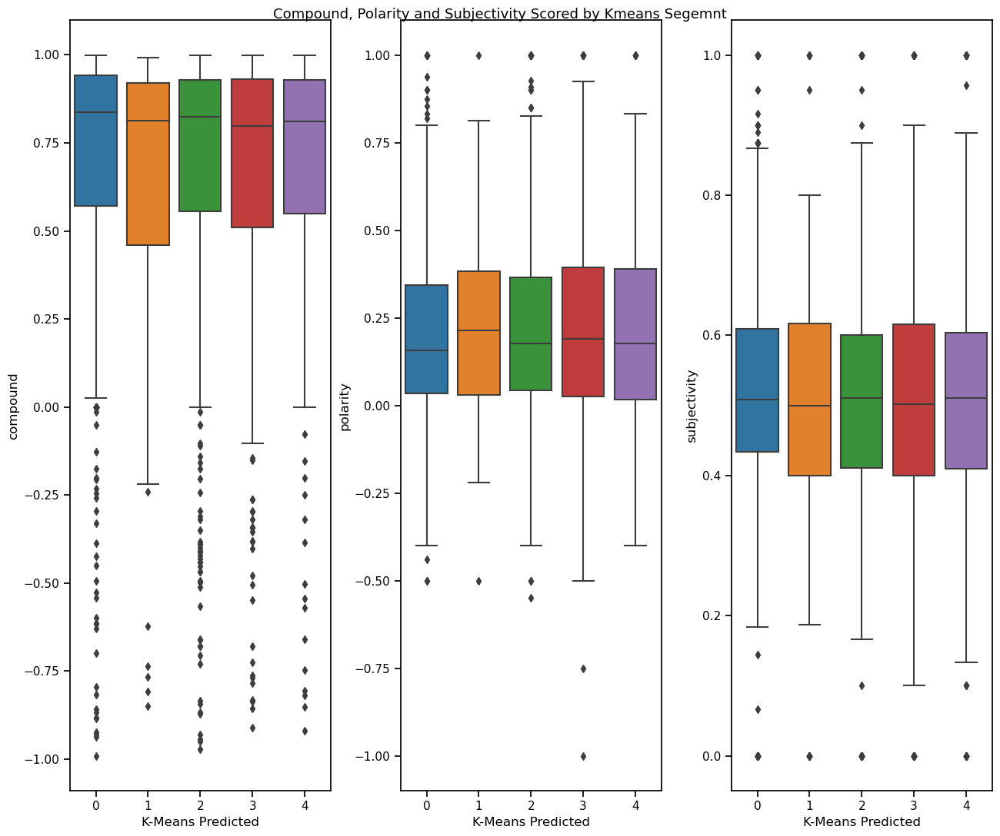

In [272]:
fig, axes = plt.subplots(1, 3)
sns.boxplot( data=p_score_segments, x='K-Means Predicted', y='compound',  orient='v', ax=axes[0])
sns.boxplot(data=p_score_segments, x='K-Means Predicted', y='polarity', orient='v', ax=axes[1])
sns.boxplot(data=p_score_segments, x='K-Means Predicted', y='subjectivity', orient='v', ax=axes[2])

plt.suptitle('Compound, Polarity and Subjectivity Scored by Kmeans Segemnt',fontsize=13)
plt.tight_layout(pad=0.6)
sns.set_context('notebook')
plt.show()

In [273]:
p_score_corr = p_score_segments[['compound','polarity','subjectivity','spending_score','loyalty_points']]
p_score_corr.corr()

,compound,polarity,subjectivity,spending_score,spending_score,loyalty_points,loyalty_points
compound,1.000000,0.326797,0.251152,-0.006092,-0.006092,-0.021020,-0.021020
polarity,0.326797,1.000000,0.521343,0.017776,0.017776,0.000567,0.000567
subjectivity,0.251152,0.521343,1.000000,-0.020730,-0.020730,-0.004615,-0.004615
spending_score,-0.006092,0.017776,-0.020730,1.000000,1.000000,0.672310,0.672310
spending_score,-0.006092,0.017776,-0.020730,1.000000,1.000000,0.672310,0.672310
loyalty_points,-0.021020,0.000567,-0.004615,0.672310,0.672310,1.000000,1.000000
loyalty_points,-0.021020,0.000567,-0.004615,0.672310,0.672310,1.000000,1.000000



this is born out by the table above. Let see if there are any qualitative difference between the segments

# <a id="division_ID11.0">11.0 Exploring data with decision trees</a>

 

In [274]:
# Read the data file with Pandas.
df2 = pd.read_csv('turtle_reviews.csv',header=0)

>Changing the values of Education to float and encoding

In [275]:
# Display all the unique values/check changes.
print(df2['education'].unique())
print(df2['education'].value_counts() )

['graduate' 'PhD' 'diploma' 'postgraduate' 'Basic']
education
graduate        900
PhD             460
postgraduate    400
diploma         190
Basic            50
Name: count, dtype: int64


In [276]:
#The order of the Edu column is meaningful and the order matters, so apply LabelEncoder to this column. 
from sklearn.preprocessing import LabelEncoder
from sklearn.utils.validation import column_or_1d
import pandas as pd
import numpy as np

# Create a class and write a user-defined function.
class MyLabelEncoder(LabelEncoder):
    def fit(self, y):
        xy = column_or_1d(y, warn=True)
        self.classes_ = pd.Series(xy).unique()
        return self

# Order lists of the values for the Edu column.
Educ_order = ['Basic', 'diploma', 'graduate', 'postgraduate', 'PhD']

# Create an instance of MyLabelEncoder.
le = MyLabelEncoder()

# Fit the encoder with the ordered values.
le.fit(Educ_order)

# Apply the LabelEncoder to the Edu column in the DataFrame.
df2['education'] = df2['education'].apply(lambda x: x if x in Educ_order else 'other')
df2['education'] = le.transform(df2['education'])

# View the DataFrame
print(df2.head())

   gender  age  remuneration (k£)  spending_score (1-100)  loyalty_points  \
0    Male   18              12.30                      39             210   
1    Male   23              12.30                      81             524   
2  Female   22              13.12                       6              40   
3  Female   25              13.12                      77             562   
4  Female   33              13.94                      40             366   

   education language platform  product  \
0          2       EN      Web      453   
1          2       EN      Web      466   
2          2       EN      Web      254   
3          2       EN      Web      263   
4          2       EN      Web      291   

                                              review  \
0  When it comes to a DM's screen, the space on t...   
1  An Open Letter to GaleForce9*:\n\nYour unpaint...   
2  Nice art, nice printing.  Why two panels are f...   
3  Amazing buy! Bought it as a gift for our new d...  

In [277]:
#creation of required variables 

cols = ['age','remuneration (k£)','spending_score (1-100)']

y = df2['loyalty_points']

X = df2[cols]


In [278]:
#sense checking the data 

print(X.shape)
print(X.head(5))
print(y.shape)
print(y.head(5))

(2000, 3)
   age  remuneration (k£)  spending_score (1-100)
0   18              12.30                      39
1   23              12.30                      81
2   22              13.12                       6
3   25              13.12                      77
4   33              13.94                      40
(2000,)
0    210
1    524
2     40
3    562
4    366
Name: loyalty_points, dtype: int64


In [279]:
#change all datatypes into float values 
X = X.astype({"age":'float64', "remuneration (k£)":'float64',"spending_score (1-100)":'float64'})  
y = y.astype({"loyalty_points":'float64'})

# lets find out the data type after changing 
print(X.dtypes) 
print(y.dtypes)

age                       float64
remuneration (k£)         float64
spending_score (1-100)    float64
dtype: object
float64


## <a id="division_ID11.1">11.1 Decision Tree Regressor</a>

 

In [280]:
# Create testing data
X_train,X_test,y_train,y_test=train_test_split(X,y,random_state=42,test_size=0.35)

# Create classifier
regressor=DecisionTreeRegressor(random_state=42)

# Fit the training data
regressor.fit(X_train,y_train)

DecisionTreeRegressor(random_state=42)

In [281]:
# Predict using the training data
y_train_predicted=regressor.predict(X_train)

# Predict using the test data
y_test_predicted=regressor.predict(X_test)

# Print accuracy values
print(accuracy_score(y_train,y_train_predicted)) # prediction is the same as the observation
print(accuracy_score(y_test,y_test_predicted)) # prediction on 'unseen data'

1.0
0.7228571428571429


72% indicates a good level of accuracy on the predicted dataset - lets proceeed 

>Plotting the full tree unrestricted

In [282]:
from sklearn.tree import plot_tree

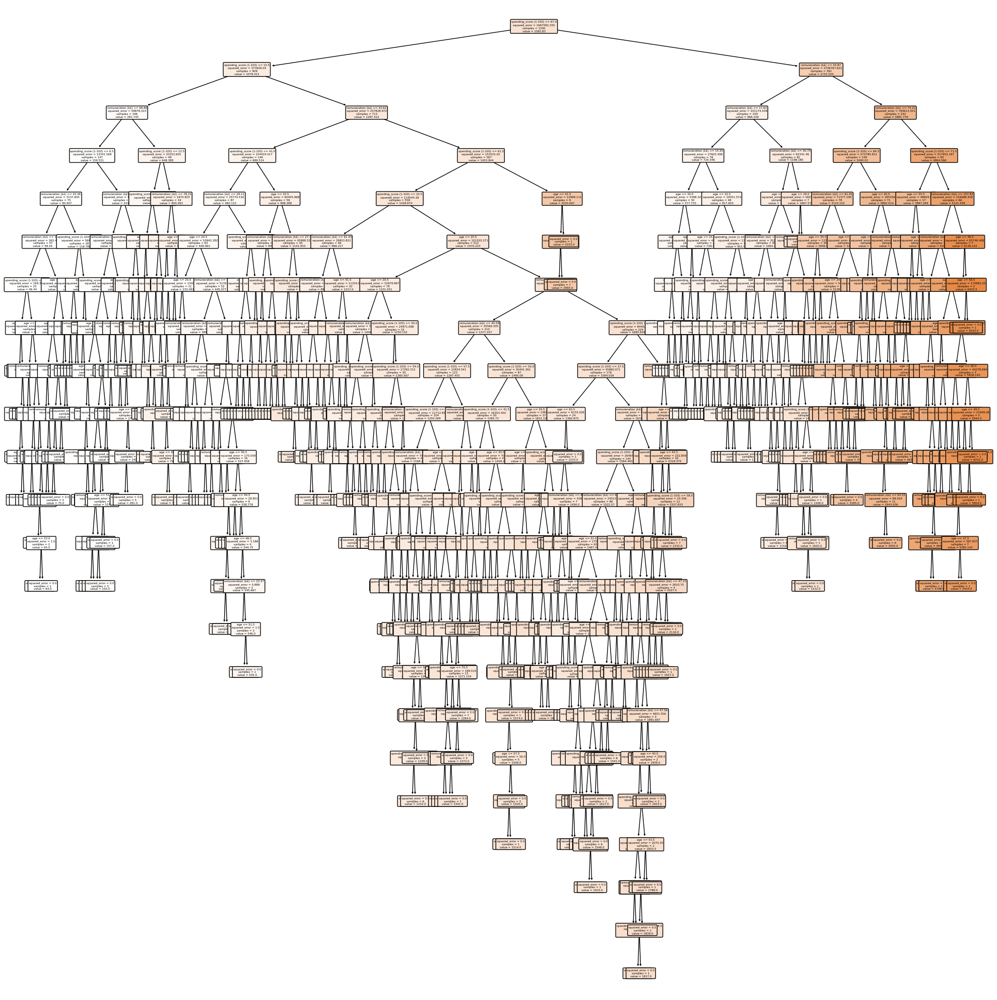

In [283]:
# Plot the tree

# Plot the decision tree to create the visualisation:
fig, ax = plt.subplots(figsize=(20, 20))
tree.plot_tree(regressor, fontsize=4, filled=True,feature_names=X.columns,rounded=True)

# Print the plot with plt.show().
plt.show() 

In [284]:
print("Depth =",regressor.get_depth())
print("Leaves =",regressor.get_n_leaves())
tests = accuracy_score(y_train,regressor.predict(X_train))
print("Accuracy score: {:2.2%}".format(tests))

Depth = 22
Leaves = 536
Accuracy score: 100.00%


>how we learn the relative importance of each feature by name 

In [285]:
#ordering by descending order of importance each features in the regression tree

importances = regressor.feature_importances_


df = pd.DataFrame({'feature_names': X.columns,'Importances':regressor.feature_importances_})
df1 = df.sort_values(by='Importances',ascending=False)
df1


,feature_names,Importances
1,remuneration (k£),0.502422
2,spending_score (1-100),0.479600
0,age,0.017978


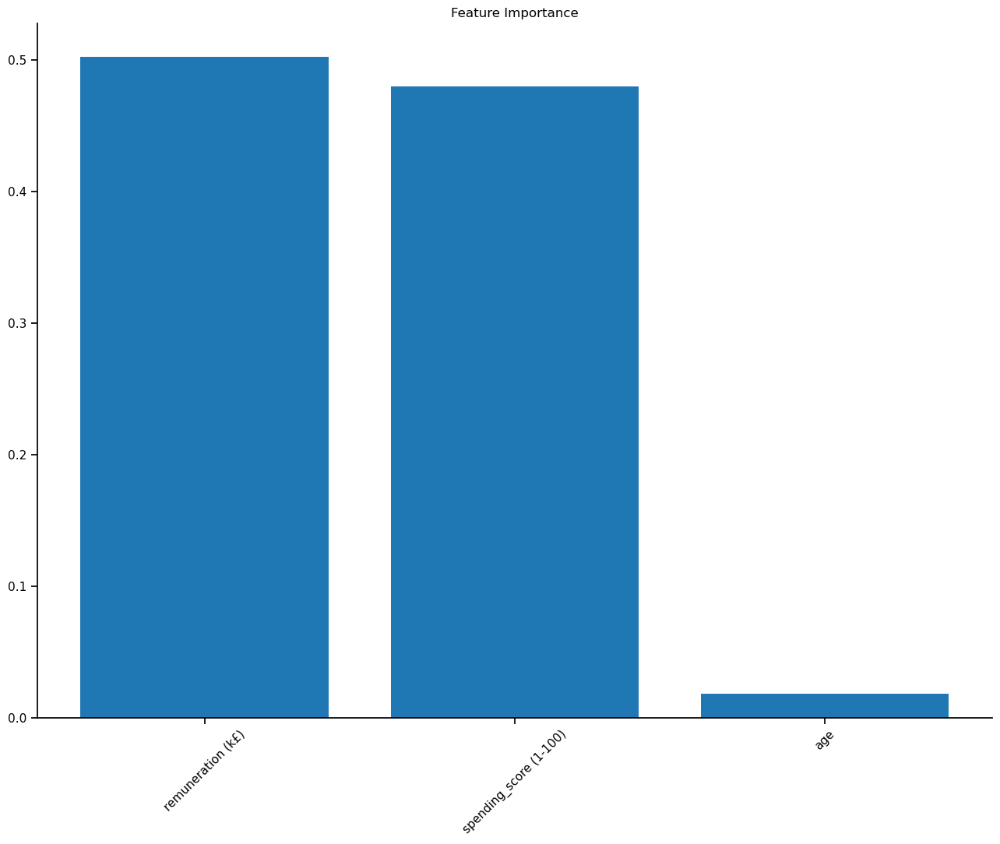

In [286]:
#ploting importance on a graph for visualisation 

plt.bar(df1['feature_names'],df1['Importances'])
plt.xticks(rotation=45)
plt.title('Feature Importance')
sns.despine()

In [287]:
regressor.get_params()

{'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'random_state': 42,
 'splitter': 'best'}

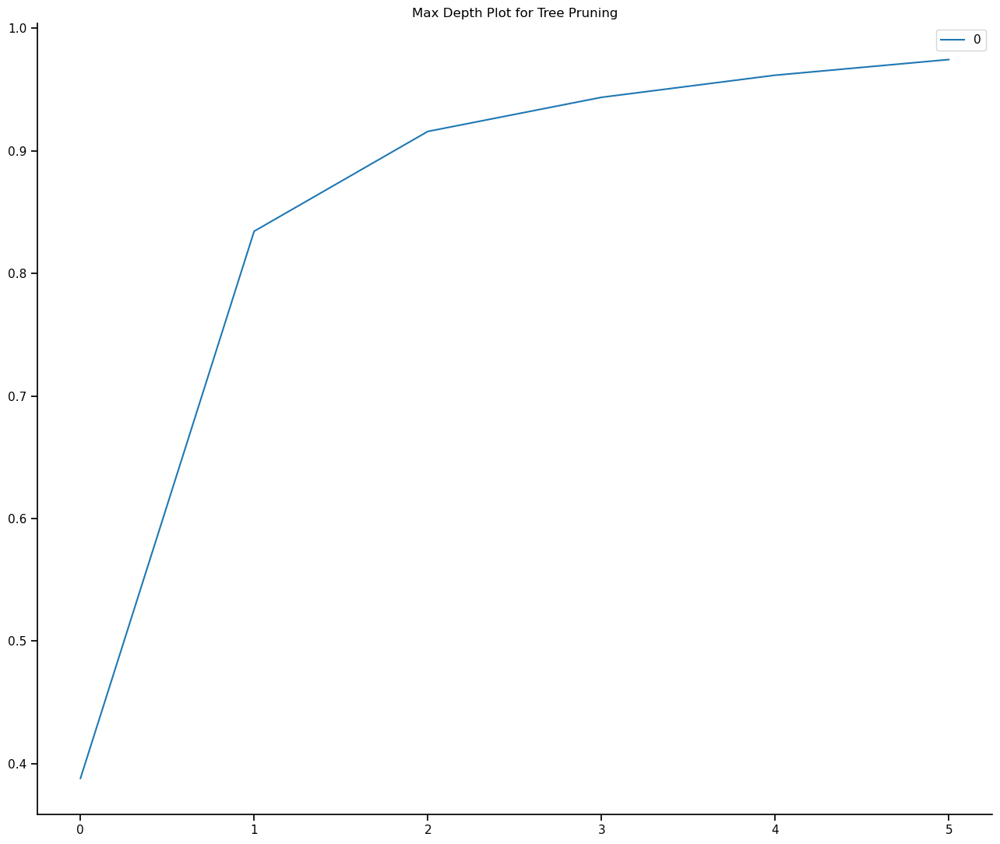

In [288]:
# List of values to try for max_depth:
max_depth_range = list(range(1, 7))
# List to store the accuracy for each value of max_depth:
accuracy = []
for depth in max_depth_range:
    
    dtct = DecisionTreeRegressor(max_depth = depth, random_state = 10)
    dtct.fit(X, y)
    score = dtct.score(X_test, y_test)
    accuracy.append(score)

# Plot accuracy values across the range of depth values evaluated
accuracy = pd.DataFrame(accuracy)
accuracy.plot()
plt.title('Max Depth Plot for Tree Pruning')
sns.despine()

In [289]:
# Pruning the model using (pre-)pruning using supplied parameters
# In practice we would use a specific method such as cost complexity pruning to evaluate alternatives.
regressorp = DecisionTreeRegressor(criterion = 'absolute_error',
                                   max_depth = 5,
                                   min_samples_leaf = 5,
                                   min_samples_split = 200)
regressorp.fit(X_train,y_train)
y_predicted=regressorp.predict(X_test)
accuracy_score(y_test,y_predicted)

0.018571428571428572

In [290]:
# Note that we now use all the available data for our final model.



# Create a Regression Tree classifer object.
regressorf = DecisionTreeRegressor(criterion = 'absolute_error',
                             max_depth = 5,
                             min_samples_leaf = 5,
                             min_samples_split = 200)

# Train the Decision Tree Classifer.
regressorf = regressorf.fit(X, y)

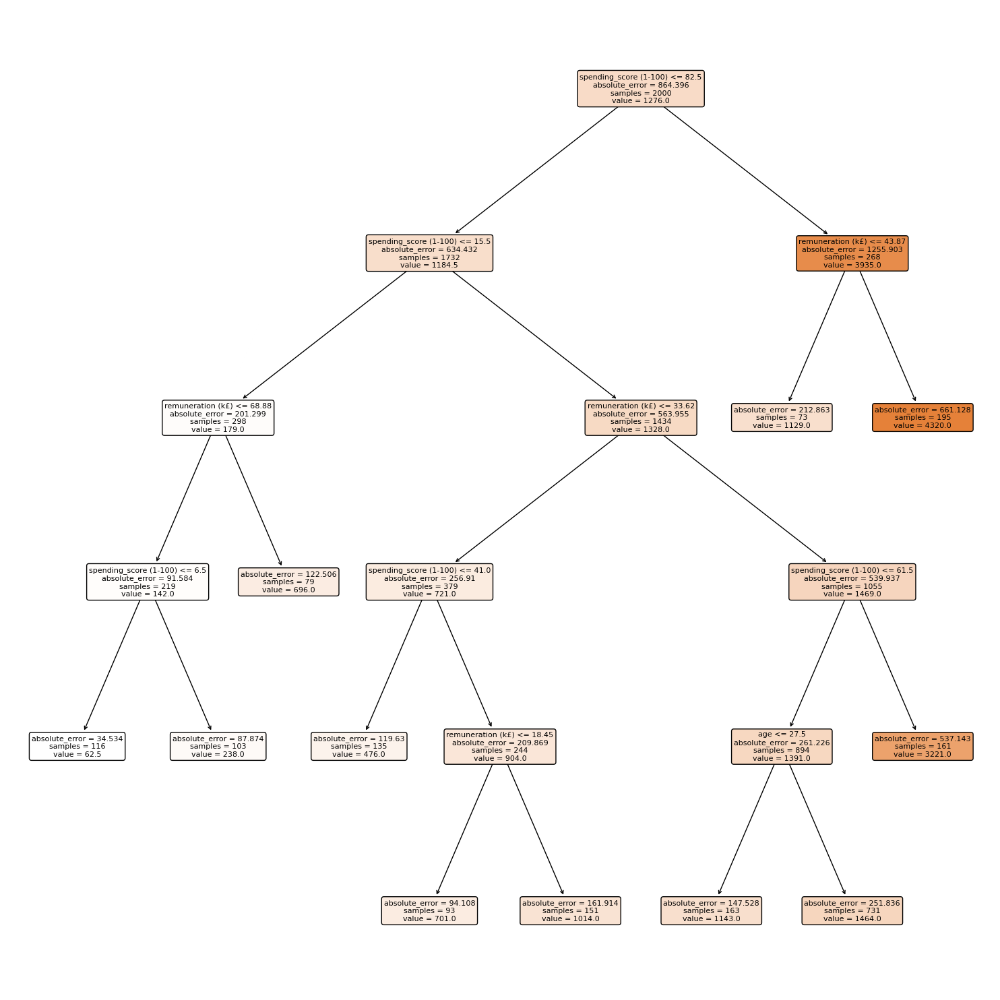

In [291]:
# Plot final model


# Plot the decision tree to create the visualisation:
fig, ax = plt.subplots(figsize=(15, 15))
tree.plot_tree(regressorf, fontsize=8,filled=True,feature_names=X.columns,rounded=True)

#tree.plot_tree
# Print the plot with plt.show().
plt.savefig('Decision Tree Final')
plt.show() 

In [292]:
print("Depth =",regressorf.get_depth())
print("Leaves =",regressorf.get_n_leaves())
tests = accuracy_score(y_train,regressor.predict(X_train))
print("Accuracy score: {:2.2%}".format(tests))

Depth = 5
Leaves = 11
Accuracy score: 100.00%


In [293]:

##<a id="division_ID11.2">11.2 Alternative way to view the pruned tree with dtreeviz</a>

In [294]:
import dtreeviz

viz = dtreeviz.model(regressorf, X, y, feature_names=X.columns,target_name="Target")
viz.view(scale=1.5)


In [295]:
from sklearn.metrics import mean_squared_error, r2_score 

In [296]:
#https://scikit-learn.org/stable/modules/classes.html#module-sklearn.metrics

def reg_metrics(y_test, y_predicted, X_train):
    from sklearn.metrics import mean_squared_error, r2_score 

    

In [297]:
rmse = np.sqrt(mean_squared_error(y_test,y_predicted))
r2 = r2_score(y_test,y_predicted)

    # Scikit-learn doesn't have adjusted r-square, hence custom code
n = y_predicted.shape[0]
k = X_train.shape[1]
adj_r_sq = 1 - (1 - r2)*(n-1)/(n-1-k)

print("Root Mean Squared Error:",np.sqrt(mean_squared_error(y_test,y_predicted)))
print("R squared:",r2_score(y_test,y_predicted))
print("Adjusted R squared:", 1 - (1 - r2)*(n-1)/(n-1-k))

Root Mean Squared Error: 696.7472774051066
R squared: 0.6977919135206586
Adjusted R squared: 0.6964892924582478


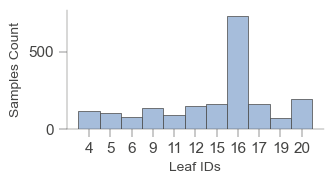

In [298]:
viz.leaf_sizes(figsize=(3.5,2))

In [299]:
import math

# Predict the response for the data test.
y_predicted = regressor.predict(X_test)  

# Specify to print the MAE and MSE (to evaluate the accuracy of the new model).
print("Mean Absolute Error: ", metrics.mean_absolute_error(y_test, y_predicted))
print("Mean Squared Error: ", metrics.mean_squared_error(y_test, y_predicted))
# Calculate the RMSE.
print("Root Mean Squared Error: ", 
     math.sqrt(metrics.mean_squared_error(y_test, y_predicted))) 

Mean Absolute Error:  23.84285714285714
Mean Squared Error:  4337.454285714286
Root Mean Squared Error:  65.85935230257192


So when we compare the RMSE and the MAE we get the following

In [300]:
RMSE_MAE_diff1 = (math.sqrt(metrics.mean_squared_error(y_test, y_predicted))) - (metrics.mean_squared_error(y_test, y_predicted))
RMSE_MAE_diff1

-4271.594933411714

# <a id="division_ID11.3">11.3 RANDOM FORREST</a>

 

In [301]:
from sklearn.ensemble import RandomForestRegressor 

# Create testing data
X_train,X_test,y_train,y_test=train_test_split(X,y,random_state=42,test_size=0.35)

In [302]:
X_train.shape

(1300, 3)

In [303]:
y_train.shape

(1300,)

In [304]:
# object of the class
regressor = RandomForestRegressor()

In [305]:
# Fit the training data
regressor.fit(X_train,y_train)

RandomForestRegressor()

In [306]:
#generating the predicted values 

y_pred = regressor.predict(X_test) 
y_pred

array([  64.68, 3398.  , 2750.  , 1117.78, 1621.95, 1602.88,  266.59,
        995.84, 1058.28, 3638.75, 1336.57, 1777.  , 1745.74, 2235.  ,
        695.29, 1430.  , 1674.9 ,  463.  ,  409.57,   67.47, 1502.3 ,
        452.13,  967.45, 1424.  , 1416.8 , 1246.09, 4757.38, 1333.16,
        500.  , 1150.93,  515.  ,  435.48,  499.  , 1625.69, 1651.21,
       1328.1 , 1150.34, 1658.  , 1278.53, 1173.74,  930.52, 1611.06,
       1396.19, 4971.87, 5412.13,  238.  , 1625.69, 1621.95, 1324.83,
       1512.17,  835.74,  942.  ,  961.4 ,  179.  , 1604.62, 1176.9 ,
        663.14, 5220.35,  881.88, 3283.66, 1406.  , 1278.53, 1214.64,
       1621.95, 1246.49,  682.49, 3636.  ,  156.71, 1220.35, 1487.23,
       1337.84, 4330.45, 5377.  , 1173.74, 3475.4 ,  930.52, 1493.44,
       3636.  , 1350.78,  395.52, 1232.  , 1018.14, 1343.13,  840.63,
       1193.09, 1615.86,  552.3 , 1278.53, 1700.64, 1109.69, 4877.03,
       1278.  ,  138.  , 1504.7 ,  173.41,   65.88, 1396.19, 1055.34,
        968.55, 1250

In [307]:
print("Mean Absolute Error: ", metrics.mean_absolute_error(y_test, y_predicted))
print("Mean Squared Error: ", metrics.mean_squared_error(y_test, y_predicted))
# Calculate the RMSE.
print("Root Mean Squared Error: ", 
     math.sqrt(metrics.mean_squared_error(y_test, y_predicted))) 

Mean Absolute Error:  23.84285714285714
Mean Squared Error:  4337.454285714286
Root Mean Squared Error:  65.85935230257192


**Visualisation for presentations** 

In [308]:
df100 = horizontal([df10, df11])

K_means Segment: loyalty_points,0,1,2,3,4
age_bracket,,,,,
under 25,0.027154,0.081622,0.018441,0.005782,0.052731
25-34,0.027453,0.087494,0.018368,0.006506,0.059044
35-43,0.029111,0.087303,0.018160,0.006028,0.061534
44-53,0.030309,0.090975,0.019052,0.005718,0.065310
over 53,0.027835,0.087855,0.018247,0.003804,0.064165
K_means Segment: spending_score,0,1,2,3,4
age_bracket,,,,,
under 25,0.038738,0.062949,0.040710,0.025884,0.058502
25-34,0.038583,0.059613,0.039314,0.018677,0.054447


In [309]:
pd.set_option('display.max_colwidth', 1)
df101 = horizontal([df_male, df_female])

Male Customers: Statistics,count,mean,std,min,25%,50%,75%,max
age,880.0,40.420455,15.284724,17.0,29.00,38.0,49.50,72.00
remuneration,880.0,49.081659,23.249214,12.3,31.98,49.2,63.96,112.34
spending_score,880.0,49.120455,27.433553,1.0,28.00,51.0,73.00,99.00
loyalty_points,880.0,1548.587500,1323.008802,25.0,724.75,1248.0,1703.00,6208.00
product,880.0,3.380682,2.839561,0.0,1.00,3.0,5.00,9.00
age_bin,880.0,1.443182,1.127361,0.0,0.00,1.0,2.25,3.00
Female Customers: Statistics,count,mean,std,min,25%,50%,75%,max
age,1120.0,38.767857,12.016508,17.0,31.250,37.00,46.00,70.00
remuneration,1120.0,47.291304,23.004850,12.3,29.725,46.74,63.96,112.34
spending_score,1120.0,50.691071,24.983196,1.0,34.000,50.00,73.00,99.00
